# Business Objective: 

## Customer churn is a big problem for telecommunications companies. Indeed, their annual churn rates are usually higher than 10%. For that reason, they develop strategies to keep as many clients as possible. This is a classification project since the variable to be predicted is binary (churn or loyal customer).

## Problem Statement : The goal here is to model churn probability, conditioned on the customer features. telecommunications

## Data Set Details: Each row corresponds to a client of acompany for whom it has collected information about the type of plan they have contracted, the minutes they have talked, or the charge they pay every month.

### The data set includes the following variables:

1. state: Categorical, for the 51 states and the District of Columbia.
2. Area.code
3. account.length: how long the account has been active.
4. voice.plan: yes or no, voicemail plan.
5. voice.messages: number of voicemail messages.
6. intl.plan: yes or no, international plan.
7. intl.mins: minutes customer used service to make international calls.
8. intl.calls: total number of international calls.
9. intl.charge: total international charge.
8. day.mins: minutes customer used service during the day.
10. day.calls: total number of calls during the day.
11. day.charge: total charge during the day.
12. eve.mins: minutes customer used service during the evening.
13. eve.calls: total number of calls during the evening.
14. eve.charge: total charge during the evening.
15. night.mins: minutes customer used service during the night.
16. night.calls: total number of calls during the night.
17. night.charge: total charge during the night.
18. customer.calls: number of calls to customer service.
19. churn: Categorical, yes or no. Indicator of whether the customer has left the company (yes or no).

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [2]:
data=pd.read_csv('Churn.csv').drop("Unnamed: 0",axis=1)
data

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,yes,40,no,9.9,5,2.67,235.7,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,WV,area_code_415,152,no,0,no,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,DC,area_code_415,61,no,0,no,13.6,4,3.67,140.6,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,DC,area_code_510,109,no,0,no,8.5,6,2.30,188.8,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no


# EDA

In [3]:
data.head()

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [4]:
# Changing Column names
data.columns=['state', 'area_code', 'account_length', 'voice_plan', 'voice_messages',
       'intl_plan', 'intl_mins', 'intl_calls', 'intl_charge', 'day_mins',
       'day_calls', 'day_charge', 'eve_mins', 'eve_calls', 'eve_charge',
       'night_mins', 'night_calls', 'night_charge', 'customer_calls', 'churn']

In [5]:
data.head()

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area_code       5000 non-null   object 
 2   account_length  5000 non-null   int64  
 3   voice_plan      5000 non-null   object 
 4   voice_messages  5000 non-null   int64  
 5   intl_plan       5000 non-null   object 
 6   intl_mins       5000 non-null   float64
 7   intl_calls      5000 non-null   int64  
 8   intl_charge     5000 non-null   float64
 9   day_mins        5000 non-null   float64
 10  day_calls       5000 non-null   int64  
 11  day_charge      5000 non-null   object 
 12  eve_mins        5000 non-null   object 
 13  eve_calls       5000 non-null   int64  
 14  eve_charge      5000 non-null   float64
 15  night_mins      5000 non-null   float64
 16  night_calls     5000 non-null   int64  
 17  night_charge    5000 non-null   f

## We can observe that the columns 'day_charge' and 'eve_mins' are suppose to be a numerical datatype , but it is showing as 'object' which is not correct , hence we conver the columns to Numerical values

In [7]:
data['day_charge']=pd.to_numeric(data['day_charge'], errors='coerce')
data['eve_mins']=pd.to_numeric(data['eve_mins'], errors='coerce')

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area_code       5000 non-null   object 
 2   account_length  5000 non-null   int64  
 3   voice_plan      5000 non-null   object 
 4   voice_messages  5000 non-null   int64  
 5   intl_plan       5000 non-null   object 
 6   intl_mins       5000 non-null   float64
 7   intl_calls      5000 non-null   int64  
 8   intl_charge     5000 non-null   float64
 9   day_mins        5000 non-null   float64
 10  day_calls       5000 non-null   int64  
 11  day_charge      4993 non-null   float64
 12  eve_mins        4976 non-null   float64
 13  eve_calls       5000 non-null   int64  
 14  eve_charge      5000 non-null   float64
 15  night_mins      5000 non-null   float64
 16  night_calls     5000 non-null   int64  
 17  night_charge    5000 non-null   f

In [9]:
data.isnull().sum()

state              0
area_code          0
account_length     0
voice_plan         0
voice_messages     0
intl_plan          0
intl_mins          0
intl_calls         0
intl_charge        0
day_mins           0
day_calls          0
day_charge         7
eve_mins          24
eve_calls          0
eve_charge         0
night_mins         0
night_calls        0
night_charge       0
customer_calls     0
churn              0
dtype: int64

In [10]:
# Fill null values in 'day_charges' with the mean of the column
data['day_charge'].fillna(data['day_charge'].mean(), inplace=True)

In [11]:
# Fill null values in 'eve_mins' with the median of the column
data['eve_mins'].fillna(data['eve_mins'].mean(), inplace=True)

In [12]:
data.isnull().sum()

state             0
area_code         0
account_length    0
voice_plan        0
voice_messages    0
intl_plan         0
intl_mins         0
intl_calls        0
intl_charge       0
day_mins          0
day_calls         0
day_charge        0
eve_mins          0
eve_calls         0
eve_charge        0
night_mins        0
night_calls       0
night_charge      0
customer_calls    0
churn             0
dtype: int64

In [13]:
# find the duplicates
dup=data[data.duplicated()]
dup

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn


In [14]:
data.describe()

,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,10.261780,4.435200,2.771196,180.288900,100.029400,30.653501,200.580326,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400
std,39.69456,13.546393,2.761396,2.456788,0.745514,53.894699,19.831197,9.159936,50.433135,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.600000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000
50%,100.00000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,30.625000,200.800000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,127.00000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,233.900000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,243.00000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


In [15]:
# Seperating Numerical and Categorical Columns
categorical_columns=[]
numerical_columns=[]
for column in data.columns:
    data_type = data[column].dtype
    if data_type!='object':
        numerical_columns.append(column)
    else:
        categorical_columns.append(column)

In [16]:
categorical_columns

['state', 'area_code', 'voice_plan', 'intl_plan', 'churn']

In [17]:
numerical_columns

['account_length',
 'voice_messages',
 'intl_mins',
 'intl_calls',
 'intl_charge',
 'day_mins',
 'day_calls',
 'day_charge',
 'eve_mins',
 'eve_calls',
 'eve_charge',
 'night_mins',
 'night_calls',
 'night_charge',
 'customer_calls']

# Visualization

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

In [19]:
def plot_cat(feature):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    data_plot=[]
    for i in range(data[feature].nunique()):
        data_plot.append(data[feature].value_counts()[i])
    labels=data[feature].value_counts().index
    ax=plt.pie(x=data_plot,labels=labels,autopct='%1.2f%%')

In [20]:
def barplot_values_percent(ax):
    heightlst = []
    for i in ax.patches:
        heightlst.append(i.get_height())
    k=0
    j=int(len(heightlst)/2)
    total = sum(heightlst)
    for i in ax.patches:
        if k==len(heightlst)/2:
            j=int(len(heightlst)/2)
            k=0
        total = heightlst[k]+heightlst[j]
        x = i.get_x()+0.05 #adjust the numbers (higher numbers = to the right, lower = to the left)
        height = i.get_height()+1.0 #adjust the numbers (higher numbers = up, lower = down)
        value = ("{0:.2f}".format((i.get_height()/total)*100)+'%')
        ax.text(x, height, value, fontsize=12,color='red')
        k=(k+1)
        j=(j+1)

<Figure size 1200x1000 with 0 Axes>

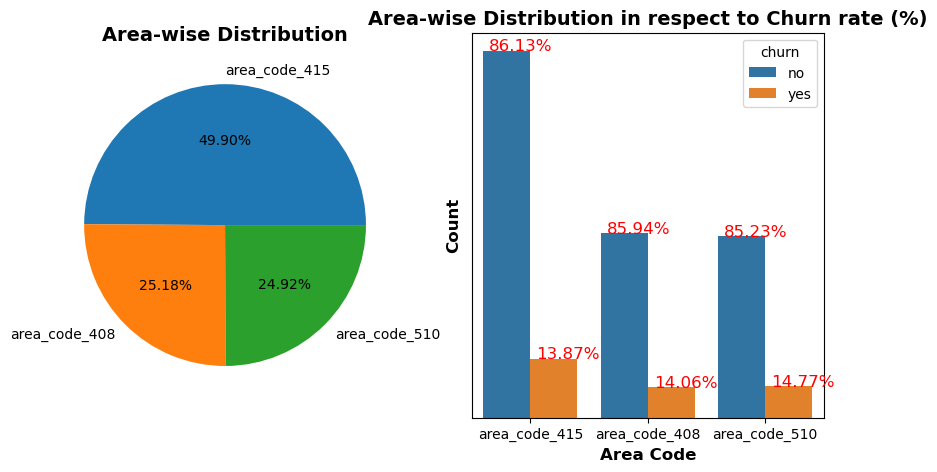

In [21]:
plt.figure(figsize=(12,10))
plot_cat('area_code')
plt.title("Area-wise Distribution", fontsize=14, fontweight='bold')
plt.subplot(1,2,2)
plot = sns.countplot(x="area_code", hue="churn", data=data)
barplot_values_percent(plot)
plt.title("Area-wise Distribution in respect to Churn rate (%)", fontsize=14, fontweight='bold')
plt.ylabel("Count", fontsize=12, fontweight='bold')
plt.xlabel("Area Code", fontsize=12, fontweight='bold')
plt.gca().set_yticks([])
plt.gca().set_yticklabels([])
plt.show()

<Figure size 1200x1000 with 0 Axes>

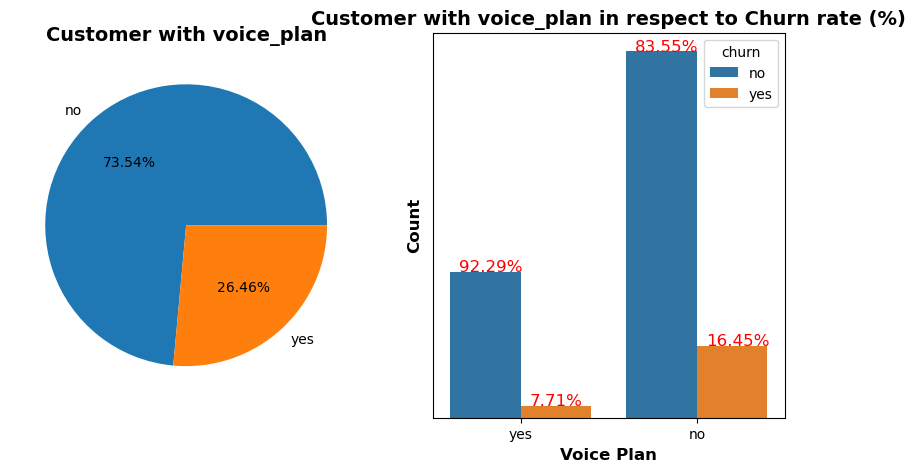

In [230]:
plt.figure(figsize=(12,10))
plot_cat('voice_plan')
plt.title("Customer with voice_plan", fontsize=14, fontweight='bold')
plt.subplot(1,2,2)
plot = sns.countplot(x="voice_plan", hue="churn", data=data)
barplot_values_percent(plot)
plt.title("Customer with voice_plan in respect to Churn rate (%)", fontsize=14, fontweight='bold')
plt.ylabel("Count", fontsize=12, fontweight='bold')
plt.xlabel("Voice Plan", fontsize=12, fontweight='bold')
plt.gca().set_yticks([])
plt.gca().set_yticklabels([])
plt.show()

<Figure size 1200x1000 with 0 Axes>

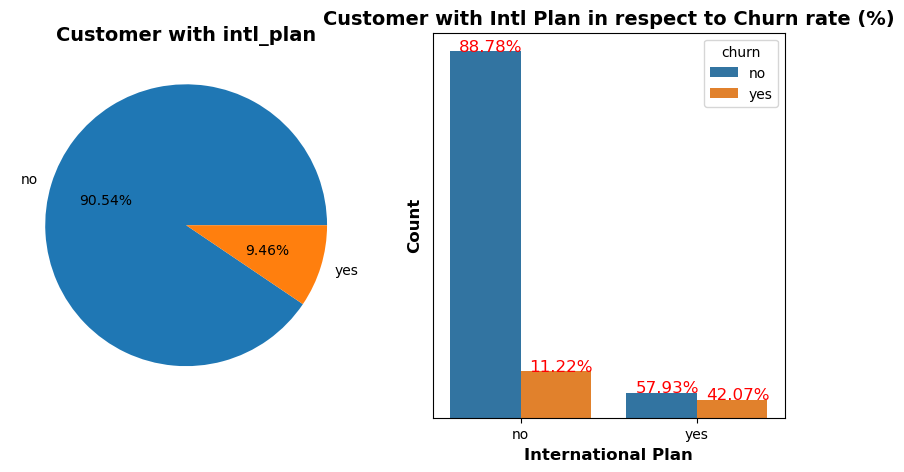

In [23]:
plt.figure(figsize=(12,10))
plot_cat('intl_plan')
plt.title("Customer with intl_plan", fontsize=14, fontweight='bold')
plt.subplot(1,2,2)
plot = sns.countplot(x="intl_plan", hue="churn", data=data)
barplot_values_percent(plot)
plt.title("Customer with Intl Plan in respect to Churn rate (%)", fontsize=14, fontweight='bold')
plt.ylabel("Count", fontsize=12, fontweight='bold')
plt.xlabel("International Plan", fontsize=12, fontweight='bold')
plt.gca().set_yticks([])
plt.gca().set_yticklabels([])
plt.show()

Text(0.5, 1.0, 'Overall Churn Rate')

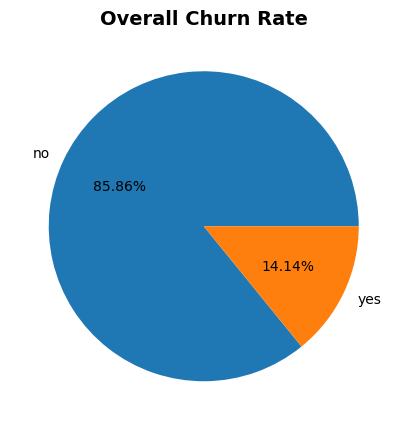

In [24]:
feature='churn'
plt.figure(figsize=(5,7))
data_plot=[]
for i in range(data[feature].nunique()):
    data_plot.append(data[feature].value_counts()[i])
labels=data[feature].value_counts().index
ax=plt.pie(x=data_plot,labels=labels,autopct='%1.2f%%')
plt.title("Overall Churn Rate", fontsize=14, fontweight='bold')

Text(0, 0.5, 'Internaltional charges')

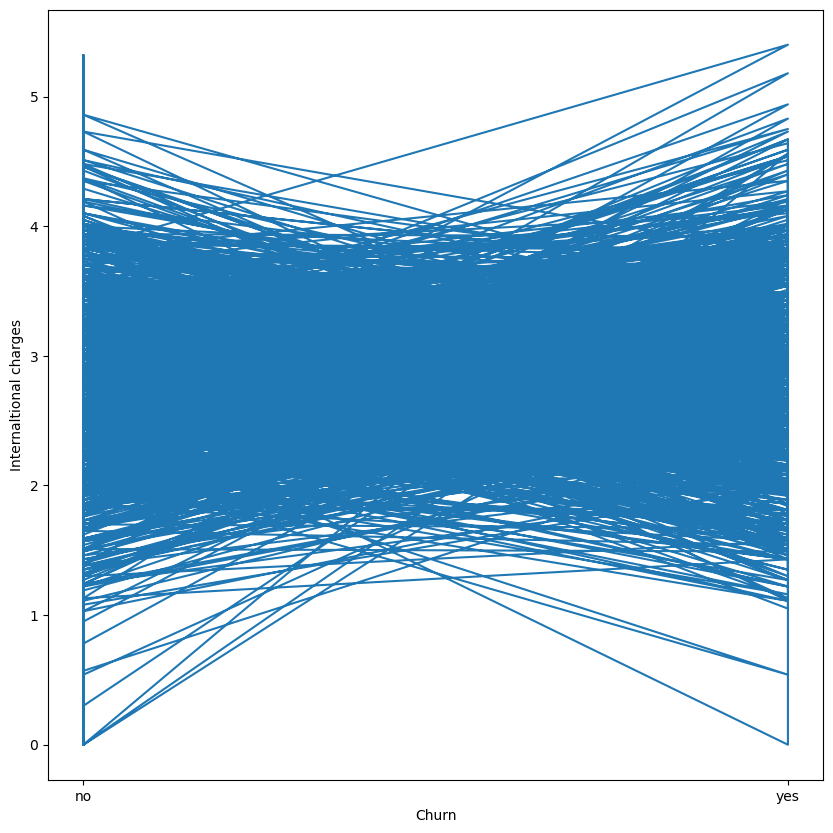

In [25]:
#Let's check for international plan charges.
plt.figure(figsize=(10,10))
plt.plot(data["churn"],data["intl_charge"])
plt.xlabel("Churn",size=10)
plt.ylabel("Internaltional charges",size=10)

## From the above graph we can we see the churn rates varies highly between the international charges between the range 1.5 to 4

In [26]:
import warnings
warnings.filterwarnings('ignore')

In [27]:
def continous_plot(feature):
    plt.figure(figsize=(17,5))
    plt.subplot(1,2,1)
    sns.histplot(data[data['churn']=='no'][feature],kde=True)
    plt.title(feature+"-Churn : No")
    plt.subplot(1,2,2)
    sns.histplot(data[data['churn']=='yes'][feature],kde=True)
    plt.title(feature+"-Churn : Yes")
    plt.show()

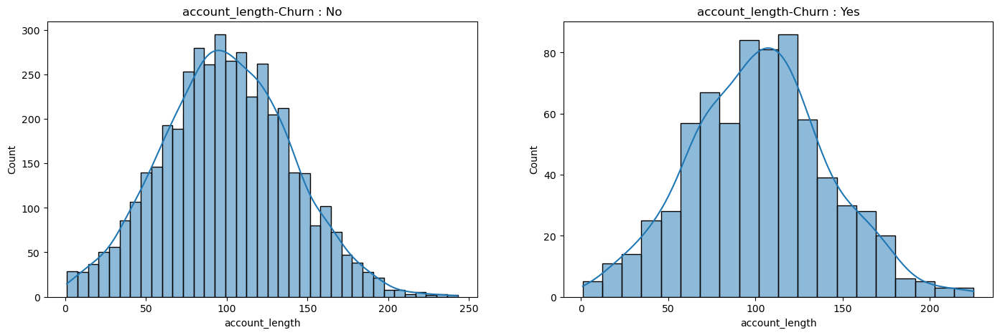

Skewness: 0.11
Kurtosis: -0.1


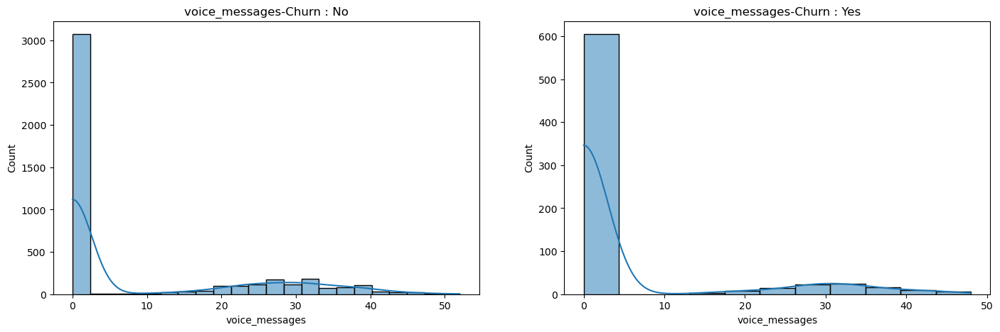

Skewness: 1.35
Kurtosis: 0.2


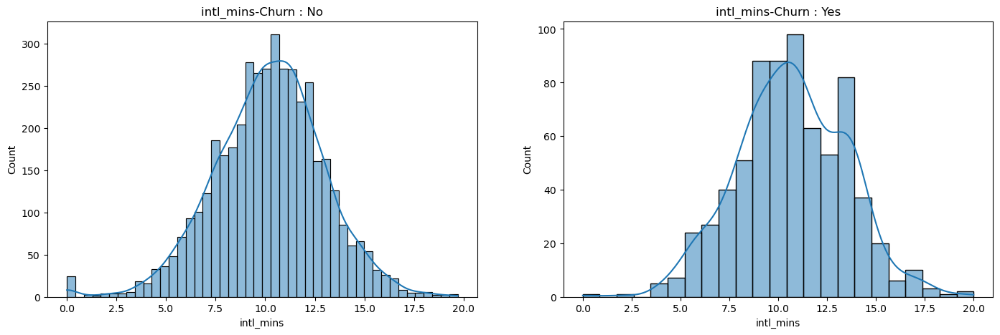

Skewness: -0.21
Kurtosis: 0.66


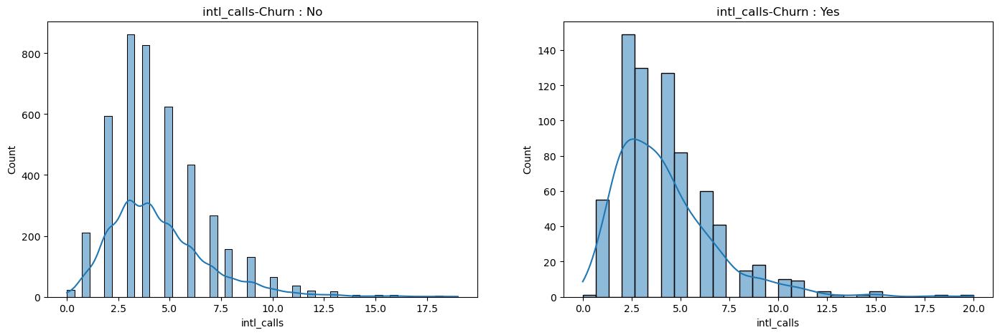

Skewness: 1.36
Kurtosis: 3.27


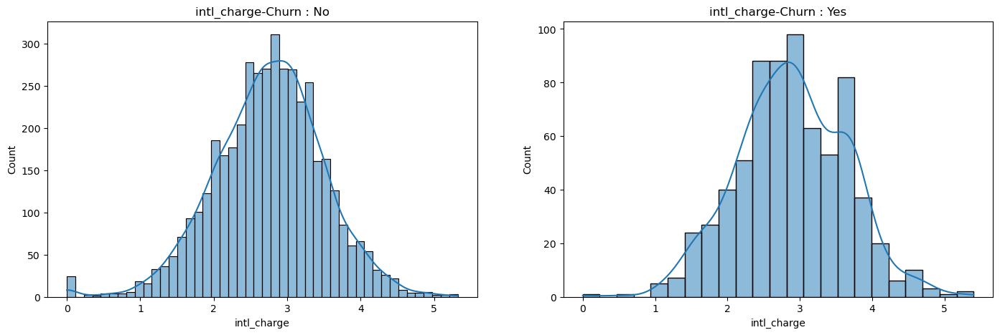

Skewness: -0.21
Kurtosis: 0.66


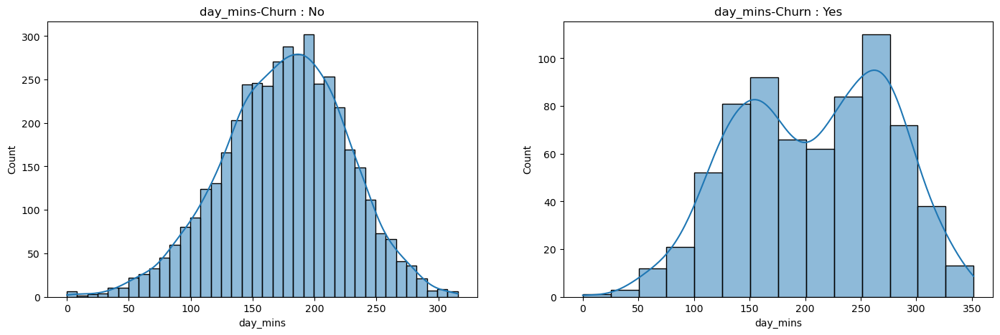

Skewness: -0.01
Kurtosis: -0.02


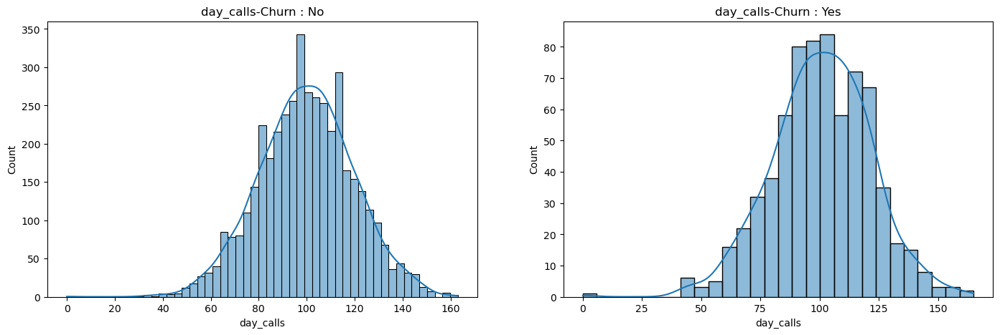

Skewness: -0.08
Kurtosis: 0.18


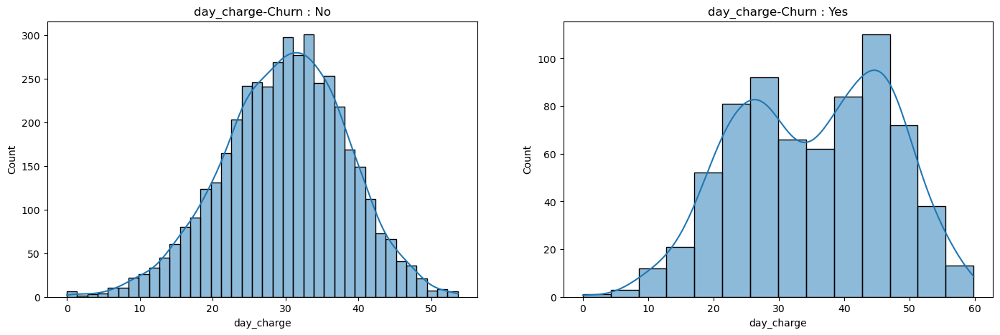

Skewness: -0.01
Kurtosis: -0.02


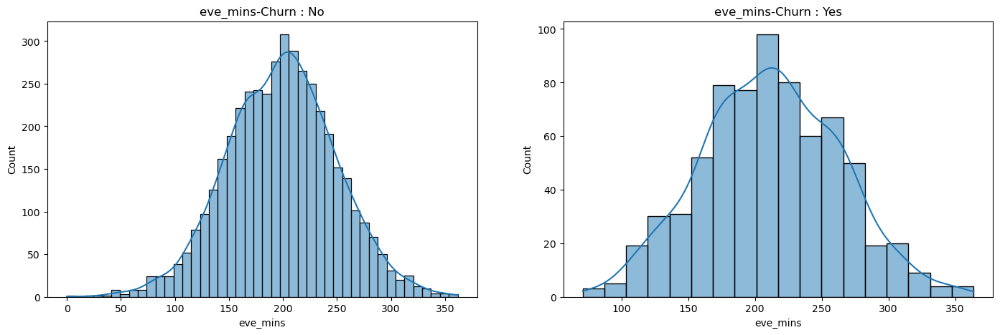

Skewness: -0.01
Kurtosis: 0.07


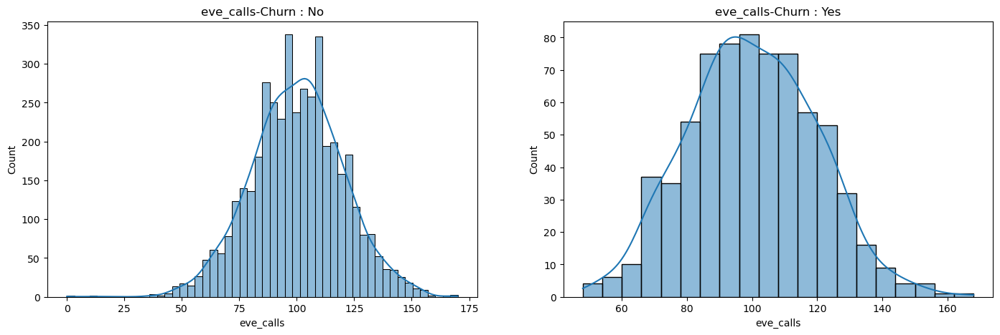

Skewness: -0.02
Kurtosis: 0.12


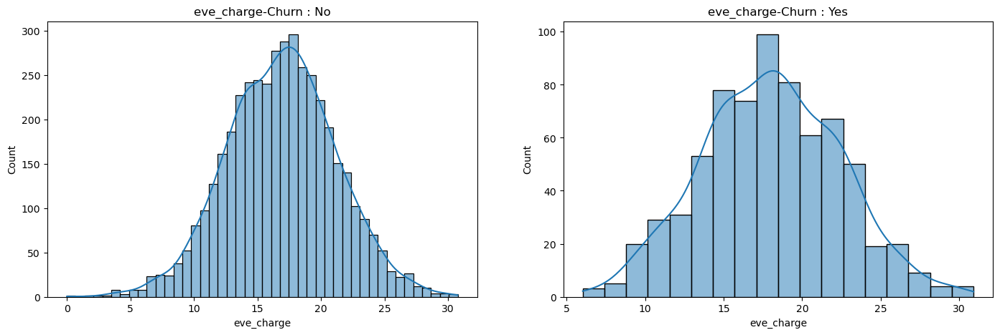

Skewness: -0.01
Kurtosis: 0.05


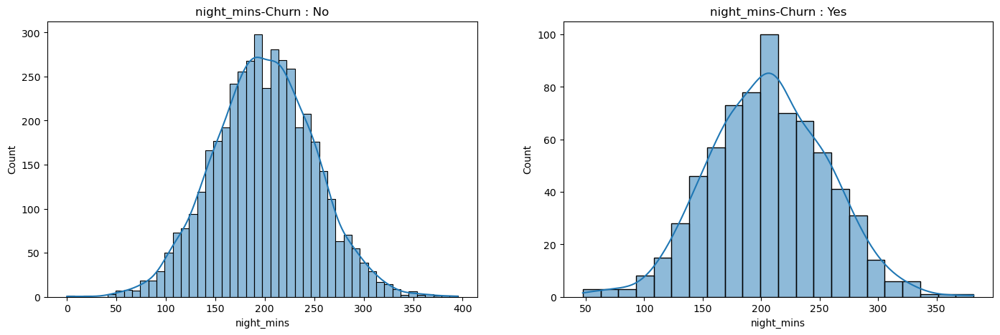

Skewness: 0.02
Kurtosis: 0.08


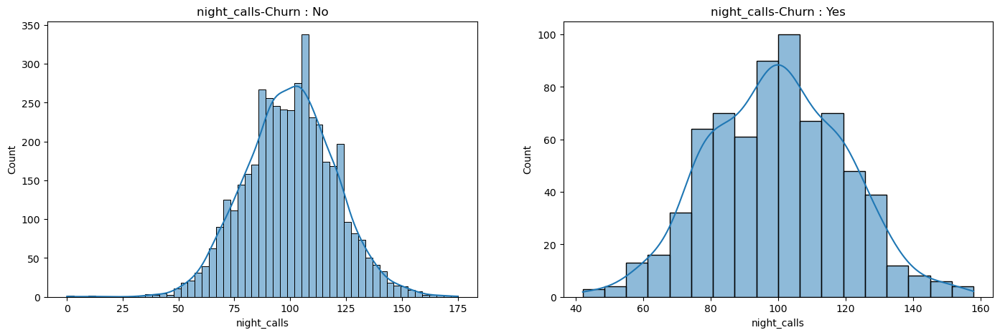

Skewness: 0.0
Kurtosis: 0.14


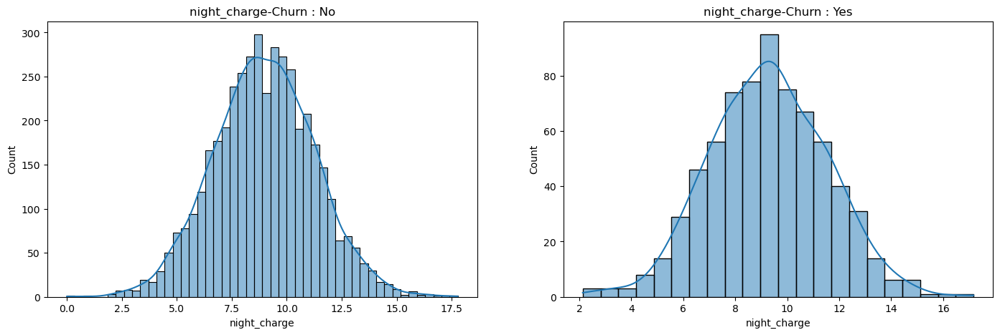

Skewness: 0.02
Kurtosis: 0.08


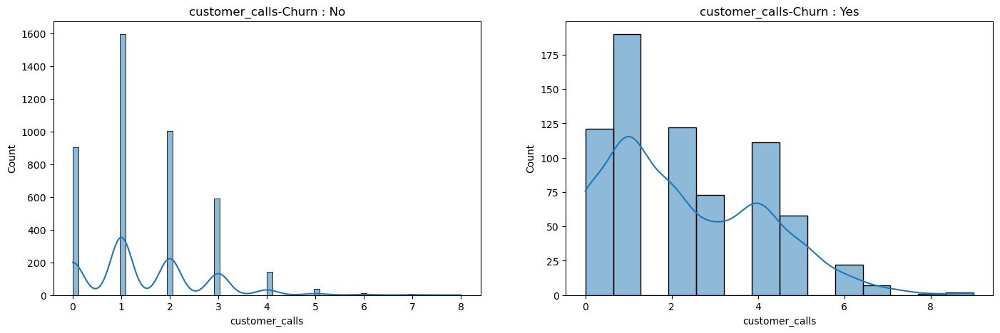

Skewness: 1.04
Kurtosis: 1.48


In [28]:
# Check for normal distribution and skewness
for i in numerical_columns:
    continous_plot(i)
    print('Skewness:',round(data[i].skew(),2))
    print('Kurtosis:',round(data[i].kurt(),2))

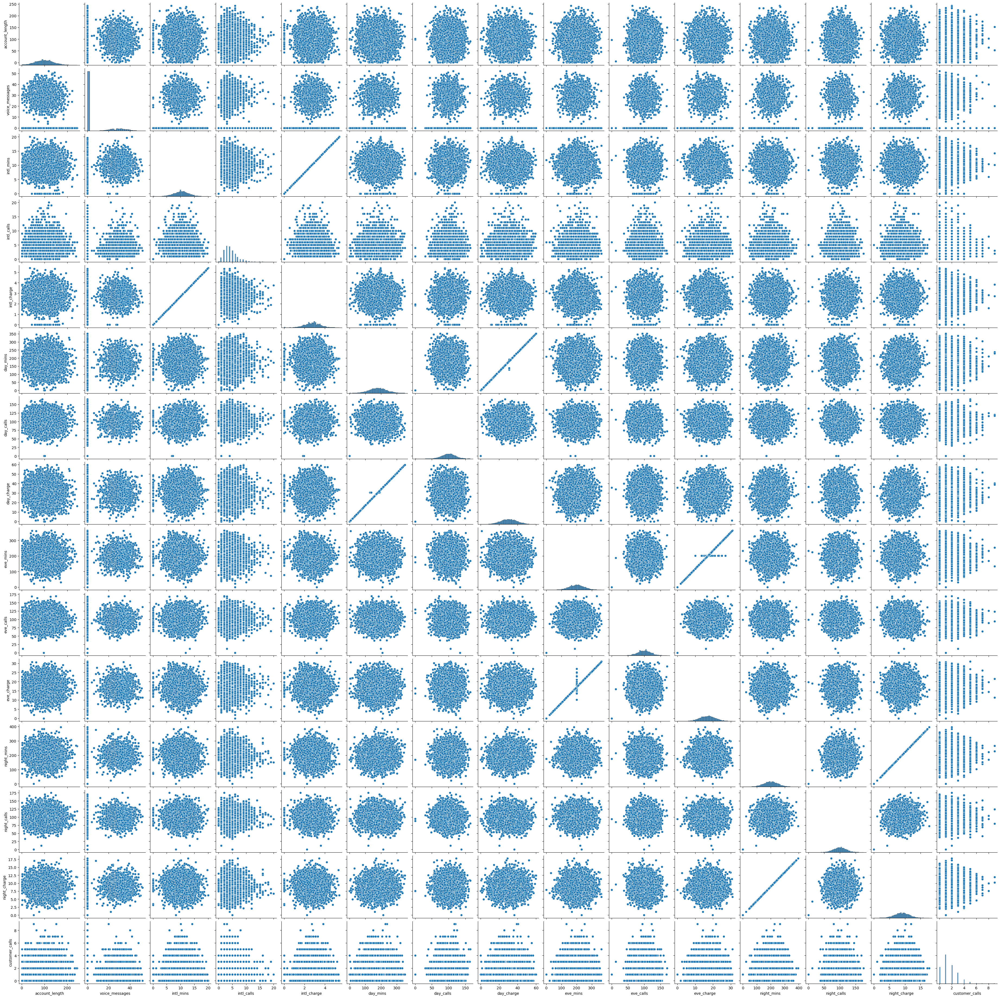

In [29]:
sns.pairplot(data[numerical_columns])

## Checking for Outliers

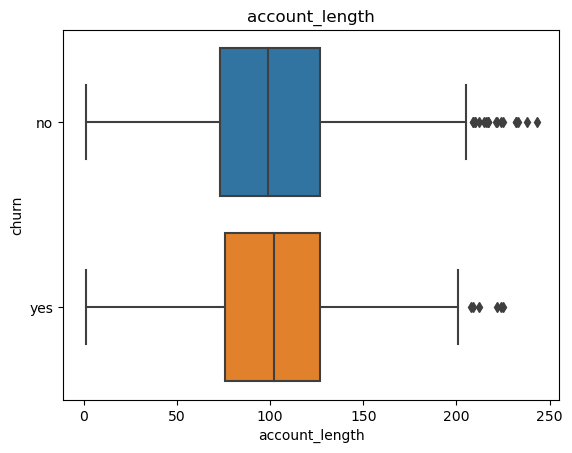

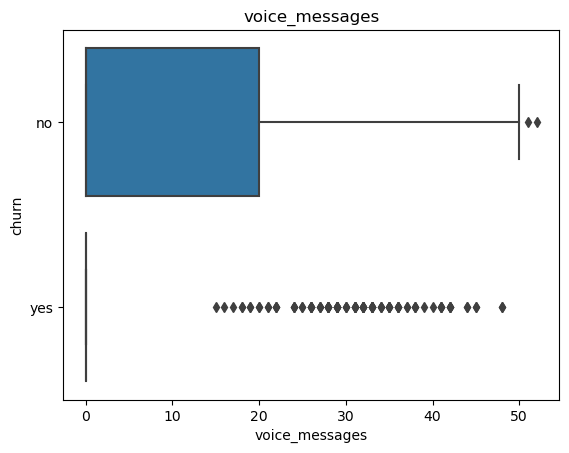

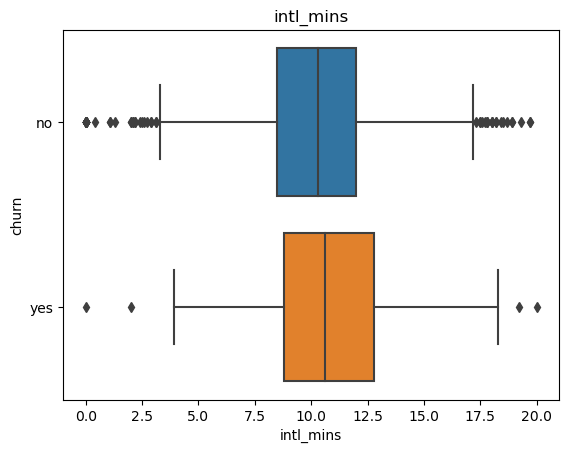

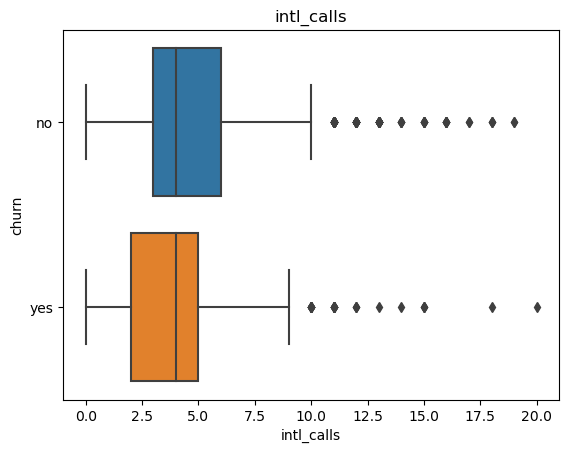

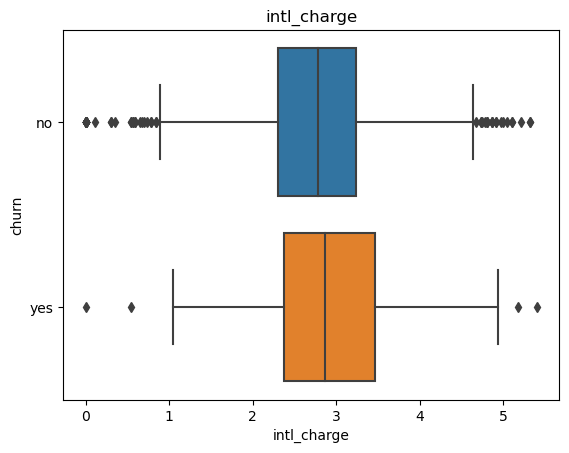

...

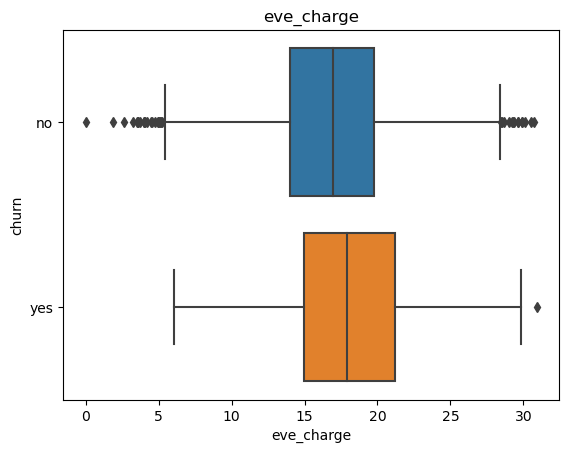

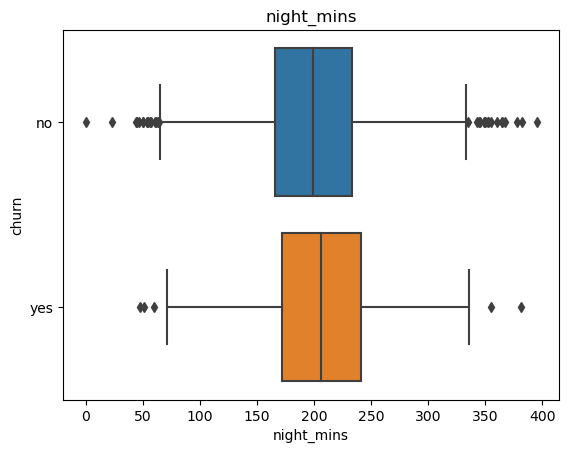

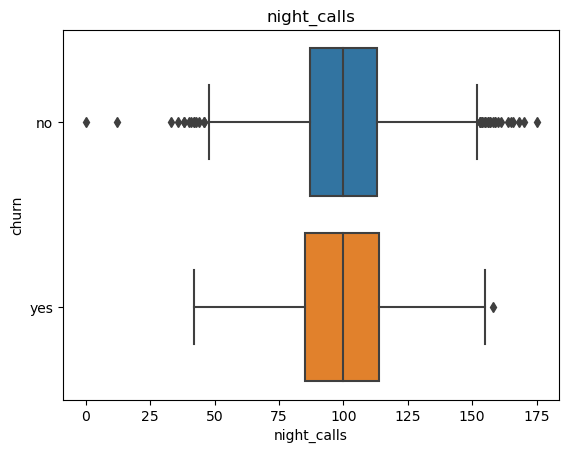

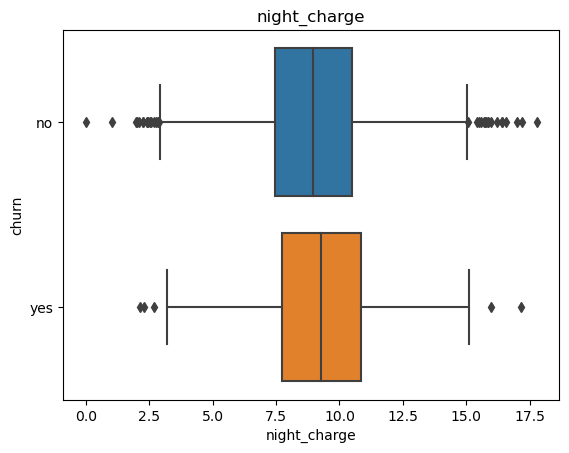

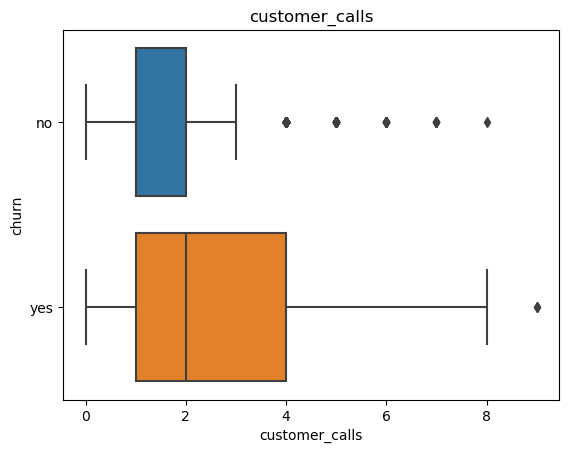

In [30]:
for i in numerical_columns:
    sns.boxplot(x=data[i],y=data['churn'])
    plt.title(i)
    plt.show()

# Feature Extraction

# Convert categorical variables into numerical

In [31]:
from sklearn import preprocessing

In [32]:
LE = preprocessing.LabelEncoder()

In [33]:
preprocessed_data=pd.DataFrame()
label_categorical={}
for i in categorical_columns:
    preprocessed_data[i]=data[[i]].apply(LE.fit_transform)
    k=0
    for j in LE.classes_:
        label_categorical[j]=k
        k=k+1
print(label_categorical)
for i in numerical_columns:
    preprocessed_data[i]=data[i]
preprocessed_data

{'AK': 0, 'AL': 1, 'AR': 2, 'AZ': 3, 'CA': 4, 'CO': 5, 'CT': 6, 'DC': 7, 'DE': 8, 'FL': 9, 'GA': 10, 'HI': 11, 'IA': 12, 'ID': 13, 'IL': 14, 'IN': 15, 'KS': 16, 'KY': 17, 'LA': 18, 'MA': 19, 'MD': 20, 'ME': 21, 'MI': 22, 'MN': 23, 'MO': 24, 'MS': 25, 'MT': 26, 'NC': 27, 'ND': 28, 'NE': 29, 'NH': 30, 'NJ': 31, 'NM': 32, 'NV': 33, 'NY': 34, 'OH': 35, 'OK': 36, 'OR': 37, 'PA': 38, 'RI': 39, 'SC': 40, 'SD': 41, 'TN': 42, 'TX': 43, 'UT': 44, 'VA': 45, 'VT': 46, 'WA': 47, 'WI': 48, 'WV': 49, 'WY': 50, 'area_code_408': 0, 'area_code_415': 1, 'area_code_510': 2, 'no': 0, 'yes': 1}


,state,area_code,voice_plan,intl_plan,churn,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
0,16,1,1,0,0,128,25,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1
1,35,1,1,0,0,107,26,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1
2,31,1,0,0,0,137,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0
3,35,0,0,1,0,84,0,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2
4,36,1,0,1,0,75,0,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,11,0,1,0,0,50,40,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2
4996,49,1,0,0,1,152,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3
4997,7,1,0,0,0,61,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1
4998,7,2,0,0,0,109,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0


0 Customer calls have 11.83% Churn rate
1 Customer calls have 10.64% Churn rate
2 Customer calls have 10.83% Churn rate
3 Customer calls have 10.98% Churn rate
4 Customer calls have 44.05% Churn rate
5 Customer calls have 60.42% Churn rate
6 Customer calls have 64.71% Churn rate
7 Customer calls have 53.85% Churn rate
8 Customer calls have 50.00% Churn rate
9 Customer calls have 100.00% Churn rate


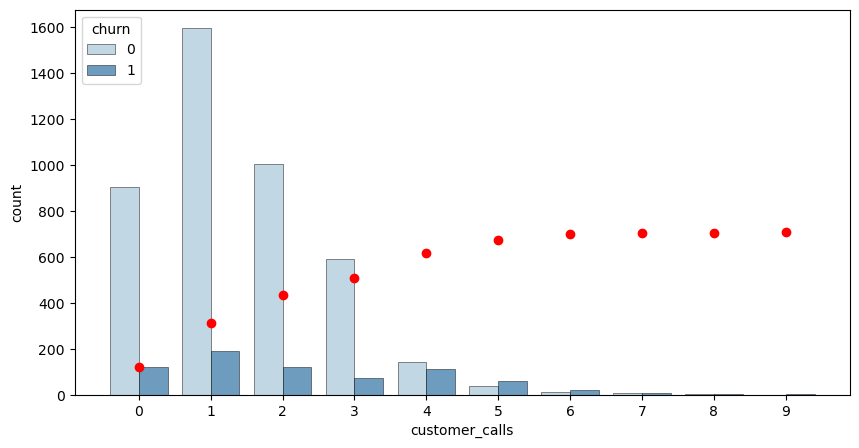

In [34]:
plt.figure(figsize=(10, 5))
sns.countplot(x='customer_calls', hue='churn', data=preprocessed_data, alpha=0.8, linewidth=0.4, edgecolor='black', palette='Blues')
total_count=0
for x,y in preprocessed_data.groupby('customer_calls'):
    total_count+=y['churn'].value_counts()[1]
    churn_rate=y['churn'].value_counts()[1]/len(y['churn'])*100
    print(x,"Customer calls have {:.2f}% Churn rate".format(churn_rate))
    plt.plot(x, total_count, marker='o', linestyle='-', color='r', label='Cumulative')

Whenever there are more customer calls the churn rates are higher, there are more then 300-350 unsatisfied customers who have called more than once.

From the above graph, we can observe that churn is directly proportional to customer calls. That is, churn is increasing with increase in customer service calls.

In [35]:
import pickle
# Save model using pickle
with open("label_categorical.pkl", "wb") as file:
    pickle.dump(label_categorical, file)

In [36]:
with open("label_categorical.pkl", "rb") as file:
    label_categorical = pickle.load(file)

In [37]:
label_categorical['no']

0

In [38]:
# Scaling all the variables to a range of 0 to 1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
Norm_data=scaler.fit_transform(preprocessed_data)
Norm_data=round(pd.DataFrame(Norm_data, columns=preprocessed_data.columns),2)
Norm_data.head()

,state,area_code,voice_plan,intl_plan,churn,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
0,0.32,0.5,1.0,0.0,0.0,0.52,0.48,0.50,0.15,0.50,0.75,0.67,0.75,0.54,0.58,0.54,0.62,0.52,0.62,0.11
1,0.70,0.5,1.0,0.0,0.0,0.44,0.50,0.68,0.15,0.69,0.46,0.75,0.46,0.54,0.61,0.54,0.64,0.59,0.64,0.11
2,0.62,0.5,0.0,0.0,0.0,0.56,0.00,0.61,0.25,0.61,0.69,0.69,0.69,0.33,0.65,0.33,0.41,0.59,0.41,0.00
3,0.70,0.0,0.0,1.0,0.0,0.34,0.00,0.33,0.35,0.33,0.85,0.43,0.85,0.17,0.52,0.17,0.50,0.51,0.50,0.22
4,0.72,0.5,0.0,1.0,0.0,0.31,0.00,0.50,0.15,0.51,0.47,0.68,0.47,0.41,0.72,0.41,0.47,0.69,0.47,0.33


In [39]:
Norm_data.shape

(5000, 20)

In [40]:
import pickle
# Save model using pickle
with open("normalizer.pkl", "wb") as file:
    pickle.dump(scaler, file)

In [41]:
with open("normalizer.pkl", "rb") as file:
    scaler = pickle.load(file)

In [42]:
Norm_data=scaler.transform(preprocessed_data)
Norm_data=round(pd.DataFrame(Norm_data, columns=preprocessed_data.columns),2)
Norm_data.head()

,state,area_code,voice_plan,intl_plan,churn,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
0,0.32,0.5,1.0,0.0,0.0,0.52,0.48,0.50,0.15,0.50,0.75,0.67,0.75,0.54,0.58,0.54,0.62,0.52,0.62,0.11
1,0.70,0.5,1.0,0.0,0.0,0.44,0.50,0.68,0.15,0.69,0.46,0.75,0.46,0.54,0.61,0.54,0.64,0.59,0.64,0.11
2,0.62,0.5,0.0,0.0,0.0,0.56,0.00,0.61,0.25,0.61,0.69,0.69,0.69,0.33,0.65,0.33,0.41,0.59,0.41,0.00
3,0.70,0.0,0.0,1.0,0.0,0.34,0.00,0.33,0.35,0.33,0.85,0.43,0.85,0.17,0.52,0.17,0.50,0.51,0.50,0.22
4,0.72,0.5,0.0,1.0,0.0,0.31,0.00,0.50,0.15,0.51,0.47,0.68,0.47,0.41,0.72,0.41,0.47,0.69,0.47,0.33


In [43]:
import numpy as np

In [44]:
def check_outliers(Norm_data1):
    outliers_dict={}
    outliers_percentage={}
    for i in numerical_columns:
        # Sort the data in ascending order
        sorted_data = sorted(Norm_data1[i])

        # Calculate quartiles
        Q1 = np.percentile(sorted_data, 25)
        Q3 = np.percentile(sorted_data, 75)

        # Calculate IQR
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - (1.5 * IQR)
        upper_bound = Q3 + (1.5 * IQR)
        outliers=[]
        outliers = [x for x in sorted_data if x < lower_bound or x > upper_bound]

        outliers_dict[i]=outliers
        outliers_percentage[i]=np.round(len(outliers)/len(data)*100,4)
    return outliers_dict,outliers_percentage

In [45]:
new_df_without_outliers=Norm_data.copy()
new_df_without_outliers.shape

(5000, 20)

In [46]:
print("Before ->",new_df_without_outliers.shape,end=" After ->")
outliers_dict,outliers_percentage=check_outliers(new_df_without_outliers[numerical_columns])
j=list(outliers_dict.keys())[np.argmax(list(outliers_percentage.values()))]
new_df_without_outliers=new_df_without_outliers[~(new_df_without_outliers[j].isin(outliers_dict[j]))]
print(new_df_without_outliers.shape)

Before -> (5000, 20) After ->(4601, 20)


In [47]:
new_df_without_outliers.shape

(4601, 20)

## Feature Selection

- Chi-squared Test:It is used for categorical feature selection by measuring the dependency between each feature and the target variable using the chi-squared statistical test. Features with high dependency are selected.

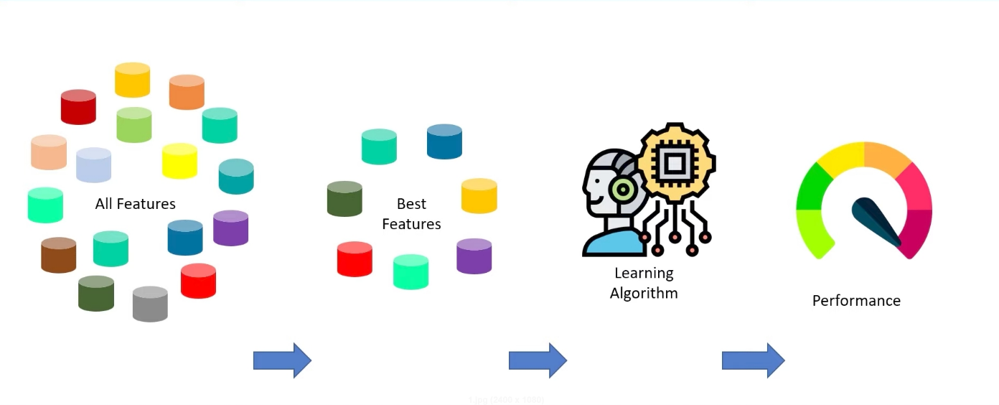

## Categorical Features

In [48]:
# Separating input and output variables
X=Norm_data.drop('churn',axis=1)
Y=Norm_data['churn']

In [49]:
for i in numerical_columns:
    X=X.drop(i,axis=1)

In [50]:
X

,state,area_code,voice_plan,intl_plan
0,0.32,0.5,1.0,0.0
1,0.70,0.5,1.0,0.0
2,0.62,0.5,0.0,0.0
3,0.70,0.0,0.0,1.0
4,0.72,0.5,0.0,1.0
...,...,...,...,...
4995,0.22,0.0,1.0,0.0
4996,0.98,0.5,0.0,0.0
4997,0.14,0.5,0.0,0.0
4998,0.14,1.0,0.0,0.0


In [51]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [52]:
#Select features according to the k highest scores.
chi_best = SelectKBest(score_func=chi2,k=len(X.columns))

In [53]:
k_best=chi_best.fit(X,Y)

In [54]:
k_best_scores = np.round(k_best.scores_,3)
k_best_scores

array([4.10000e-02, 6.50000e-02, 4.50580e+01, 3.03963e+02])

In [55]:
k_features=k_best.transform(X)

In [56]:
k_best.get_feature_names_out()

array(['state', 'area_code', 'voice_plan', 'intl_plan'], dtype=object)

In [57]:
k_df=pd.DataFrame(k_best_scores,k_best.get_feature_names_out()).reset_index()
k_df.columns=["Feature","Score"]

In [58]:
k_df=k_df.sort_values(by="Score",ascending=False).reset_index(drop=True)
k_df

,Feature,Score
0,intl_plan,303.963
1,voice_plan,45.058
2,area_code,0.065
3,state,0.041


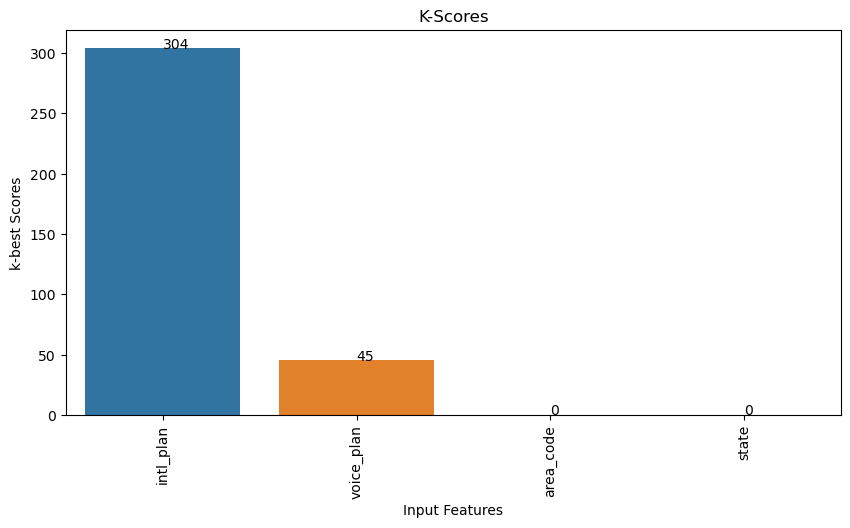

In [59]:
# Create the bar plot using seaborn
plt.figure(figsize=(10,5))
ax = sns.barplot(data=k_df,x='Feature',y='Score')
# Set x-axis tick label rotation
ax.set_xticklabels(k_df.Feature, rotation=90)
for i, v in enumerate(k_df.values):
    ax.text(i,v[1],f"{v[1]:.0f}")
# Add labels and title
plt.xlabel('Input Features')
plt.ylabel('k-best Scores')
plt.title('K-Scores')
# Display the plot
plt.show()

## Numerical Features

In [60]:
# Separating input and output variables
X=Norm_data.drop('churn',axis=1)
Y=Norm_data['churn']

In [61]:
for i in categorical_columns:
    if i != 'churn':
        X=X.drop(i,axis=1)

In [62]:
X

,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
0,0.52,0.48,0.50,0.15,0.50,0.75,0.67,0.75,0.54,0.58,0.54,0.62,0.52,0.62,0.11
1,0.44,0.50,0.68,0.15,0.69,0.46,0.75,0.46,0.54,0.61,0.54,0.64,0.59,0.64,0.11
2,0.56,0.00,0.61,0.25,0.61,0.69,0.69,0.69,0.33,0.65,0.33,0.41,0.59,0.41,0.00
3,0.34,0.00,0.33,0.35,0.33,0.85,0.43,0.85,0.17,0.52,0.17,0.50,0.51,0.50,0.22
4,0.31,0.00,0.50,0.15,0.51,0.47,0.68,0.47,0.41,0.72,0.41,0.47,0.69,0.47,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.20,0.77,0.50,0.25,0.49,0.67,0.77,0.67,0.61,0.74,0.61,0.75,0.66,0.75,0.22
4996,0.62,0.00,0.74,0.10,0.74,0.52,0.55,0.52,0.71,0.43,0.71,0.54,0.65,0.54,0.33
4997,0.25,0.00,0.68,0.20,0.68,0.40,0.54,0.40,0.48,0.75,0.48,0.54,0.55,0.54,0.11
4998,0.45,0.00,0.43,0.30,0.43,0.54,0.41,0.54,0.47,0.54,0.47,0.57,0.51,0.57,0.00


In [63]:
from sklearn.feature_selection import mutual_info_classif

In [64]:
#Select features according to the k highest scores.
mutual_info_test = SelectKBest(score_func=mutual_info_classif,k=len(X.columns))

In [65]:
k_best=mutual_info_test.fit(X,Y)

In [66]:
k_best_scores = np.round(k_best.scores_,3)
k_best_scores

array([0.   , 0.013, 0.001, 0.001, 0.006, 0.055, 0.003, 0.058, 0.005,
       0.   , 0.009, 0.   , 0.   , 0.006, 0.03 ])

In [67]:
k_features=k_best.transform(X)

In [68]:
k_best.get_feature_names_out()

array(['account_length', 'voice_messages', 'intl_mins', 'intl_calls',
       'intl_charge', 'day_mins', 'day_calls', 'day_charge', 'eve_mins',
       'eve_calls', 'eve_charge', 'night_mins', 'night_calls',
       'night_charge', 'customer_calls'], dtype=object)

In [69]:
k_df1=pd.DataFrame(k_best_scores,k_best.get_feature_names_out()).reset_index()
k_df1.columns=["Feature","Score"]
k_df1

,Feature,Score
0,account_length,0.000
1,voice_messages,0.013
2,intl_mins,0.001
3,intl_calls,0.001
4,intl_charge,0.006
5,day_mins,0.055
6,day_calls,0.003
7,day_charge,0.058
8,eve_mins,0.005
9,eve_calls,0.000


In [70]:
k_df=pd.concat([k_df,k_df1]).reset_index(drop=True)

In [71]:
k_df=k_df.sort_values(by="Score",ascending=False).reset_index(drop=True)
k_df

,Feature,Score
0,intl_plan,303.963
1,voice_plan,45.058
2,area_code,0.065
3,day_charge,0.058
4,day_mins,0.055
5,state,0.041
6,customer_calls,0.030
7,voice_messages,0.013
8,eve_charge,0.009
9,intl_charge,0.006


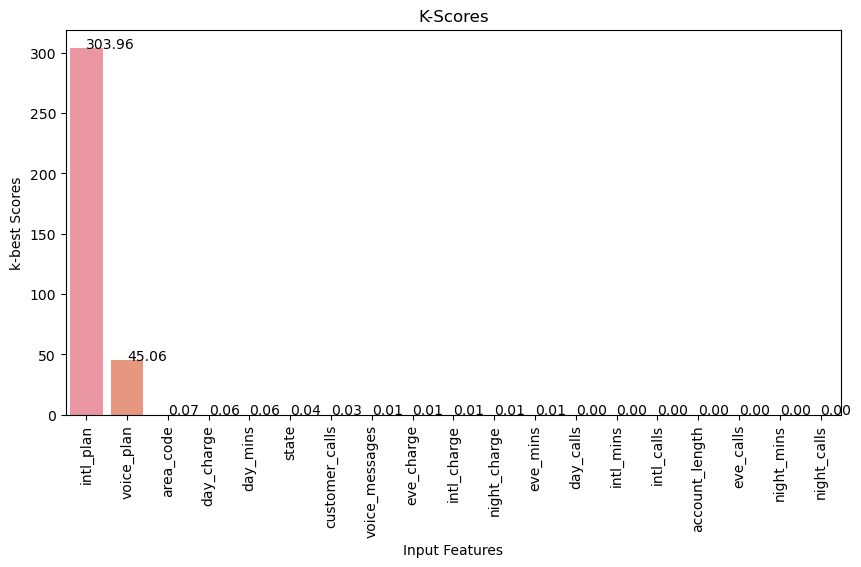

In [72]:
# Create the bar plot using seaborn
plt.figure(figsize=(10,5))
ax = sns.barplot(data=k_df,x='Feature',y='Score')
# Set x-axis tick label rotation
ax.set_xticklabels(k_df.Feature, rotation=90)
for i, v in enumerate(k_df.values):
    ax.text(i,v[1],f"{v[1]:.2f}")
# Add labels and title
plt.xlabel('Input Features')
plt.ylabel('k-best Scores')
plt.title('K-Scores')
# Display the plot
plt.show()

In [73]:
df_reduced=Norm_data.drop(k_df["Feature"].tail(3).values,axis=1)
df_reduced

,state,area_code,voice_plan,intl_plan,churn,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_charge,night_charge,customer_calls
0,0.32,0.5,1.0,0.0,0.0,0.52,0.48,0.50,0.15,0.50,0.75,0.67,0.75,0.54,0.54,0.62,0.11
1,0.70,0.5,1.0,0.0,0.0,0.44,0.50,0.68,0.15,0.69,0.46,0.75,0.46,0.54,0.54,0.64,0.11
2,0.62,0.5,0.0,0.0,0.0,0.56,0.00,0.61,0.25,0.61,0.69,0.69,0.69,0.33,0.33,0.41,0.00
3,0.70,0.0,0.0,1.0,0.0,0.34,0.00,0.33,0.35,0.33,0.85,0.43,0.85,0.17,0.17,0.50,0.22
4,0.72,0.5,0.0,1.0,0.0,0.31,0.00,0.50,0.15,0.51,0.47,0.68,0.47,0.41,0.41,0.47,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.22,0.0,1.0,0.0,0.0,0.20,0.77,0.50,0.25,0.49,0.67,0.77,0.67,0.61,0.61,0.75,0.22
4996,0.98,0.5,0.0,0.0,1.0,0.62,0.00,0.74,0.10,0.74,0.52,0.55,0.52,0.71,0.71,0.54,0.33
4997,0.14,0.5,0.0,0.0,0.0,0.25,0.00,0.68,0.20,0.68,0.40,0.54,0.40,0.48,0.48,0.54,0.11
4998,0.14,1.0,0.0,0.0,0.0,0.45,0.00,0.43,0.30,0.43,0.54,0.41,0.54,0.47,0.47,0.57,0.00


# correlation

In [74]:
# Calculate correlation matrix for numerical columns
corr_matrix=Norm_data.corr()

In [75]:
arr = corr_matrix.values
np.fill_diagonal(arr, 0)
modified_df = pd.DataFrame(arr, columns=corr_matrix.columns,index=corr_matrix.index)

In [76]:
x_coff=pd.DataFrame(abs(modified_df).apply(np.max),columns=['x'])
x_coff.reset_index(inplace=True)
x_coff.columns=['x','coefficient']

In [77]:
y_coff=pd.DataFrame(abs(modified_df).apply(np.argmax))
argmax1=[]
for i in y_coff.values:
    argmax1.append(i[0])
argmax1
variablenames=[]
for i in argmax1:
    variablenames.append(modified_df.columns[i])
mydict={"y":variablenames}
y_coff=pd.DataFrame(mydict)
corr_df=pd.concat([y_coff,x_coff],axis=1)
highly_related=corr_df[corr_df.coefficient.duplicated()==False].sort_values(by='coefficient',ascending=False)
highly_related

,y,x,coefficient
16,night_charge,night_mins,0.999952
10,day_charge,day_mins,0.999759
7,intl_charge,intl_mins,0.999254
13,eve_charge,eve_mins,0.997632
2,voice_messages,voice_plan,0.954465
3,churn,intl_plan,0.259123
19,churn,customer_calls,0.214000
8,churn,intl_calls,0.046893
0,voice_plan,state,0.030075
1,intl_plan,area_code,0.029187


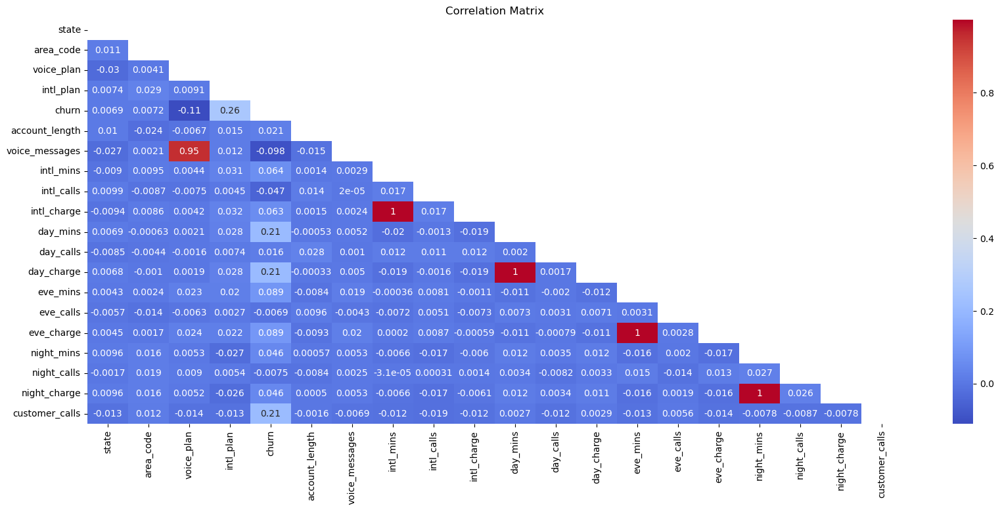

In [78]:
# Visualize correlation matrix using a heatmap
plt.figure(figsize=(20,8))

#Return an array of zeros with the same shape and type as a given array.
mask = np.zeros_like(corr_matrix, dtype=np.bool)

#Return the indices for the upper-triangle of arr and putting it as True.
mask[np.triu_indices_from(mask)] = True

#If passed, data will not be shown in cells where ``mask`` is True.
    #Cells with missing values are automatically masked.
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', mask=mask)
plt.title('Correlation Matrix')
plt.show()

In [79]:
x=abs(corr_matrix.churn).sort_values(ascending=False).index
y=abs(corr_matrix.churn).sort_values(ascending=False)

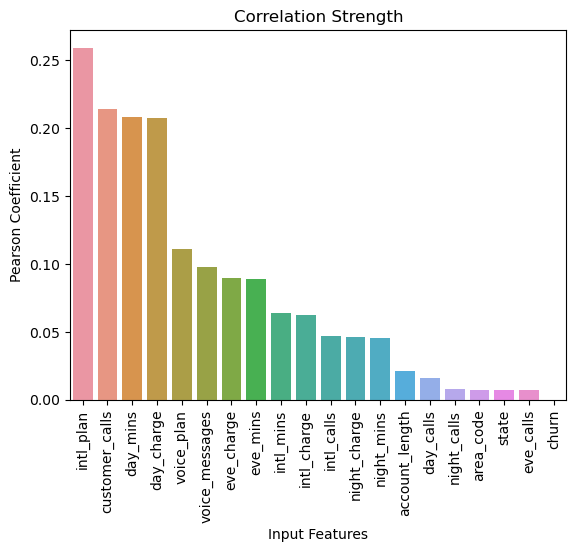

In [80]:
# Create the bar plot using seaborn
ax = sns.barplot(x,y)
# Set x-axis tick label rotation
ax.set_xticklabels(x, rotation=90)
# Add labels and title
plt.xlabel('Input Features')
plt.ylabel('Pearson Coefficient')
plt.title('Correlation Strength')
# Display the plot
plt.show()

## Features that are related with others may cause Multicolinearity , we remove highly correlated features and less related with target variable

In [81]:
highly_related.x.values

array(['night_mins', 'day_mins', 'intl_mins', 'eve_mins', 'voice_plan',
       'intl_plan', 'customer_calls', 'intl_calls', 'state', 'area_code',
       'account_length', 'night_calls', 'eve_calls'], dtype=object)

In [82]:
df_reduced_correlation=Norm_data.drop(['night_mins', 'day_mins', 'intl_mins', 'eve_mins'],axis=1)
df_reduced_correlation

,state,area_code,voice_plan,intl_plan,churn,account_length,voice_messages,intl_calls,intl_charge,day_calls,day_charge,eve_calls,eve_charge,night_calls,night_charge,customer_calls
0,0.32,0.5,1.0,0.0,0.0,0.52,0.48,0.15,0.50,0.67,0.75,0.58,0.54,0.52,0.62,0.11
1,0.70,0.5,1.0,0.0,0.0,0.44,0.50,0.15,0.69,0.75,0.46,0.61,0.54,0.59,0.64,0.11
2,0.62,0.5,0.0,0.0,0.0,0.56,0.00,0.25,0.61,0.69,0.69,0.65,0.33,0.59,0.41,0.00
3,0.70,0.0,0.0,1.0,0.0,0.34,0.00,0.35,0.33,0.43,0.85,0.52,0.17,0.51,0.50,0.22
4,0.72,0.5,0.0,1.0,0.0,0.31,0.00,0.15,0.51,0.68,0.47,0.72,0.41,0.69,0.47,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.22,0.0,1.0,0.0,0.0,0.20,0.77,0.25,0.49,0.77,0.67,0.74,0.61,0.66,0.75,0.22
4996,0.98,0.5,0.0,0.0,1.0,0.62,0.00,0.10,0.74,0.55,0.52,0.43,0.71,0.65,0.54,0.33
4997,0.14,0.5,0.0,0.0,0.0,0.25,0.00,0.20,0.68,0.54,0.40,0.75,0.48,0.55,0.54,0.11
4998,0.14,1.0,0.0,0.0,0.0,0.45,0.00,0.30,0.43,0.41,0.54,0.54,0.47,0.51,0.57,0.00


## Feature reduction methods - PCA

In [83]:
from sklearn.decomposition import PCA

In [84]:
pca = PCA()

In [85]:
X_PCA=Norm_data.drop('churn',axis=1)
X_PCA

,state,area_code,voice_plan,intl_plan,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
0,0.32,0.5,1.0,0.0,0.52,0.48,0.50,0.15,0.50,0.75,0.67,0.75,0.54,0.58,0.54,0.62,0.52,0.62,0.11
1,0.70,0.5,1.0,0.0,0.44,0.50,0.68,0.15,0.69,0.46,0.75,0.46,0.54,0.61,0.54,0.64,0.59,0.64,0.11
2,0.62,0.5,0.0,0.0,0.56,0.00,0.61,0.25,0.61,0.69,0.69,0.69,0.33,0.65,0.33,0.41,0.59,0.41,0.00
3,0.70,0.0,0.0,1.0,0.34,0.00,0.33,0.35,0.33,0.85,0.43,0.85,0.17,0.52,0.17,0.50,0.51,0.50,0.22
4,0.72,0.5,0.0,1.0,0.31,0.00,0.50,0.15,0.51,0.47,0.68,0.47,0.41,0.72,0.41,0.47,0.69,0.47,0.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.22,0.0,1.0,0.0,0.20,0.77,0.50,0.25,0.49,0.67,0.77,0.67,0.61,0.74,0.61,0.75,0.66,0.75,0.22
4996,0.98,0.5,0.0,0.0,0.62,0.00,0.74,0.10,0.74,0.52,0.55,0.52,0.71,0.43,0.71,0.54,0.65,0.54,0.33
4997,0.14,0.5,0.0,0.0,0.25,0.00,0.68,0.20,0.68,0.40,0.54,0.40,0.48,0.75,0.48,0.54,0.55,0.54,0.11
4998,0.14,1.0,0.0,0.0,0.45,0.00,0.43,0.30,0.43,0.54,0.41,0.54,0.47,0.54,0.47,0.57,0.51,0.57,0.00


In [86]:
X_reduced_pca = pca.fit_transform(X_PCA)

In [87]:
# cumulative variance
explained_variance = pca.explained_variance_ratio_
var1 = np.cumsum(np.round(explained_variance,decimals = 4)*100)
var1

array([ 31.42,  46.71,  57.39,  67.8 ,  73.53,  78.22,  82.84,  86.82,
        90.1 ,  92.64,  94.48,  96.23,  97.89,  99.46, 100.01, 100.02,
       100.02, 100.02, 100.02])

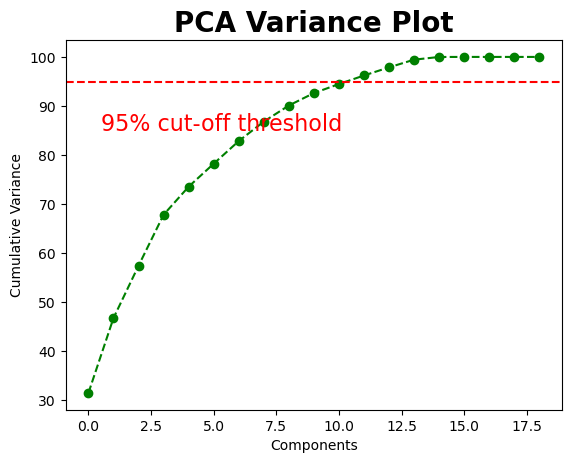

In [88]:
# Variance plot for PCA components obtained 
plt.plot(var1,color="green",marker='o', linestyle='--')
plt.title("PCA Variance Plot", size=20, fontweight='bold')
plt.xlabel("Components")
plt.ylabel("Cumulative Variance")
plt.axhline(y=95, color='r', linestyle='--')
plt.text(0.5,85, '95% cut-off threshold', color = 'red', fontsize=16)
#ax.grid(axis='x')
plt.show()

## 12 principal component explains the 96.23% variance

In [89]:
pca = PCA(n_components=12)

In [90]:
X_reduced_pca = pca.fit_transform(X_PCA)

In [91]:
# cumulative variance
explained_variance = pca.explained_variance_ratio_
var1 = np.cumsum(np.round(explained_variance,decimals = 4)*100)
var1

array([31.42, 46.71, 57.39, 67.8 , 73.53, 78.22, 82.84, 86.82, 90.1 ,
       92.64, 94.48, 96.23])

In [92]:
X_reduced_pca.shape

(5000, 12)

In [93]:
pca_list=[]
for i in range(X_reduced_pca.shape[1]):
    pca_list.append("PCA_"+str(i))

In [94]:
pca_DF=pd.DataFrame(X_reduced_pca,columns=pca_list)
pca_DF=pd.concat([pca_DF,Norm_data['churn']],axis=1)

In [95]:
pca_DF

,PCA_0,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,churn
0,0.806852,-0.016553,-0.190799,-0.038460,-0.346192,0.017147,-0.009202,-0.144705,0.117854,-0.058469,-0.059466,-0.073571,0.0
1,0.807232,-0.000673,0.163346,-0.151492,0.088972,0.084716,-0.224054,-0.191211,0.035378,-0.051247,-0.043541,-0.150558,0.0
2,-0.309840,-0.005072,0.067984,-0.098052,-0.250873,0.303387,-0.125903,0.166628,0.148212,-0.183075,0.029364,-0.066293,0.0
3,-0.308482,-0.423152,0.444655,0.847236,-0.494611,0.477106,0.326466,0.060392,-0.108282,0.036009,0.092483,0.196574,0.0
4,-0.303439,0.079103,0.425563,0.807685,0.081705,0.209932,0.092442,0.046197,-0.118705,0.159625,-0.036697,-0.087908,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.953575,-0.512701,-0.262766,0.008481,-0.238525,-0.066810,0.000143,-0.345421,-0.202784,0.051098,0.092084,-0.157367,0.0
4996,-0.314065,0.014542,0.411657,-0.197027,0.035458,-0.154508,-0.352402,-0.070640,0.200060,0.178525,-0.146457,0.045786,1.0
4997,-0.294681,-0.014056,-0.403960,0.017391,0.164374,0.137815,-0.195678,-0.051116,-0.161253,-0.059643,-0.026179,0.049484,0.0
4998,-0.292770,0.479245,-0.420616,-0.019667,-0.068045,0.087683,0.131499,-0.068797,0.042484,-0.182063,0.027006,0.210367,0.0


# Multicollinearity Check

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [97]:
def calc_vif(X):

    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [98]:
X = Norm_data.drop('churn',axis=1)
vif_scores=calc_vif(X).sort_values('VIF',ascending=False)
X_features_removed=[]
vif_scores

,variables,VIF
15,night_mins,173577.696066
17,night_charge,173509.524908
11,day_charge,25327.063111
9,day_mins,25322.149576
6,intl_mins,10018.845151
8,intl_charge,10004.086743
12,eve_mins,3566.469663
14,eve_charge,3553.181372
10,day_calls,22.097206
13,eve_calls,21.952202


In [99]:
for i in range(20):
    vif_scores.reset_index(drop=True,inplace=True)
    if vif_scores.loc[0][1]<5:
        break
    else:
        X_features_removed.append(vif_scores.loc[0][0])
        X = X.drop(vif_scores.loc[0][0],axis=1)
        vif_scores=calc_vif(X).sort_values('VIF',ascending=False)
vif_scores

,variables,VIF
0,account_length,4.671400
1,intl_calls,3.484034
2,state,3.392256
3,area_code,2.636520
4,customer_calls,2.217715
5,voice_messages,1.296321
6,intl_plan,1.102742


In [100]:
X_features_removed

['night_mins',
 'day_charge',
 'intl_mins',
 'eve_mins',
 'day_calls',
 'night_calls',
 'eve_calls',
 'voice_plan',
 'night_charge',
 'eve_charge',
 'intl_charge',
 'day_mins']

In [101]:
from scipy.stats import chi2_contingency

In [102]:
corr_matrix1=pd.DataFrame()
for var1 in categorical_columns:
    for var2 in categorical_columns:
        if var1 != var2:
            contingency_table = pd.crosstab(data[var1], data[var2])
            _, _, _, expected = chi2_contingency(contingency_table)
            cramers_v = np.sqrt(chi2_contingency(contingency_table)[0] / (data.shape[0] * min(contingency_table.shape) - 1))
            corr_matrix1.loc[var1, var2] = cramers_v
corr_matrix1

,area_code,voice_plan,intl_plan,churn,state
state,0.083241,0.065345,0.074668,0.098442,NaN
area_code,NaN,0.009321,0.022833,0.007504,0.083241
voice_plan,0.009321,NaN,0.005855,0.077819,0.065345
intl_plan,0.022833,0.005855,NaN,0.182543,0.074668
churn,0.007504,0.077819,0.182543,NaN,0.098442


- Cramer's V is a measure of association between categorical variables. When examining the values in a correlation matrix based on Cramer's V, 

- Cramer's V ranges from 0 to 1, where 0 indicates no association and 1 represents a strong association. 

- The values between 0 and 1 indicate the strength of association between the variables. Higher values indicate a stronger relationship between the variables.

In [103]:
df_VIF=Norm_data.drop(X_features_removed,axis=1)
df_VIF

,state,area_code,intl_plan,churn,account_length,voice_messages,intl_calls,customer_calls
0,0.32,0.5,0.0,0.0,0.52,0.48,0.15,0.11
1,0.70,0.5,0.0,0.0,0.44,0.50,0.15,0.11
2,0.62,0.5,0.0,0.0,0.56,0.00,0.25,0.00
3,0.70,0.0,1.0,0.0,0.34,0.00,0.35,0.22
4,0.72,0.5,1.0,0.0,0.31,0.00,0.15,0.33
...,...,...,...,...,...,...,...,...
4995,0.22,0.0,0.0,0.0,0.20,0.77,0.25,0.22
4996,0.98,0.5,0.0,1.0,0.62,0.00,0.10,0.33
4997,0.14,0.5,0.0,0.0,0.25,0.00,0.20,0.11
4998,0.14,1.0,0.0,0.0,0.45,0.00,0.30,0.00


## We dont see any strong association between categorical values

- Norm_data----> Original DataSet
- df_reduced----> After Feature Selection
- df_reduced_correlation---->Removing Correlated Features
- pca_DF----->After PCA
- df_VIF----->After VIF

In [104]:
data_frame_selection=[Norm_data,df_reduced,df_reduced_correlation,pca_DF,df_VIF]
data_frame_names=["Norm_data","df_reduced","df_reduced_correlation","pca_DF","df_VIF"]

### SMOTE (Synthetic Minority Over-sampling Technique) is another popular oversampling technique used to address class imbalance in classification problems. 

### It generates synthetic samples for the minority class by interpolating between existing minority class samples. 

In [105]:
from imblearn.over_sampling import SMOTE
def perform_smote(data_frame):
    if 'churn' in data_frame.columns:
        X=data_frame.drop('churn',axis=1)
        Y=data_frame['churn']
    else:
        X=data_frame.drop('churn_yes',axis=1)
        Y=data_frame['churn_yes']
    # create the SMOTE oversampler
    oversampler = SMOTE(random_state=42)
    # perform oversampling on the cleaned dataset
    X_resampled, Y_resampled = oversampler.fit_resample(X,Y)
    print("Class distribution before oversampling:")
    print(Y.value_counts())
    print("Class distribution after oversampling:")
    print(pd.Series(Y_resampled).value_counts())
    return X_resampled,Y_resampled

Performing Smote on Norm_data
Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


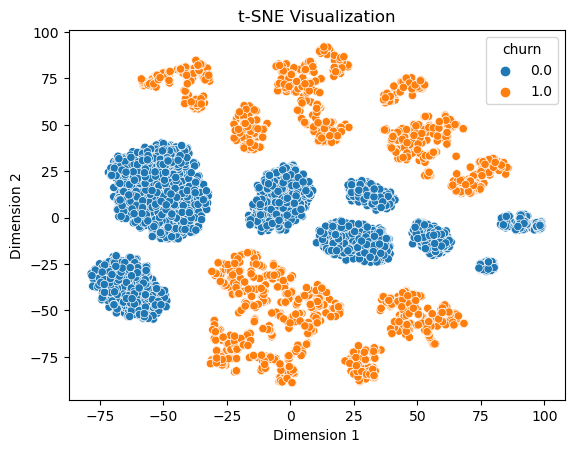

Performing Smote on df_reduced
Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


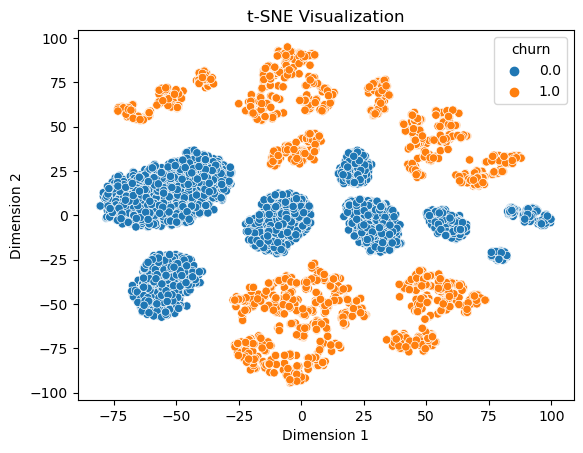

Performing Smote on df_reduced_correlation
Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


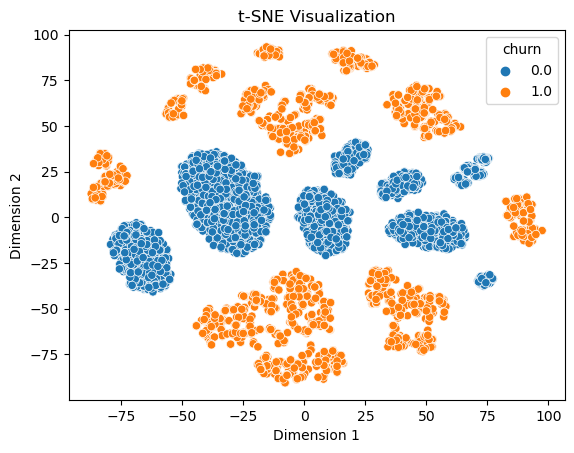

Performing Smote on pca_DF
Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


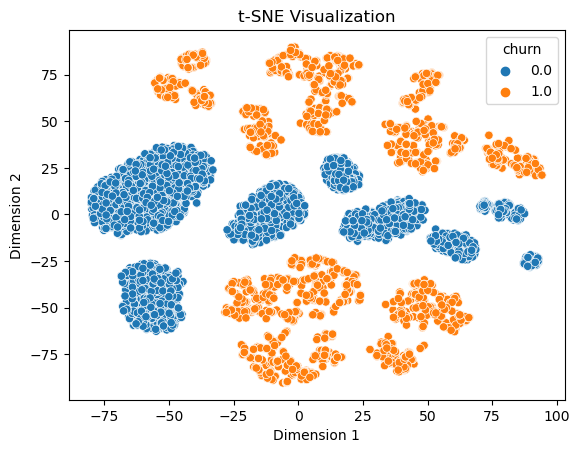

Performing Smote on df_VIF
Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


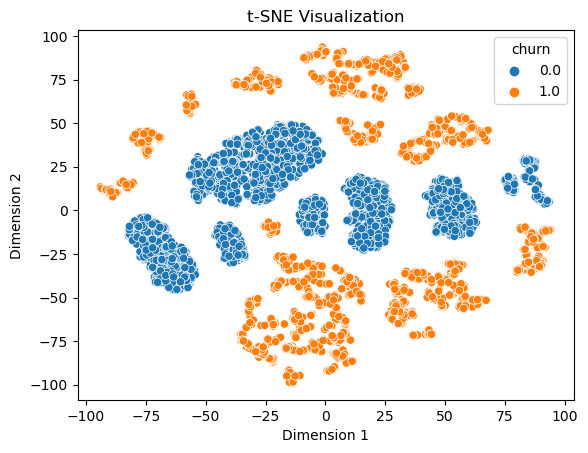

In [106]:
from sklearn.manifold import TSNE
data_frame_smote=[]
j=0
tsne = TSNE(n_components=2, random_state=42)
for i in data_frame_selection:
    print('Performing Smote on',data_frame_names[j])
    j=j+1
    X_resampled,Y_resampled=perform_smote(i)
    sampled_df=pd.concat([X_resampled,Y_resampled],axis=1)
    data_frame_smote.append(sampled_df)
    reduced_data = tsne.fit_transform(sampled_df)
    sns.scatterplot(reduced_data[:, 0], reduced_data[:, 1],hue=sampled_df.churn)
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title('t-SNE Visualization')
    plt.show()

# Model Building

In [107]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import roc_curve, auc

In [108]:
def model_Evaluate(model):
    # Predict values for Test dataset
    y_pred = model.predict(X_test)
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_test, y_pred)
    categories = ['No', 'Yes']
    sns.heatmap(cf_matrix, annot=True,cmap = 'Blues',fmt = '.1f',
    xticklabels = categories, yticklabels = categories)
    plt.ylabel("Actual values", fontdict = {'size':14}, labelpad = 10)
    plt.xlabel("Predicted values" , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)
    print(classification_report(y_test,y_pred))
    try:
        y_pred_a = model.predict_proba(X_test)
        fpr, tpr, _ =roc_curve(y_test, y_pred_a[:,1])
    except AttributeError as e:
        y_pred_a = model.decision_function(X_test)
        fpr, tpr, _ =roc_curve(y_test, y_pred_a)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot([0, 1], [0, 1], 'k--', label='Random')
    plt.plot(fpr, tpr,label='AUC = {:.2f}'.format(roc_auc))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')
    plt.show()

# Logistic Regression

In [109]:
from sklearn.linear_model import LogisticRegression

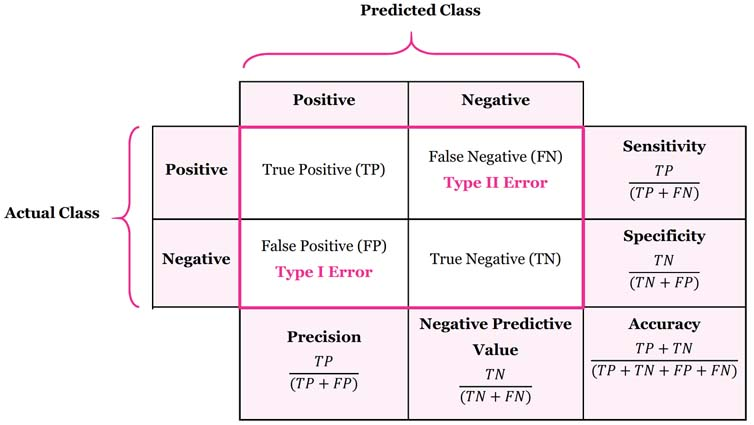

In [110]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score

## Creating a DataFrame named Evaluation_DF to store the test result of each model with different data.

In [111]:
Evaluation_df=pd.DataFrame(columns=['Modelname','Data','Accuracy','Precision','Recall','F1-Score'])

In [112]:
model_list={}

In [113]:
def modelaccuracy(y_test, y_pred,Modelname,Data):
    accuracy = np.round(accuracy_score(y_test, y_pred)*100,2)
    precision =  np.round(precision_score(y_test, y_pred,average='macro')*100,2)
    recall =  np.round(recall_score(y_test, y_pred,average='macro')*100,2)
    f1 =  np.round(f1_score(y_test, y_pred,average='macro')*100,2)
    mydict=dict()
    mydict={"Accuracy":accuracy,"Precision":precision,"Recall":recall,
            "F1-Score":f1,'Modelname':Modelname,'Data':Data}
    return mydict

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.79      0.76      0.78       844
         1.0       0.78      0.81      0.79       874

    accuracy                           0.79      1718
   macro avg       0.79      0.79      0.79      1718
weighted avg       0.79      0.79      0.79      1718



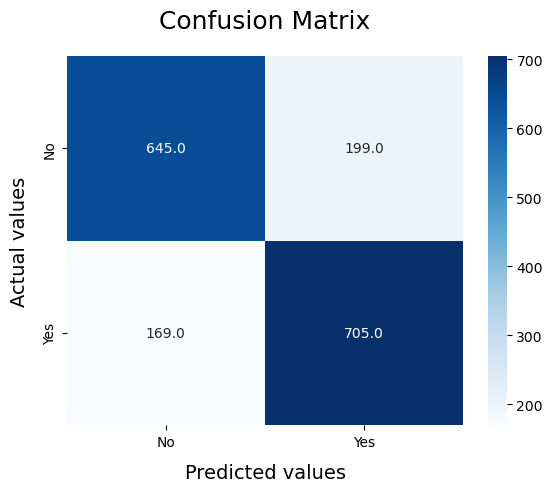

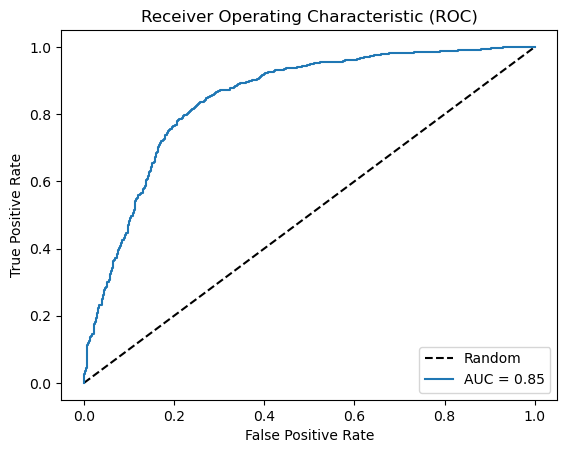

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.80      0.76      0.78       844
         1.0       0.78      0.81      0.79       874

    accuracy                           0.79      1718
   macro avg       0.79      0.79      0.79      1718
weighted avg       0.79      0.79      0.79      1718



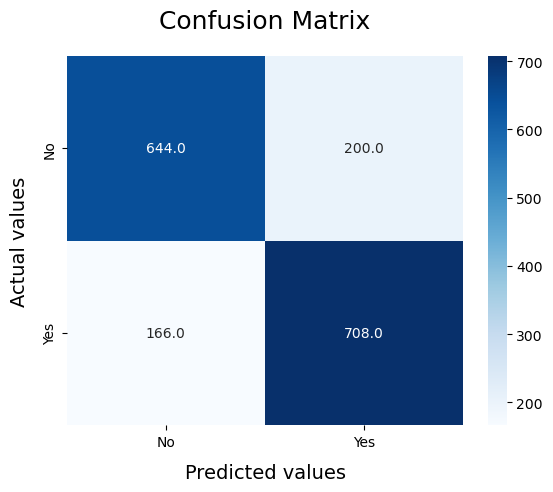

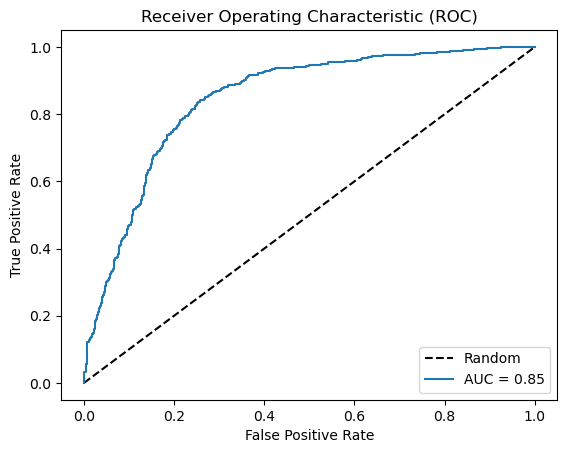

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.80      0.77      0.78       844
         1.0       0.78      0.81      0.80       874

    accuracy                           0.79      1718
   macro avg       0.79      0.79      0.79      1718
weighted avg       0.79      0.79      0.79      1718



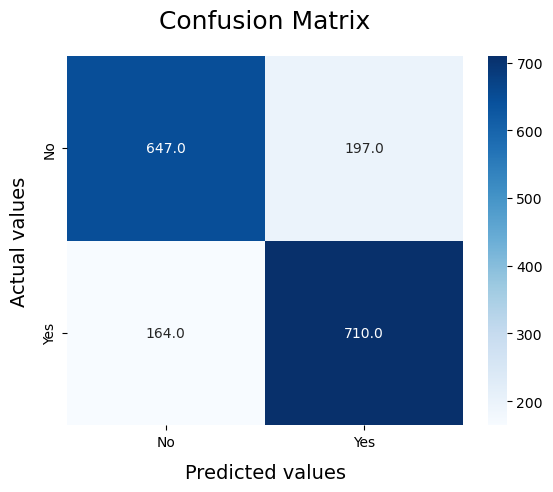

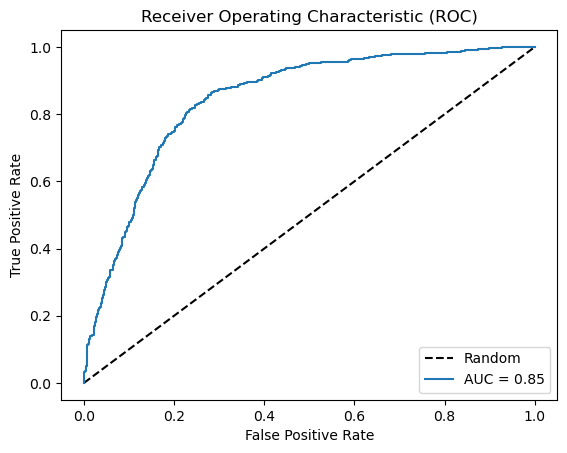

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.80      0.77      0.78       844
         1.0       0.78      0.81      0.80       874

    accuracy                           0.79      1718
   macro avg       0.79      0.79      0.79      1718
weighted avg       0.79      0.79      0.79      1718



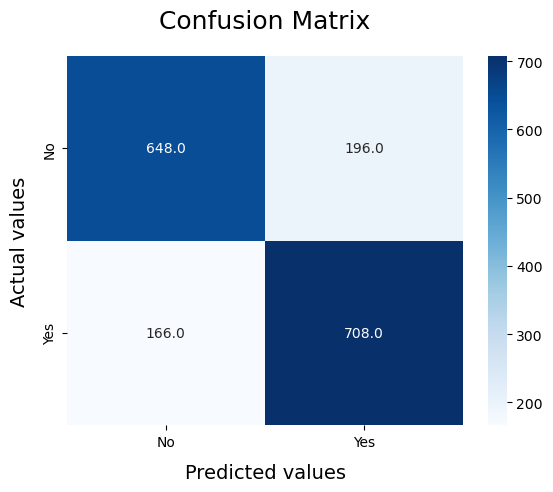

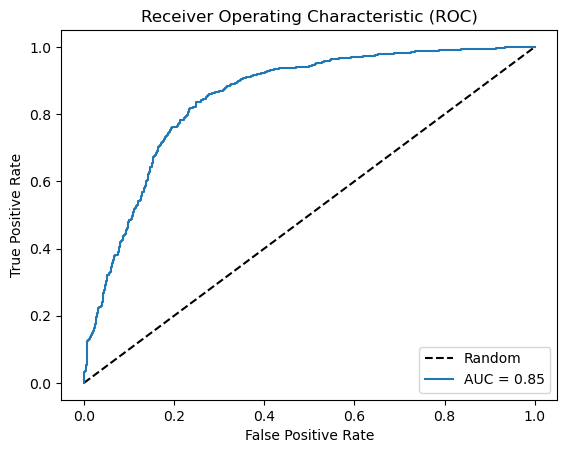

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.64      0.75      0.69       844
         1.0       0.71      0.60      0.65       874

    accuracy                           0.67      1718
   macro avg       0.68      0.67      0.67      1718
weighted avg       0.68      0.67      0.67      1718



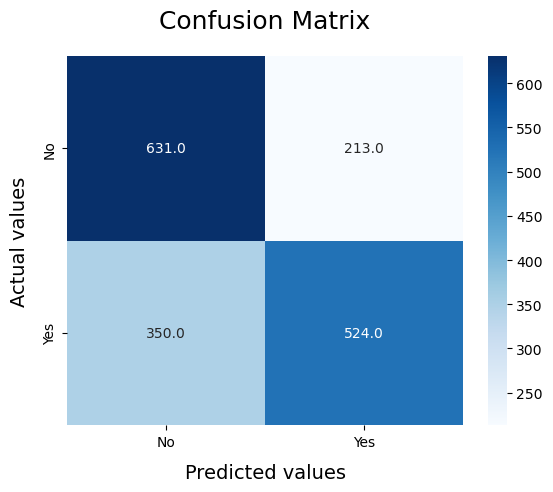

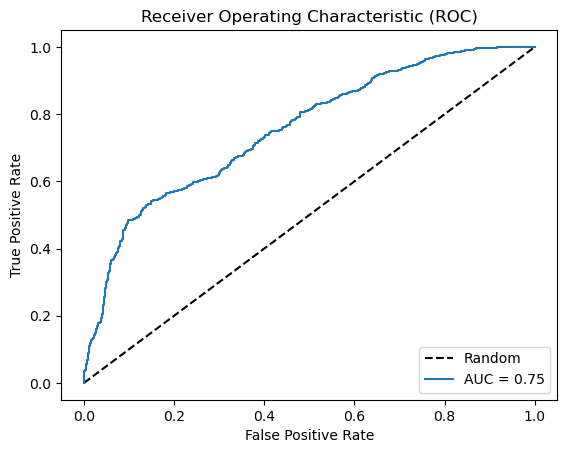

In [114]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    LRModel = LogisticRegression()
    LRModel.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_LR"]=LRModel
    model_Evaluate(LRModel)
    y_pred=LRModel.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Logistic Regression",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [115]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
2,Logistic Regression,df_reduced_correlation,78.99,79.03,78.95,78.96
3,Logistic Regression,pca_DF,78.93,78.96,78.89,78.90
1,Logistic Regression,df_reduced,78.70,78.74,78.66,78.67
0,Logistic Regression,Norm_data,78.58,78.61,78.54,78.55
4,Logistic Regression,df_VIF,67.23,67.71,67.36,67.10


## k-nearest neighbors (KNN)

In [116]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

In [117]:
k_values = range(1, 31)

In [118]:
accuracy_scores = []
X_resampled,Y_resampled=perform_smote(Norm_data)
X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)

Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


In [119]:
for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_scores.append(accuracy)

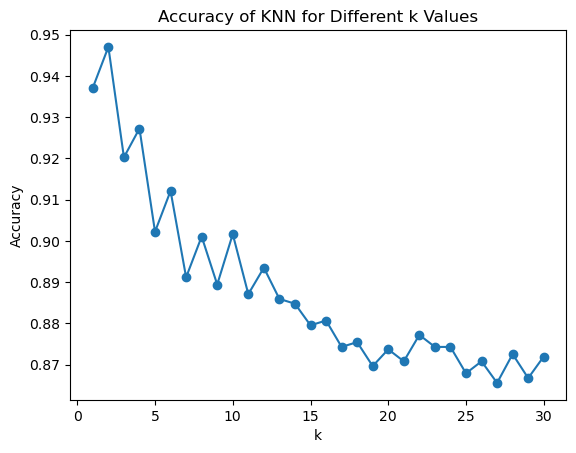

In [120]:
plt.plot(k_values, accuracy_scores, marker='o')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.title('Accuracy of KNN for Different k Values')
plt.show()

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.99      0.84      0.91       844
         1.0       0.87      0.99      0.93       874

    accuracy                           0.92      1718
   macro avg       0.93      0.92      0.92      1718
weighted avg       0.93      0.92      0.92      1718



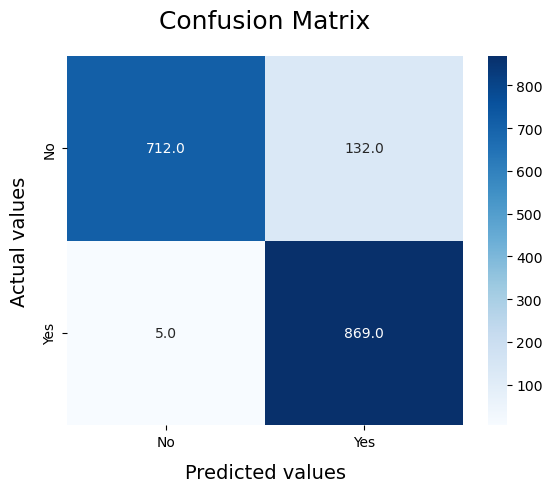

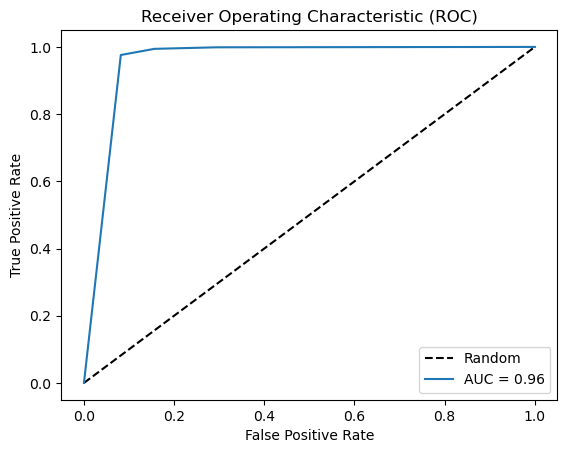

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.99      0.85      0.92       844
         1.0       0.87      0.99      0.93       874

    accuracy                           0.92      1718
   macro avg       0.93      0.92      0.92      1718
weighted avg       0.93      0.92      0.92      1718



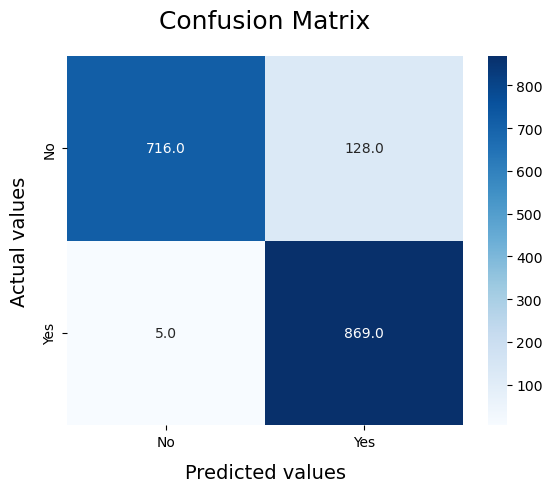

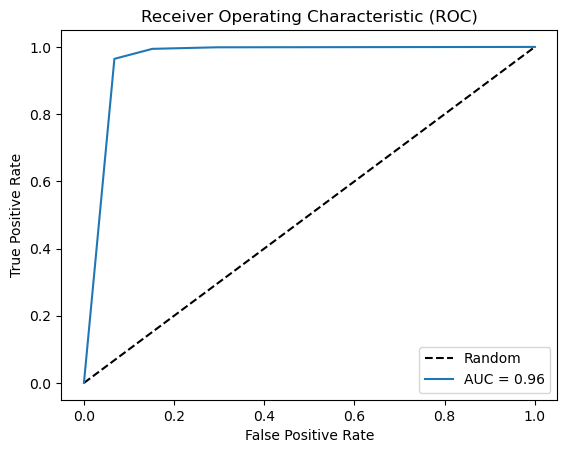

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.99      0.83      0.90       844
         1.0       0.86      0.99      0.92       874

    accuracy                           0.91      1718
   macro avg       0.93      0.91      0.91      1718
weighted avg       0.92      0.91      0.91      1718



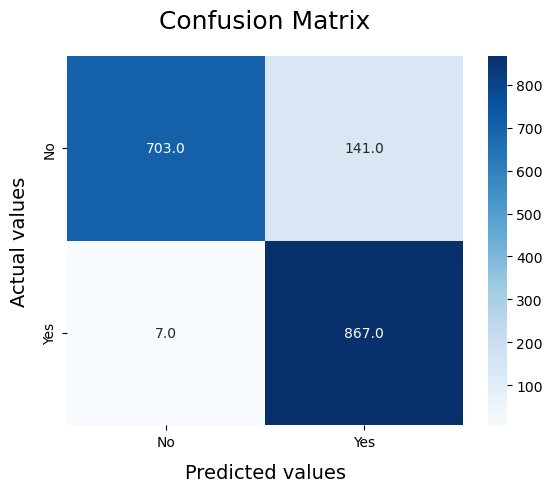

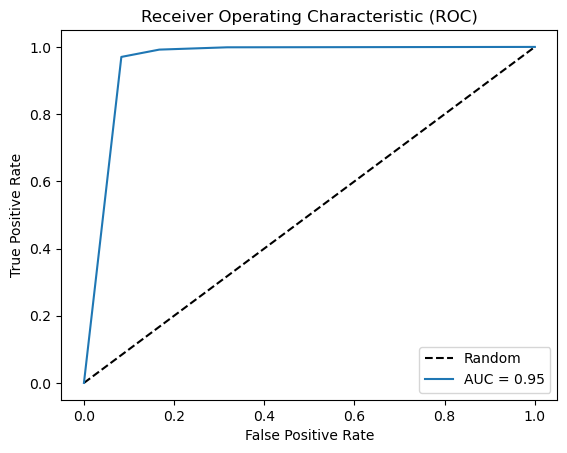

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.99      0.84      0.91       844
         1.0       0.86      0.99      0.92       874

    accuracy                           0.92      1718
   macro avg       0.93      0.92      0.92      1718
weighted avg       0.93      0.92      0.92      1718



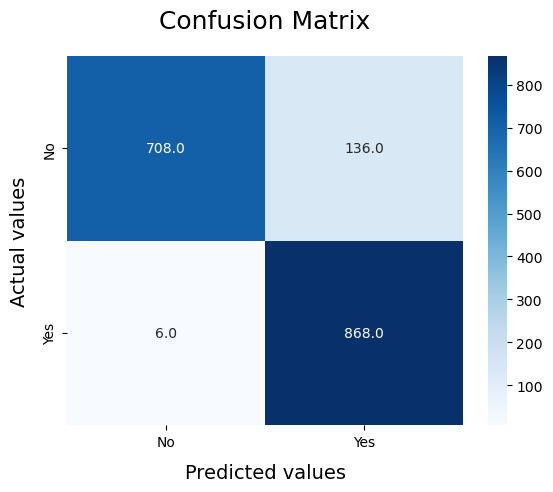

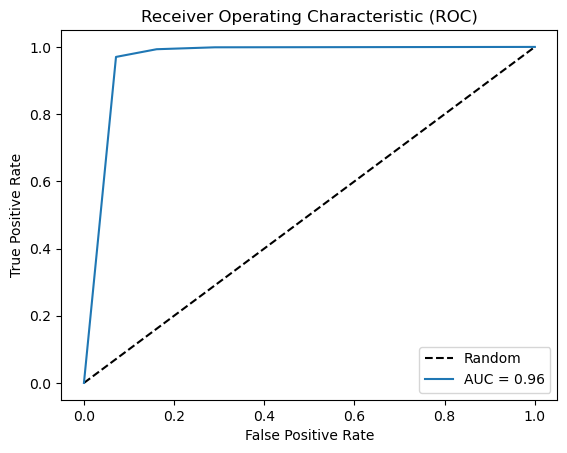

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.93      0.77      0.84       844
         1.0       0.81      0.94      0.87       874

    accuracy                           0.86      1718
   macro avg       0.87      0.86      0.86      1718
weighted avg       0.87      0.86      0.86      1718



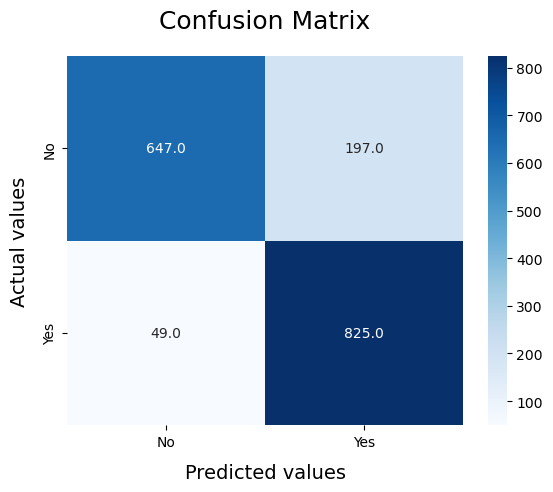

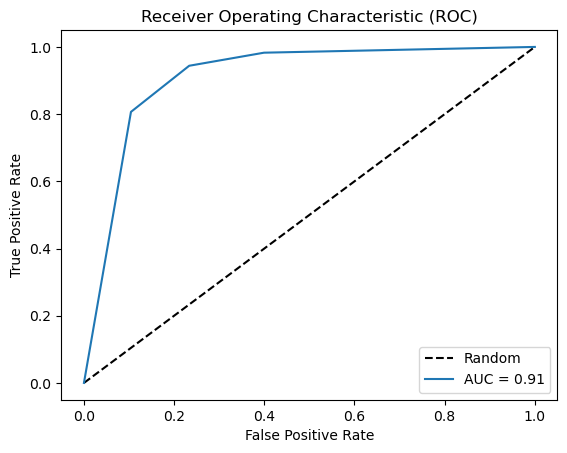

In [121]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    knn = KNeighborsClassifier(n_neighbors=3)
    knn.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_KNN"] = knn
    model_Evaluate(knn)
    y_pred=knn.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"k-nearest neighbors (KNN)",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [122]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
6,k-nearest neighbors (KNN),df_reduced,92.26,93.23,92.13,92.20
5,k-nearest neighbors (KNN),Norm_data,92.03,93.06,91.89,91.96
8,k-nearest neighbors (KNN),pca_DF,91.73,92.81,91.60,91.66
7,k-nearest neighbors (KNN),df_reduced_correlation,91.39,92.51,91.25,91.31
9,k-nearest neighbors (KNN),df_VIF,85.68,86.84,85.53,85.53
2,Logistic Regression,df_reduced_correlation,78.99,79.03,78.95,78.96
3,Logistic Regression,pca_DF,78.93,78.96,78.89,78.90
1,Logistic Regression,df_reduced,78.70,78.74,78.66,78.67
0,Logistic Regression,Norm_data,78.58,78.61,78.54,78.55
4,Logistic Regression,df_VIF,67.23,67.71,67.36,67.10


## Decision Tree Classifier

In [123]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

## Hyperparameter tuning of a decision tree

In [124]:
# Define the parameter grid to search
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2'],
    'random_state': [42]
    
}

In [125]:
# Create a decision tree classifier
decision_tree = DecisionTreeClassifier()

In [126]:
X_resampled, Y_resampled = perform_smote(Norm_data)

Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


In [127]:
accuracy_scorer = make_scorer(accuracy_score)

In [128]:
grid_search = GridSearchCV(decision_tree, param_grid, cv=5,scoring=accuracy_scorer)
#grid_search.fit(X_resampled, Y_resampled)

In [129]:
#grid_search.best_params_

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       844
         1.0       0.93      0.95      0.94       874

    accuracy                           0.93      1718
   macro avg       0.93      0.93      0.93      1718
weighted avg       0.93      0.93      0.93      1718



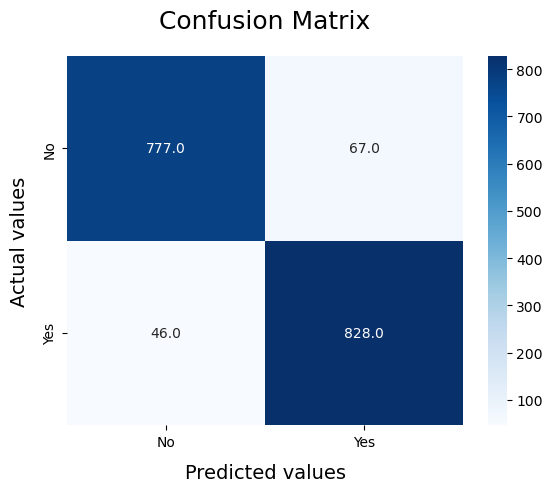

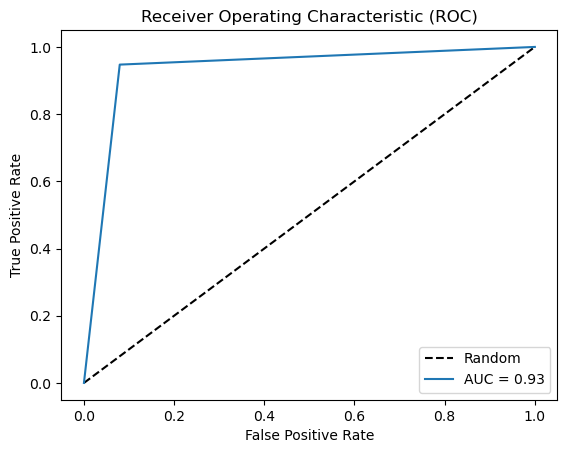

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.95      0.93      0.94       844
         1.0       0.93      0.95      0.94       874

    accuracy                           0.94      1718
   macro avg       0.94      0.94      0.94      1718
weighted avg       0.94      0.94      0.94      1718



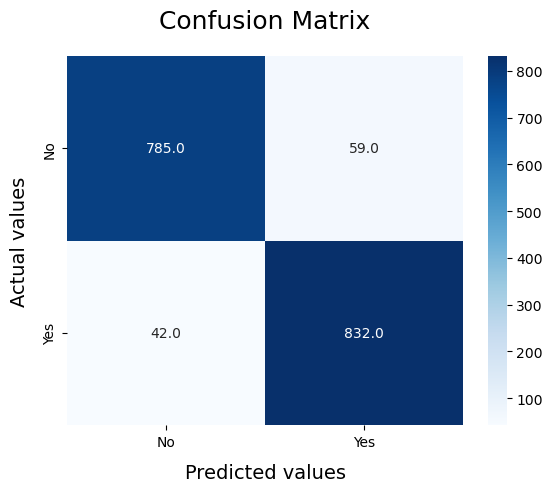

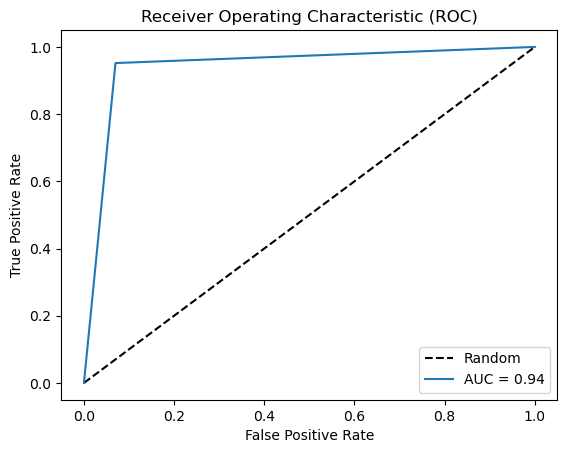

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.95      0.92      0.93       844
         1.0       0.92      0.95      0.94       874

    accuracy                           0.94      1718
   macro avg       0.94      0.94      0.94      1718
weighted avg       0.94      0.94      0.94      1718



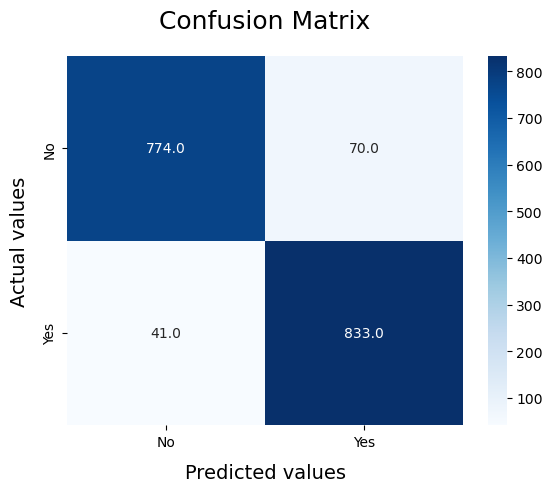

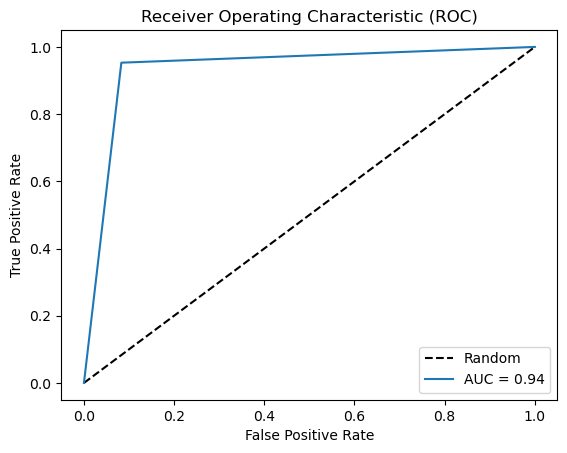

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.94      0.90      0.92       844
         1.0       0.91      0.94      0.93       874

    accuracy                           0.92      1718
   macro avg       0.92      0.92      0.92      1718
weighted avg       0.92      0.92      0.92      1718



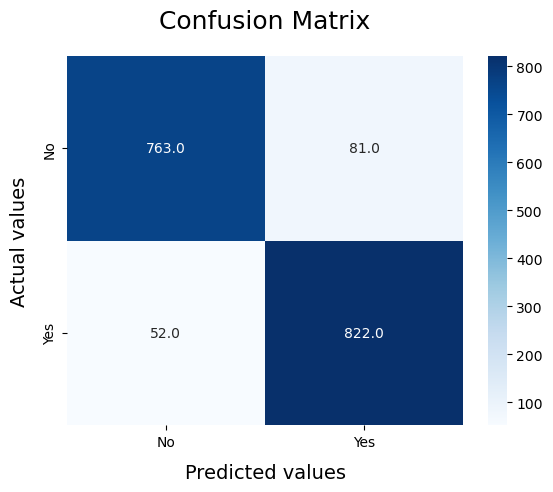

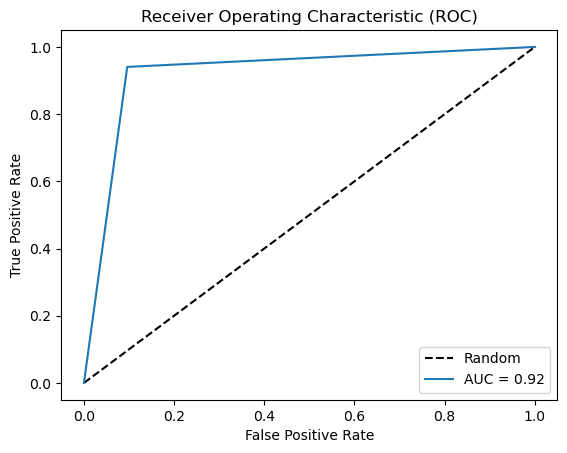

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.86      0.87      0.86       844
         1.0       0.87      0.86      0.86       874

    accuracy                           0.86      1718
   macro avg       0.86      0.86      0.86      1718
weighted avg       0.86      0.86      0.86      1718



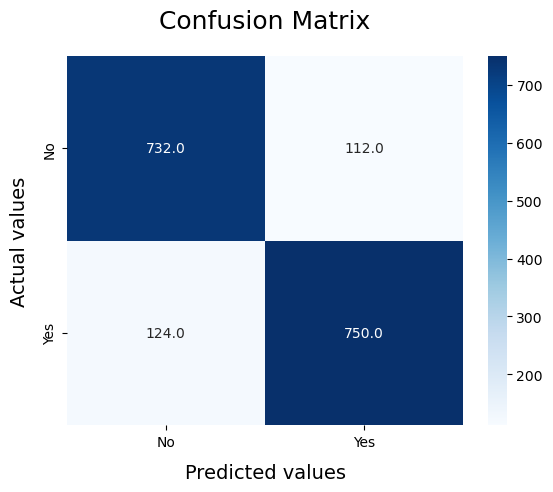

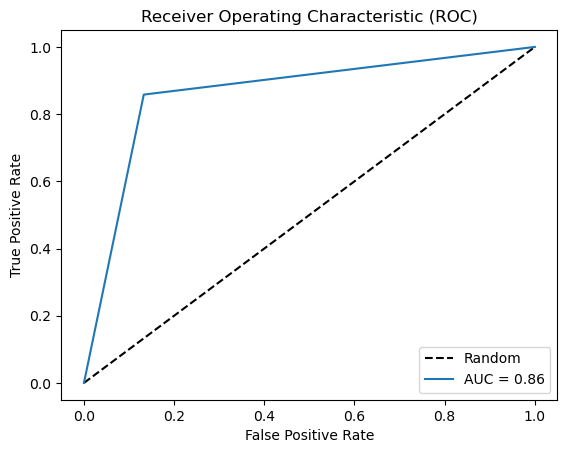

In [130]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    decision_tree=DecisionTreeClassifier(criterion= 'entropy',
 max_depth= None,
 max_features= None,
 min_samples_leaf= 1,
 min_samples_split= 2,
random_state=42)
    decision_tree.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_DT"] = decision_tree
    model_Evaluate(decision_tree)
    y_pred=decision_tree.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Decision Tree Classifier(HPT_done)",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [131]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
11,Decision Tree Classifier(HPT_done),df_reduced,94.12,94.15,94.10,94.12
12,Decision Tree Classifier(HPT_done),df_reduced_correlation,93.54,93.61,93.51,93.53
10,Decision Tree Classifier(HPT_done),Norm_data,93.42,93.46,93.40,93.42
6,k-nearest neighbors (KNN),df_reduced,92.26,93.23,92.13,92.20
13,Decision Tree Classifier(HPT_done),pca_DF,92.26,92.32,92.23,92.25
5,k-nearest neighbors (KNN),Norm_data,92.03,93.06,91.89,91.96
8,k-nearest neighbors (KNN),pca_DF,91.73,92.81,91.60,91.66
7,k-nearest neighbors (KNN),df_reduced_correlation,91.39,92.51,91.25,91.31
14,Decision Tree Classifier(HPT_done),df_VIF,86.26,86.26,86.27,86.26
9,k-nearest neighbors (KNN),df_VIF,85.68,86.84,85.53,85.53


Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.94      0.90      0.92       844
         1.0       0.90      0.94      0.92       874

    accuracy                           0.92      1718
   macro avg       0.92      0.92      0.92      1718
weighted avg       0.92      0.92      0.92      1718



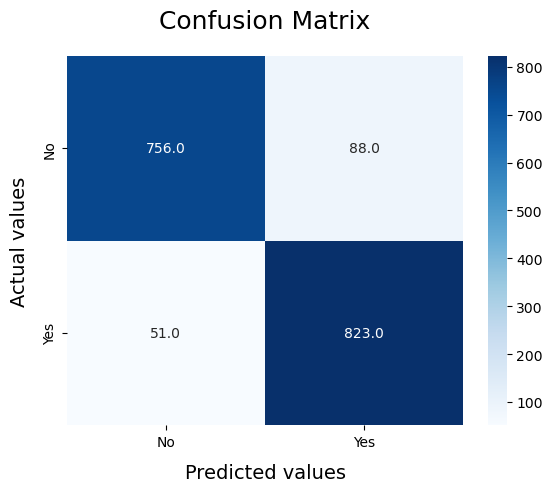

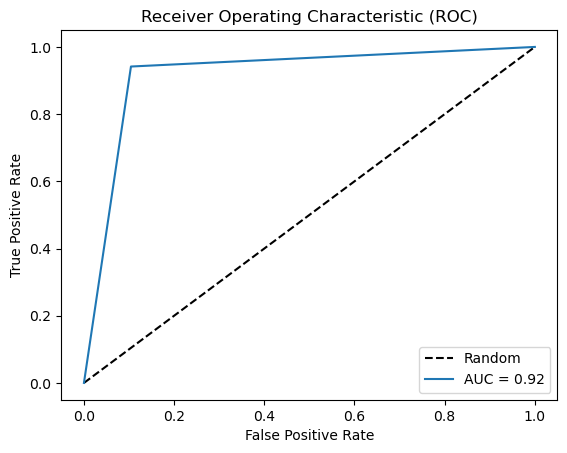

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.95      0.92      0.94       844
         1.0       0.93      0.95      0.94       874

    accuracy                           0.94      1718
   macro avg       0.94      0.94      0.94      1718
weighted avg       0.94      0.94      0.94      1718



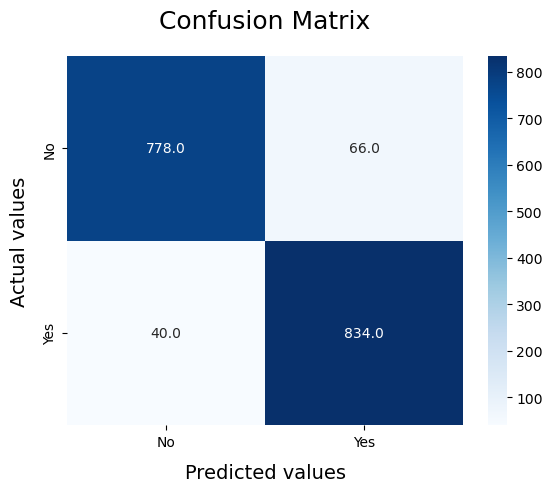

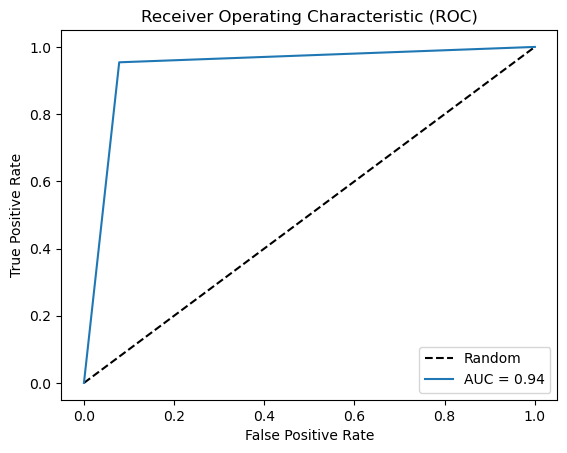

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       844
         1.0       0.92      0.95      0.93       874

    accuracy                           0.93      1718
   macro avg       0.93      0.93      0.93      1718
weighted avg       0.93      0.93      0.93      1718



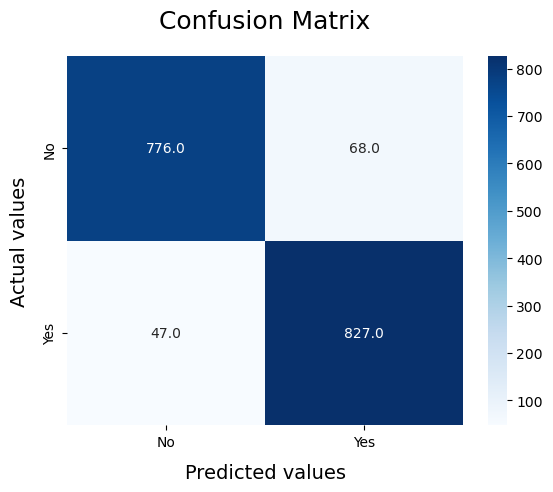

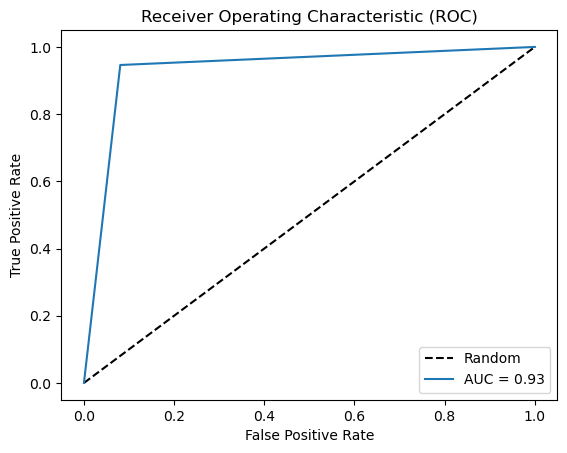

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       844
         1.0       0.91      0.92      0.91       874

    accuracy                           0.91      1718
   macro avg       0.91      0.91      0.91      1718
weighted avg       0.91      0.91      0.91      1718



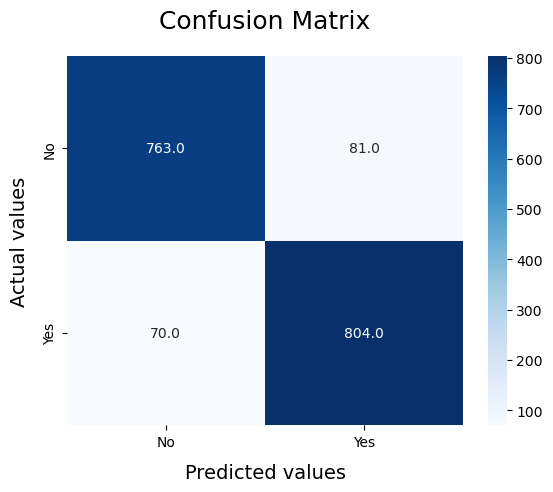

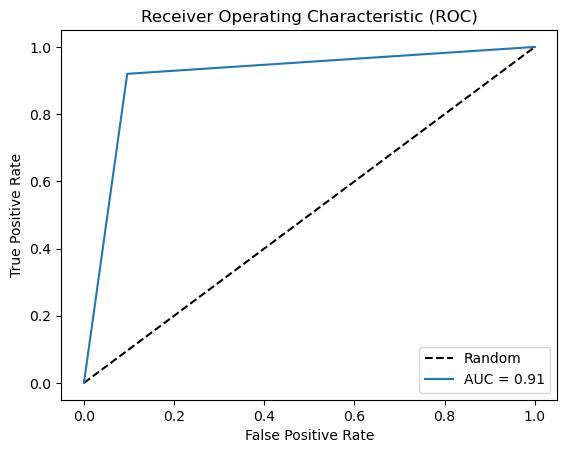

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.86      0.85      0.86       844
         1.0       0.86      0.86      0.86       874

    accuracy                           0.86      1718
   macro avg       0.86      0.86      0.86      1718
weighted avg       0.86      0.86      0.86      1718



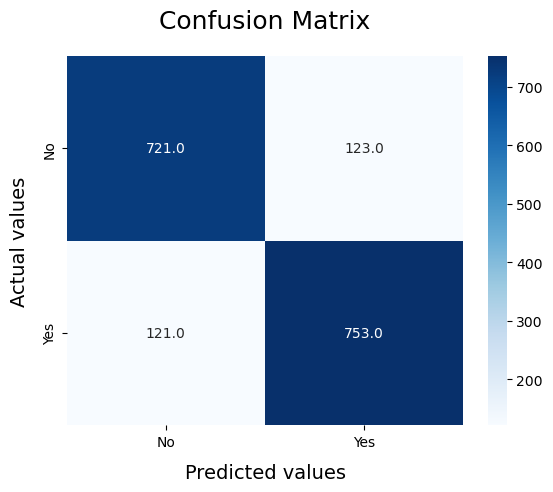

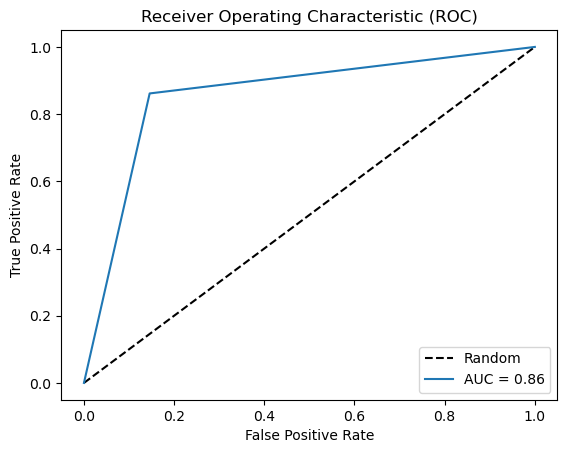

In [132]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    decision_tree=DecisionTreeClassifier()
    decision_tree.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_DTNoHP"] = decision_tree
    model_Evaluate(decision_tree)
    y_pred=decision_tree.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Decision Tree Classifier(HPT not done)",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [133]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
11,Decision Tree Classifier(HPT_done),df_reduced,94.12,94.15,94.10,94.12
16,Decision Tree Classifier(HPT not done),df_reduced,93.83,93.89,93.80,93.82
12,Decision Tree Classifier(HPT_done),df_reduced_correlation,93.54,93.61,93.51,93.53
10,Decision Tree Classifier(HPT_done),Norm_data,93.42,93.46,93.40,93.42
17,Decision Tree Classifier(HPT not done),df_reduced_correlation,93.31,93.35,93.28,93.30
13,Decision Tree Classifier(HPT_done),pca_DF,92.26,92.32,92.23,92.25
6,k-nearest neighbors (KNN),df_reduced,92.26,93.23,92.13,92.20
5,k-nearest neighbors (KNN),Norm_data,92.03,93.06,91.89,91.96
15,Decision Tree Classifier(HPT not done),Norm_data,91.91,92.01,91.87,91.90
8,k-nearest neighbors (KNN),pca_DF,91.73,92.81,91.60,91.66


## Random Forest Classifier

In [134]:
from sklearn.ensemble import RandomForestClassifier

In [135]:
# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [42]
}

In [136]:
# Create a Random Forest classifier
random_forest = RandomForestClassifier()

In [137]:
# Perform grid search
grid_search = GridSearchCV(random_forest, param_grid, cv=5,scoring=make_scorer(accuracy_score))
#grid_search.fit(X_resampled, Y_resampled)

In [138]:
#grid_search.best_params_

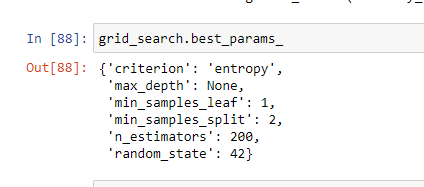

In [139]:
#grid_search.best_score_

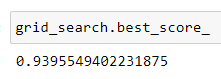

In [140]:
random_forest = RandomForestClassifier(
    criterion= 'entropy',
    max_depth= None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    random_state=42
)

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96       844
         1.0       0.98      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



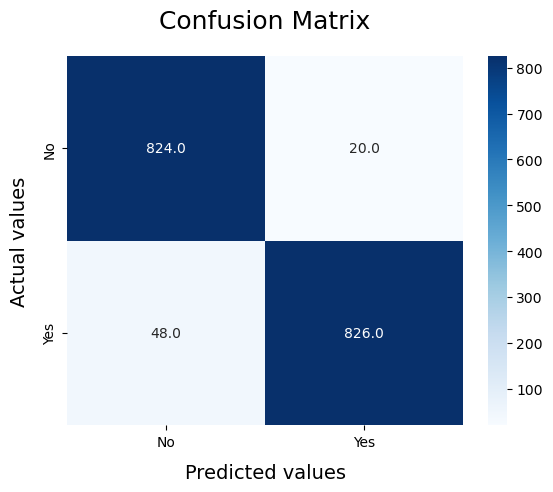

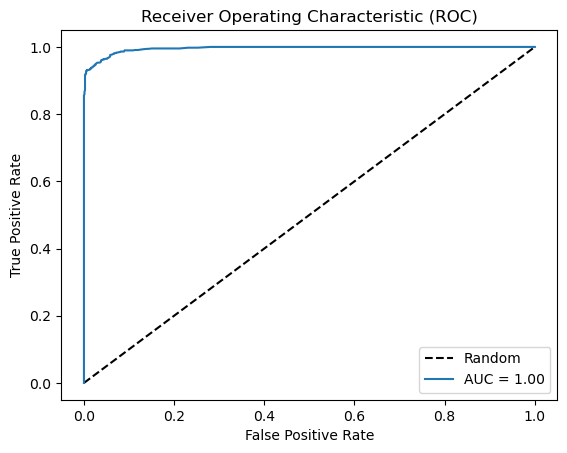

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.95      0.98      0.96       844
         1.0       0.98      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



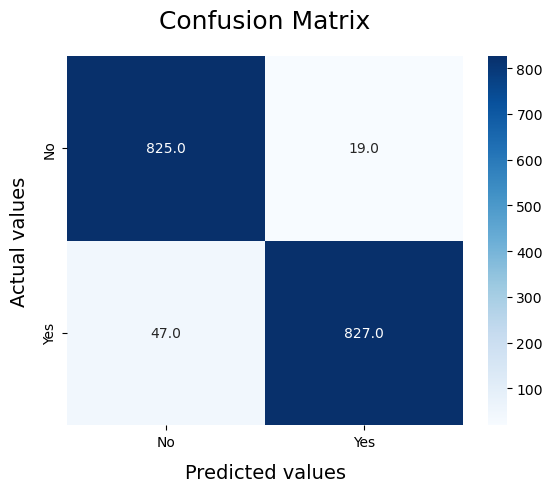

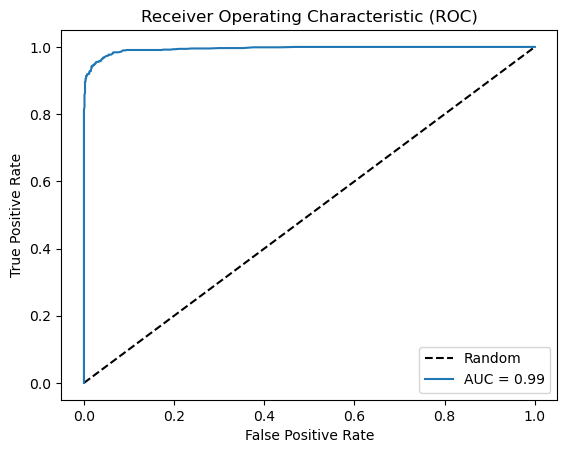

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.96      0.97      0.96       844
         1.0       0.97      0.96      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



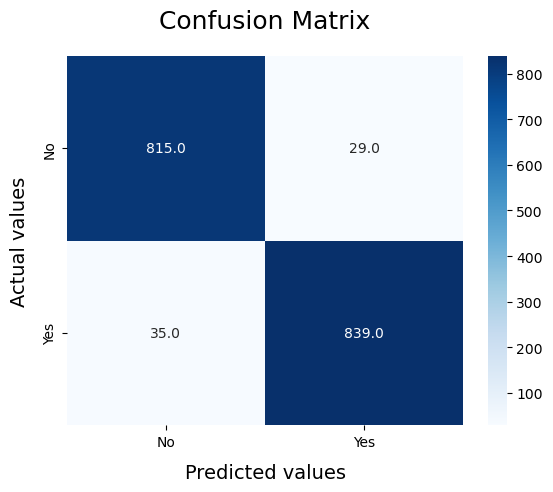

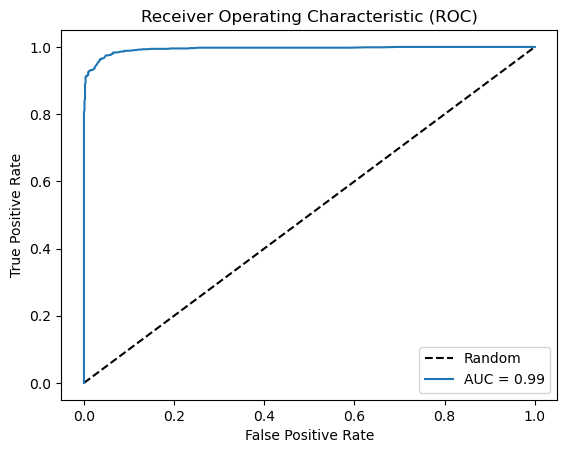

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.95      0.96      0.96       844
         1.0       0.96      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



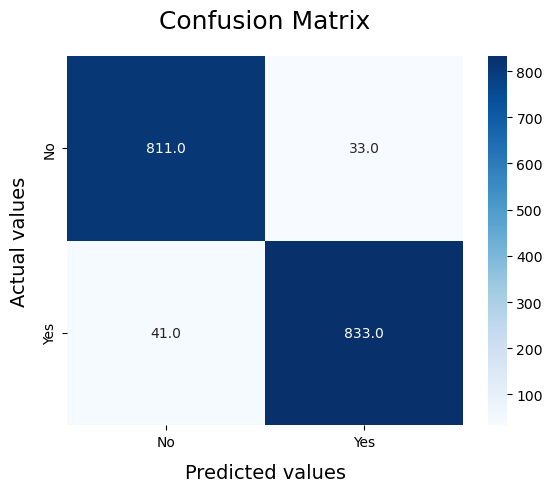

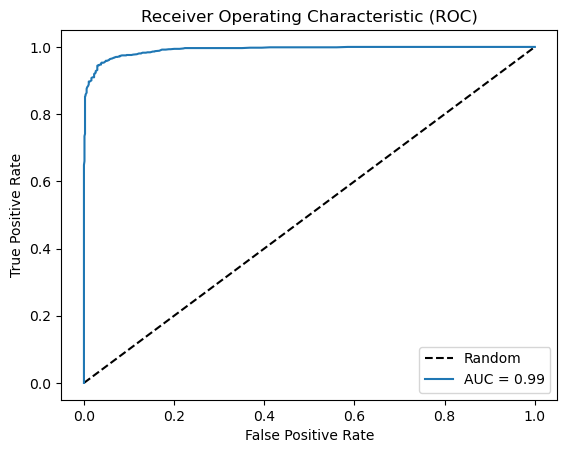

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.90      0.93      0.92       844
         1.0       0.93      0.90      0.92       874

    accuracy                           0.92      1718
   macro avg       0.92      0.92      0.92      1718
weighted avg       0.92      0.92      0.92      1718



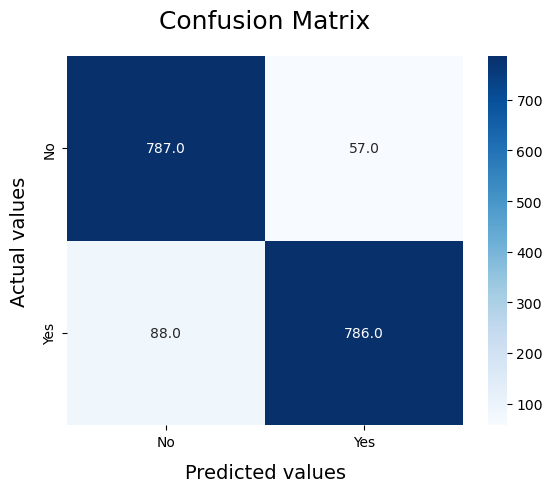

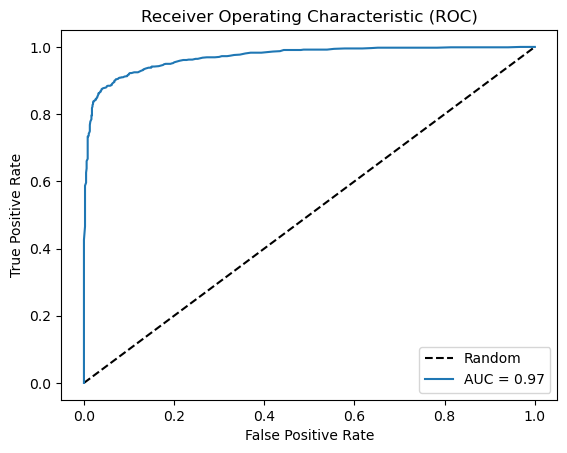

In [141]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    random_forest = RandomForestClassifier(
    criterion= 'entropy',
    max_depth= None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=200,
    random_state=42
)
    random_forest.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_RF"] = random_forest
    model_Evaluate(random_forest)
    y_pred=random_forest.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Random Forest Classifier(HPT done)",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96       844
         1.0       0.97      0.94      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



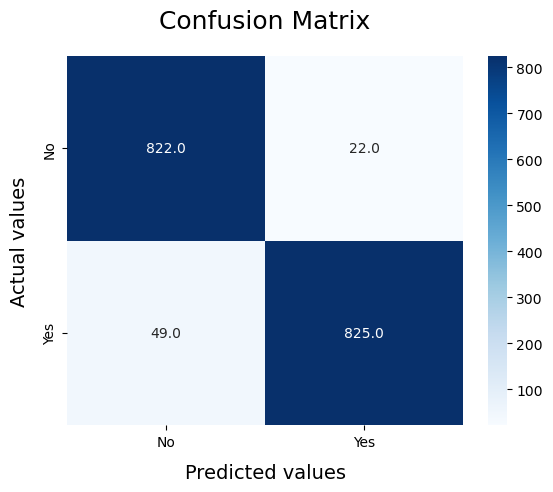

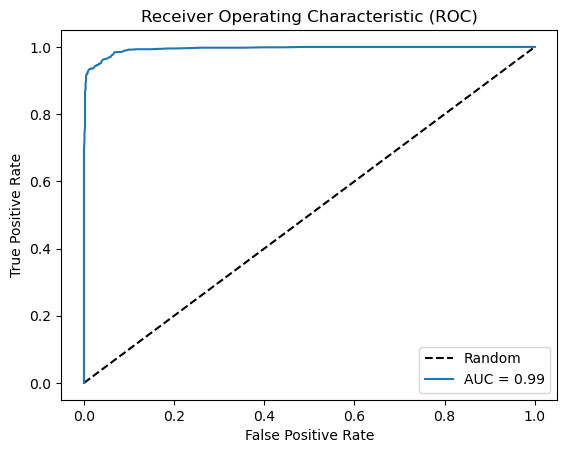

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96       844
         1.0       0.98      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



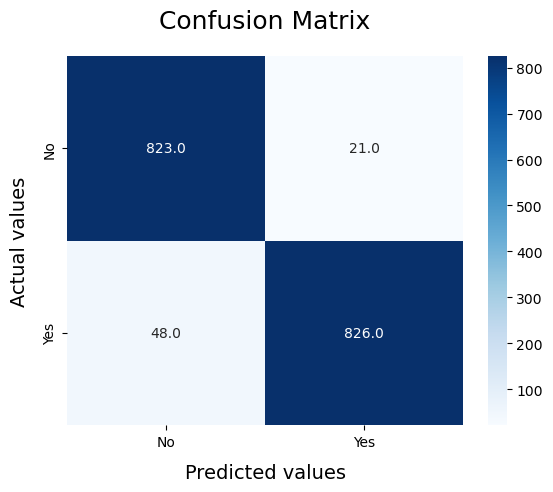

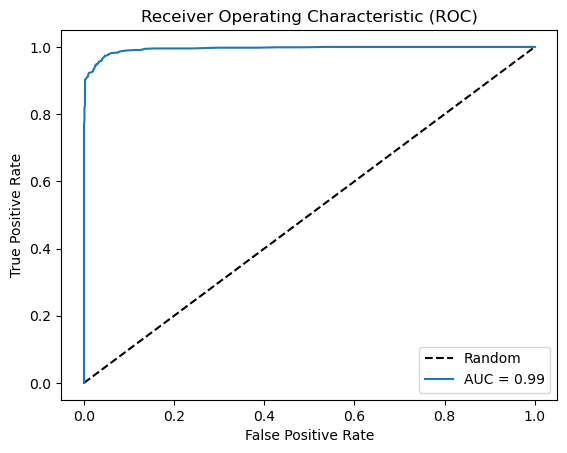

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96       844
         1.0       0.97      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



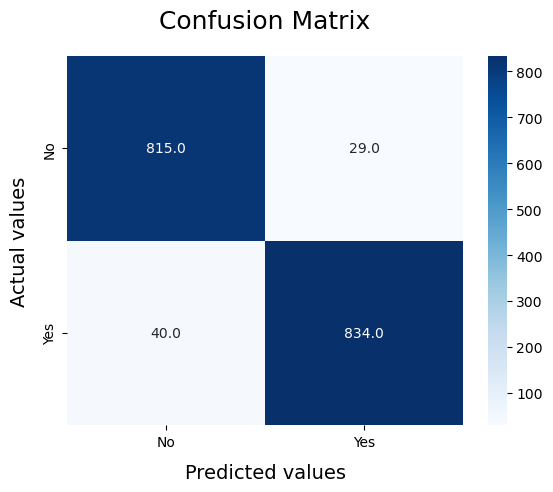

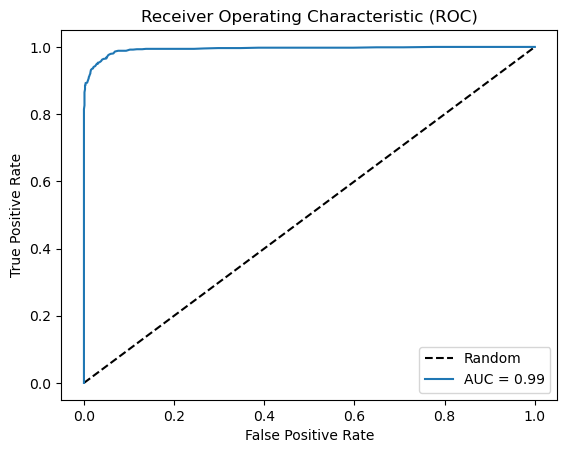

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       844
         1.0       0.96      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



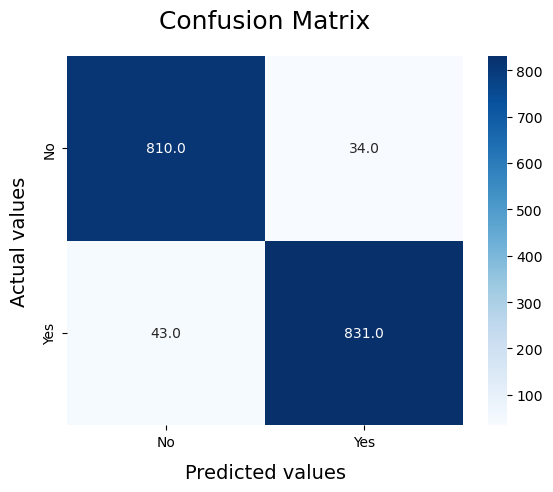

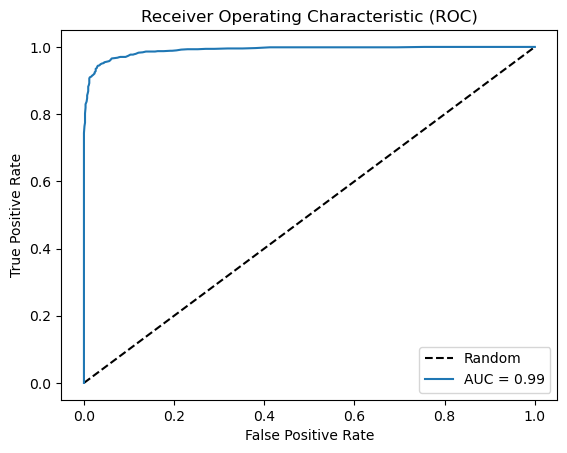

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92       844
         1.0       0.94      0.89      0.91       874

    accuracy                           0.92      1718
   macro avg       0.92      0.92      0.92      1718
weighted avg       0.92      0.92      0.91      1718



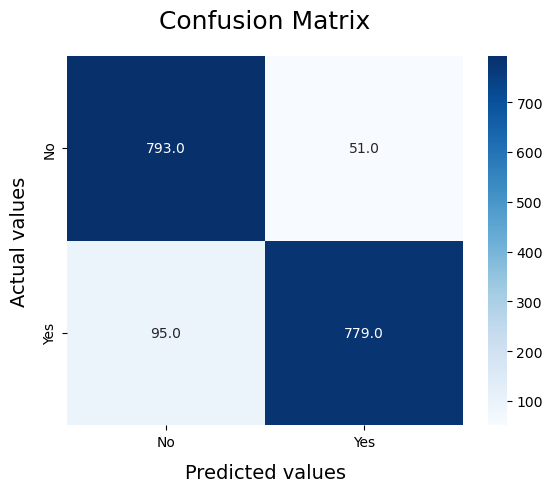

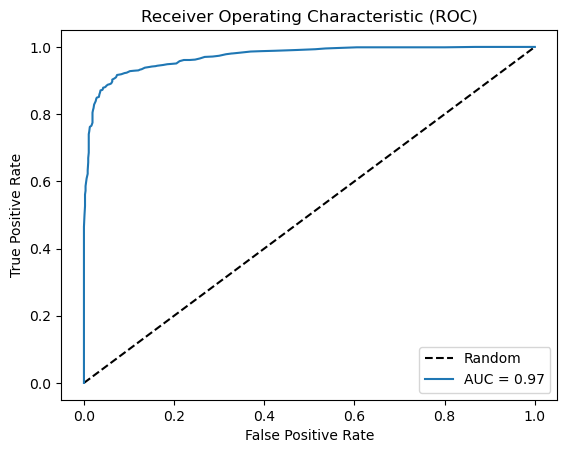

In [142]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    random_forest = RandomForestClassifier()
    random_forest.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_RFNoHP"] = random_forest
    model_Evaluate(random_forest)
    y_pred=random_forest.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Random Forest Classifier((HPT not done))",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [143]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
22,Random Forest Classifier(HPT done),df_reduced_correlation,96.27,96.27,96.28,96.27
21,Random Forest Classifier(HPT done),df_reduced,96.16,96.18,96.19,96.16
20,Random Forest Classifier(HPT done),Norm_data,96.04,96.07,96.07,96.04
27,Random Forest Classifier((HPT not done)),df_reduced_correlation,95.98,95.98,95.99,95.98
26,Random Forest Classifier((HPT not done)),df_reduced,95.98,96.00,96.01,95.98
25,Random Forest Classifier((HPT not done)),Norm_data,95.87,95.89,95.89,95.87
23,Random Forest Classifier(HPT done),pca_DF,95.69,95.69,95.70,95.69
28,Random Forest Classifier((HPT not done)),pca_DF,95.52,95.51,95.53,95.52
11,Decision Tree Classifier(HPT_done),df_reduced,94.12,94.15,94.10,94.12
16,Decision Tree Classifier(HPT not done),df_reduced,93.83,93.89,93.80,93.82


## Gradient Boosting Machines (GBM)

In [144]:
from sklearn.ensemble import GradientBoostingClassifier

In [145]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 1.0],
    'max_depth': [3, 5, 7]
}

In [146]:
gbm = GradientBoostingClassifier()

In [147]:
grid_search = GridSearchCV(estimator=gbm, param_grid=param_grid, cv=5,scoring=make_scorer(accuracy_score))
#grid_search.fit(X_resampled, Y_resampled)

In [148]:
#best_params = grid_search.best_params_

In [149]:
#best_params

In [150]:
#grid_search.best_estimator_

In [151]:
gbm=GradientBoostingClassifier(max_depth=7, n_estimators=300)

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       844
         1.0       0.99      0.97      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



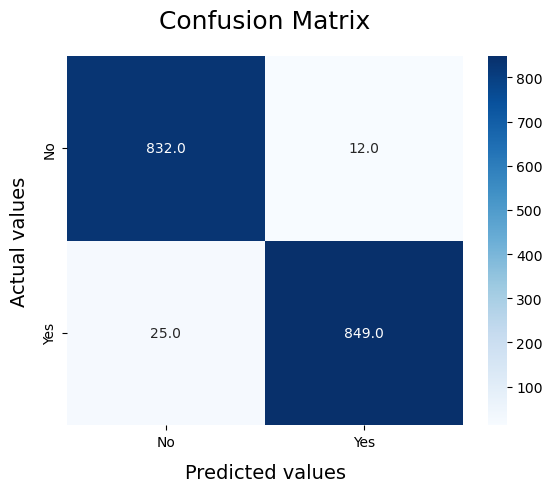

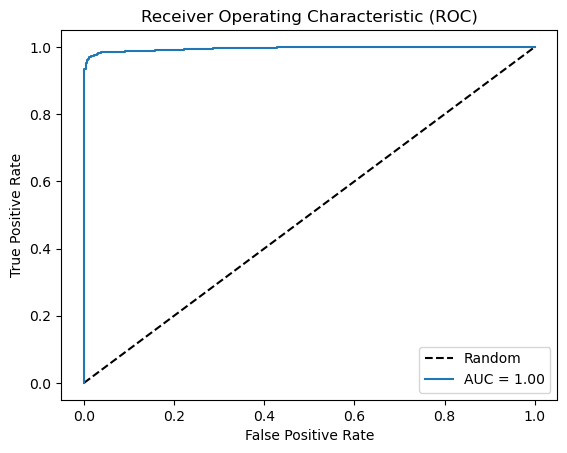

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       844
         1.0       0.99      0.97      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



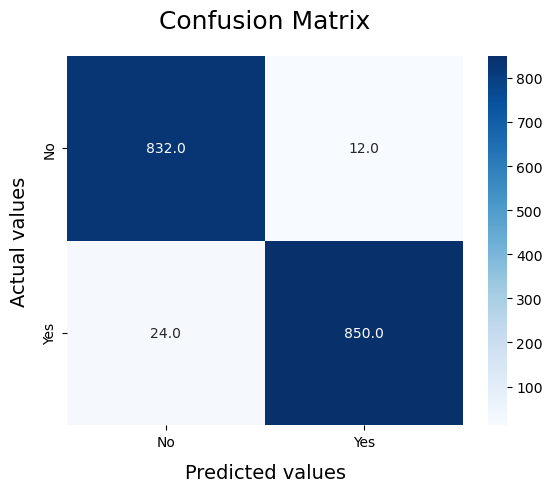

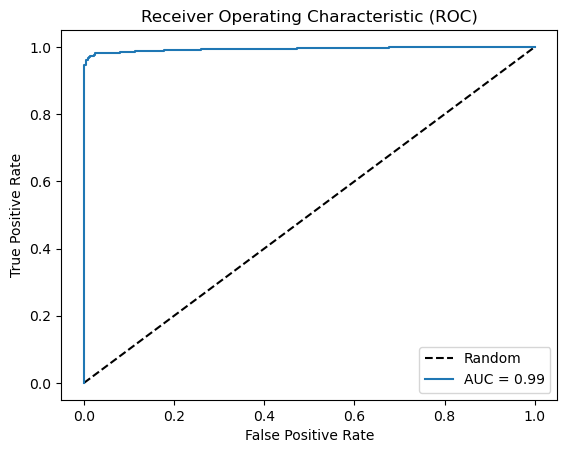

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       844
         1.0       0.98      0.98      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



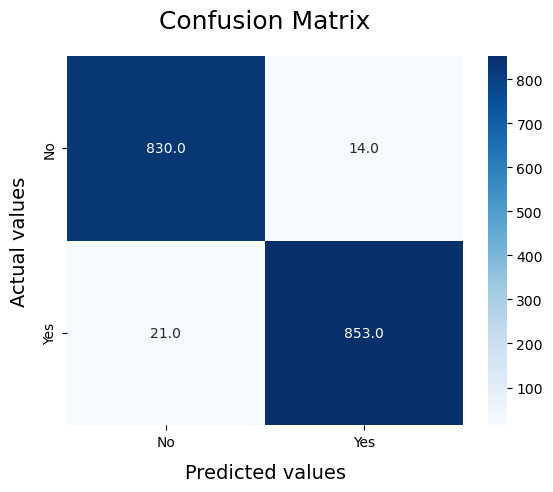

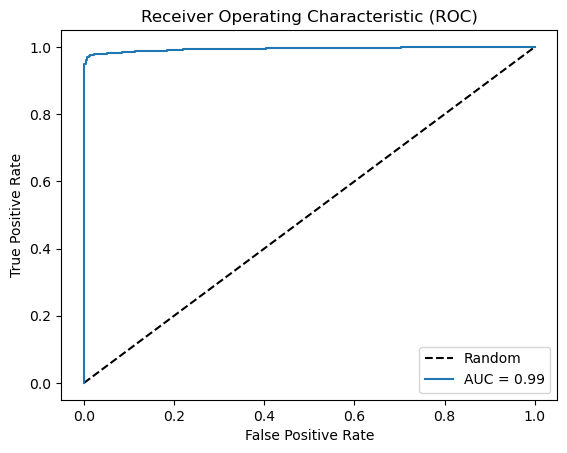

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96       844
         1.0       0.97      0.95      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



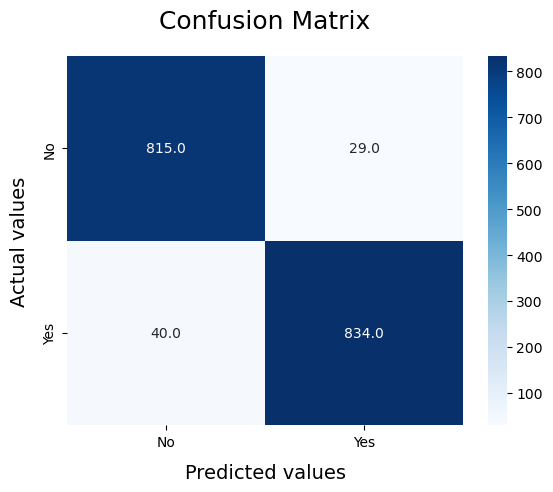

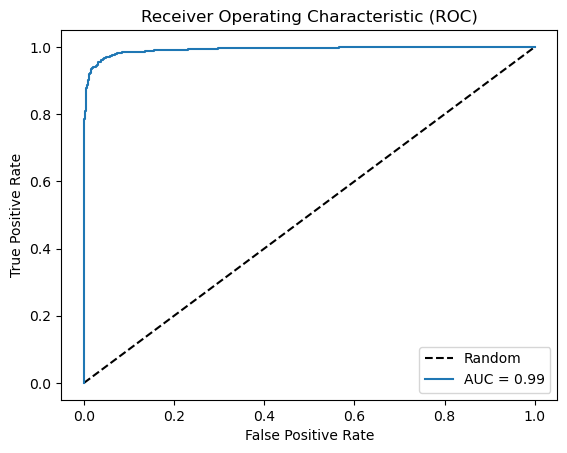

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.89      0.94      0.92       844
         1.0       0.94      0.89      0.92       874

    accuracy                           0.92      1718
   macro avg       0.92      0.92      0.92      1718
weighted avg       0.92      0.92      0.92      1718



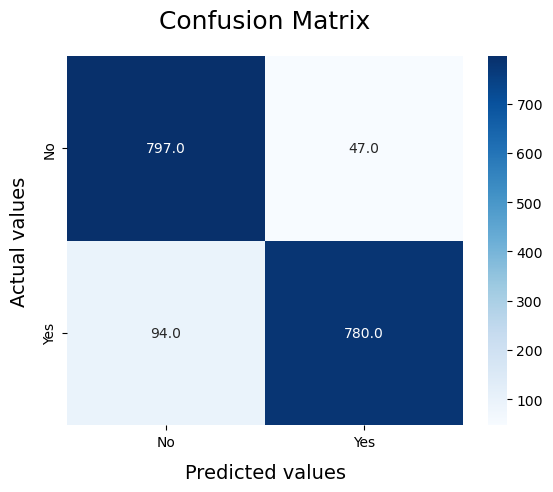

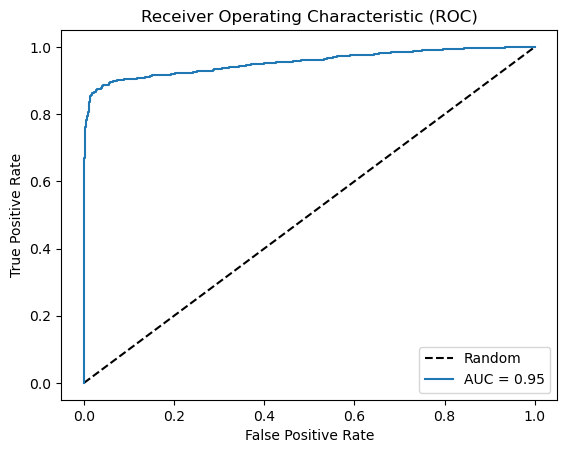

In [152]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    gbm=GradientBoostingClassifier(max_depth=7, n_estimators=300,random_state=42)
    gbm.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_gbm"] = gbm
    model_Evaluate(gbm)
    y_pred=gbm.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Gradient Boosting Classifier",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [153]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
32,Gradient Boosting Classifier,df_reduced_correlation,97.96,97.96,97.97,97.96
31,Gradient Boosting Classifier,df_reduced,97.90,97.90,97.92,97.90
30,Gradient Boosting Classifier,Norm_data,97.85,97.84,97.86,97.85
22,Random Forest Classifier(HPT done),df_reduced_correlation,96.27,96.27,96.28,96.27
21,Random Forest Classifier(HPT done),df_reduced,96.16,96.18,96.19,96.16
20,Random Forest Classifier(HPT done),Norm_data,96.04,96.07,96.07,96.04
33,Gradient Boosting Classifier,pca_DF,95.98,95.98,95.99,95.98
27,Random Forest Classifier((HPT not done)),df_reduced_correlation,95.98,95.98,95.99,95.98
26,Random Forest Classifier((HPT not done)),df_reduced,95.98,96.00,96.01,95.98
25,Random Forest Classifier((HPT not done)),Norm_data,95.87,95.89,95.89,95.87


## Support Vector Machines (SVM)

In [154]:
from sklearn.svm import SVC

In [155]:
svc_classifier = SVC()

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88       844
         1.0       0.88      0.88      0.88       874

    accuracy                           0.88      1718
   macro avg       0.88      0.88      0.88      1718
weighted avg       0.88      0.88      0.88      1718



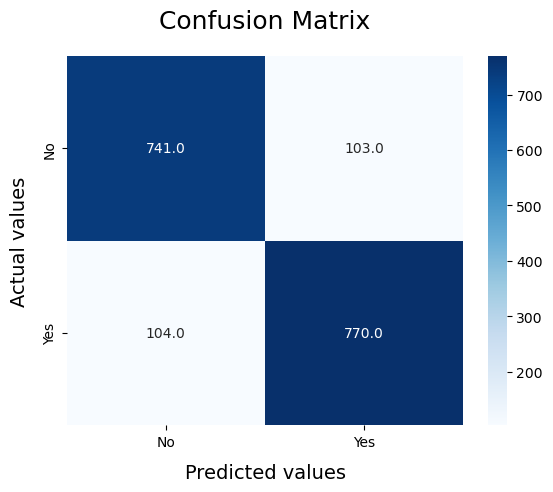

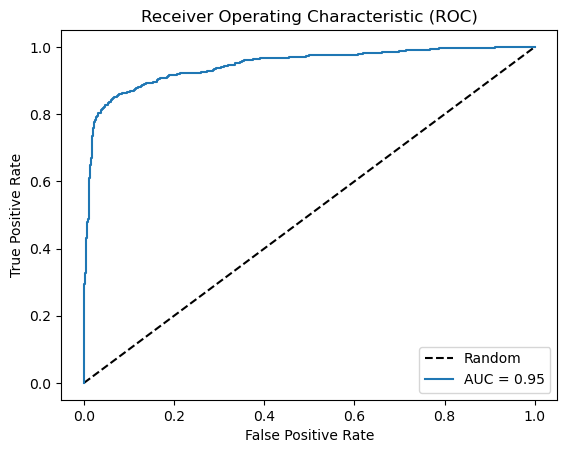

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88       844
         1.0       0.89      0.88      0.89       874

    accuracy                           0.88      1718
   macro avg       0.88      0.88      0.88      1718
weighted avg       0.88      0.88      0.88      1718



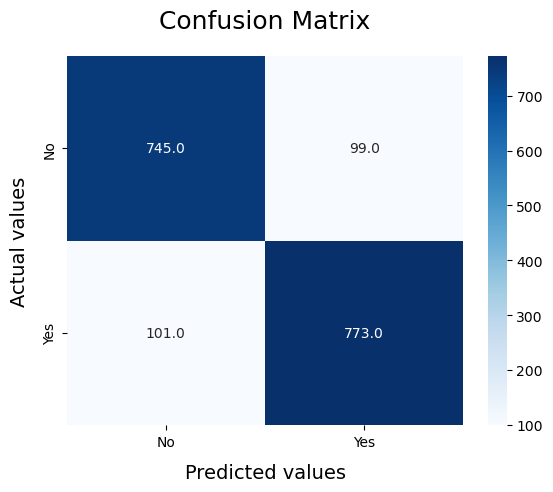

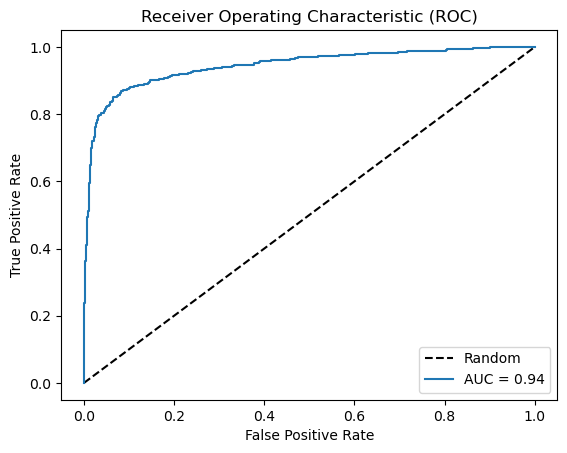

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.89      0.86      0.87       844
         1.0       0.87      0.89      0.88       874

    accuracy                           0.88      1718
   macro avg       0.88      0.88      0.88      1718
weighted avg       0.88      0.88      0.88      1718



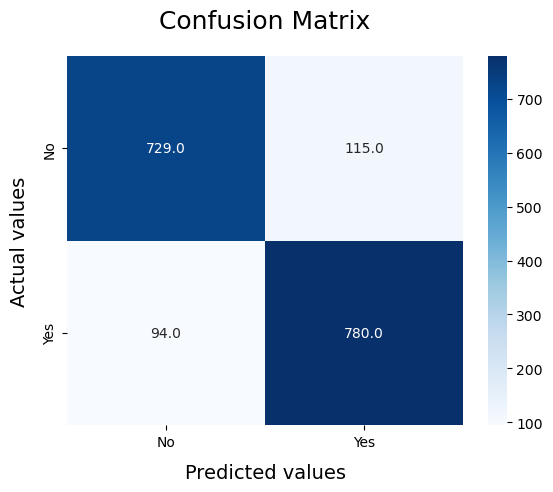

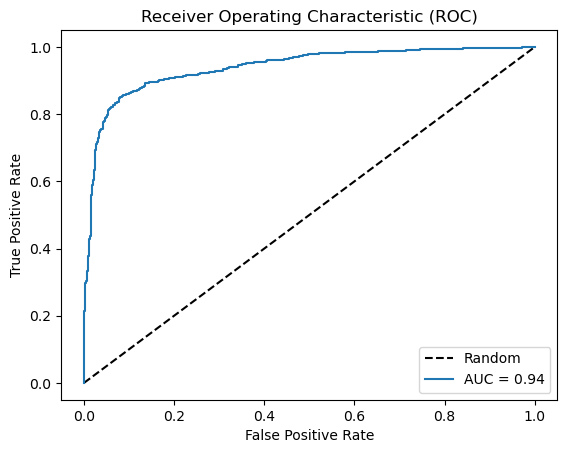

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.89      0.90      0.89       844
         1.0       0.90      0.89      0.90       874

    accuracy                           0.89      1718
   macro avg       0.89      0.89      0.89      1718
weighted avg       0.89      0.89      0.89      1718



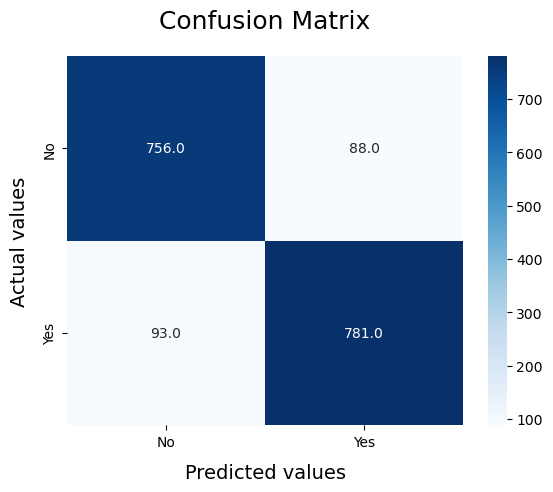

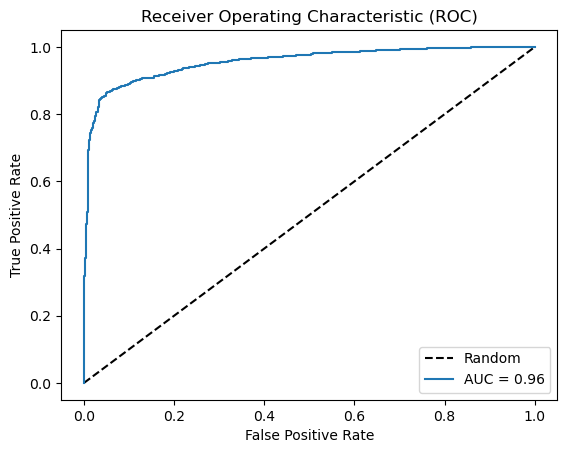

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.66      0.85      0.74       844
         1.0       0.80      0.58      0.67       874

    accuracy                           0.71      1718
   macro avg       0.73      0.71      0.71      1718
weighted avg       0.73      0.71      0.70      1718



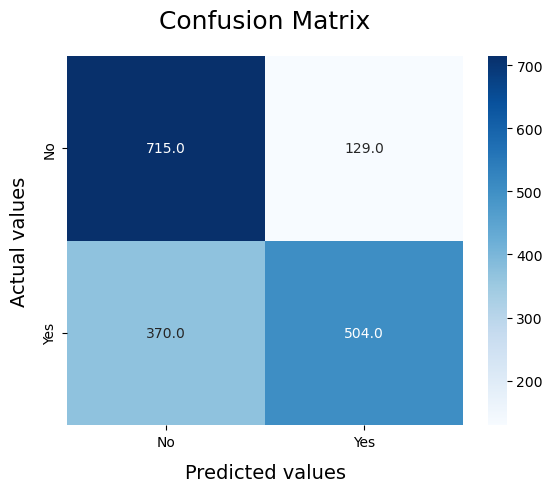

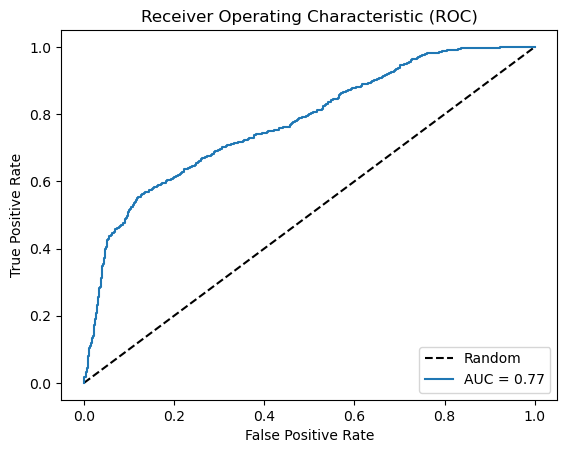

In [156]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    svc_classifier = SVC()
    svc_classifier.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_svc"] = svc_classifier
    model_Evaluate(svc_classifier)
    y_pred=svc_classifier.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"Support Vector Machine Classifier",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [157]:
Evaluation_df.sort_values('Accuracy',ascending=False).reset_index(drop=True)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
0,Gradient Boosting Classifier,df_reduced_correlation,97.96,97.96,97.97,97.96
1,Gradient Boosting Classifier,df_reduced,97.90,97.90,97.92,97.90
2,Gradient Boosting Classifier,Norm_data,97.85,97.84,97.86,97.85
3,Random Forest Classifier(HPT done),df_reduced_correlation,96.27,96.27,96.28,96.27
4,Random Forest Classifier(HPT done),df_reduced,96.16,96.18,96.19,96.16
5,Random Forest Classifier(HPT done),Norm_data,96.04,96.07,96.07,96.04
6,Gradient Boosting Classifier,pca_DF,95.98,95.98,95.99,95.98
7,Random Forest Classifier((HPT not done)),df_reduced_correlation,95.98,95.98,95.99,95.98
8,Random Forest Classifier((HPT not done)),df_reduced,95.98,96.00,96.01,95.98
9,Random Forest Classifier((HPT not done)),Norm_data,95.87,95.89,95.89,95.87


## Model Building using XGBoost

In [158]:
import xgboost as xgb

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98       844
         1.0       0.98      0.97      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



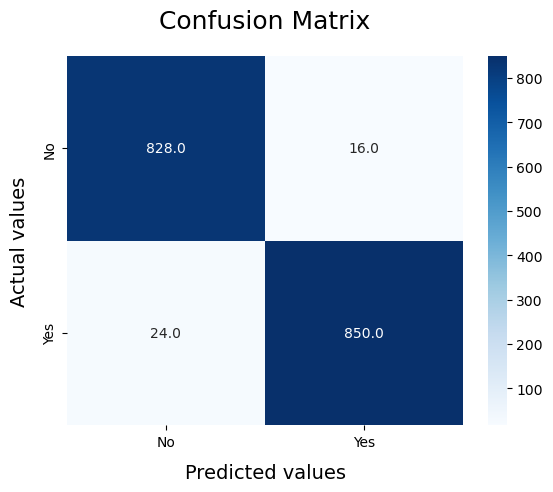

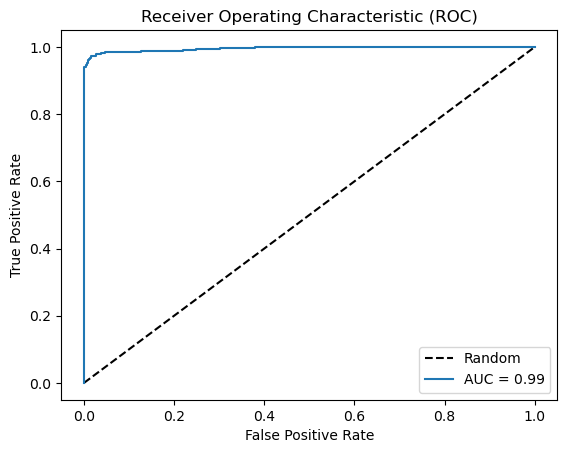

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98       844
         1.0       0.99      0.98      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



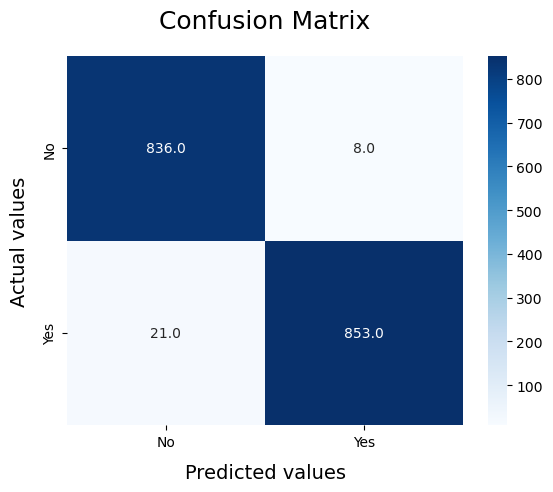

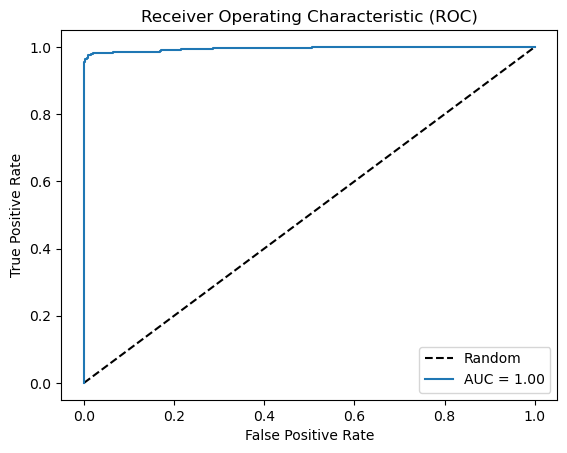

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98       844
         1.0       0.98      0.97      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



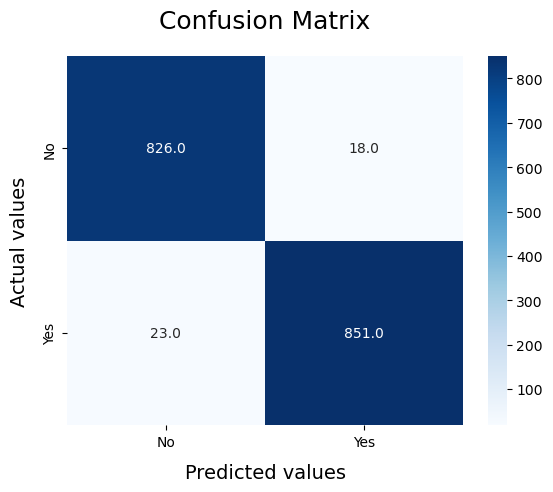

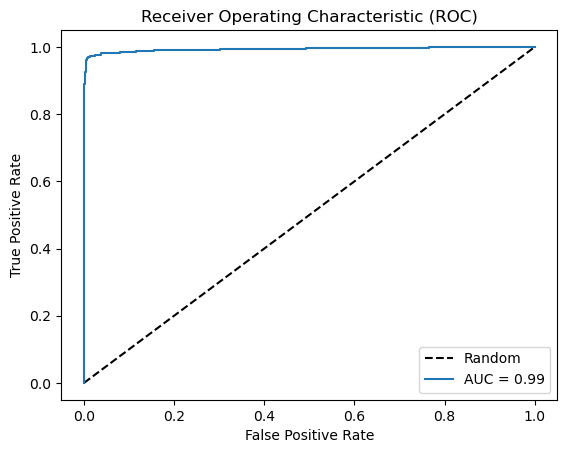

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       844
         1.0       0.96      0.96      0.96       874

    accuracy                           0.96      1718
   macro avg       0.96      0.96      0.96      1718
weighted avg       0.96      0.96      0.96      1718



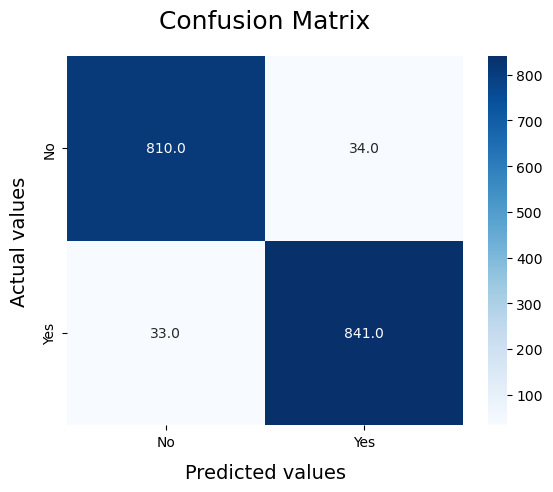

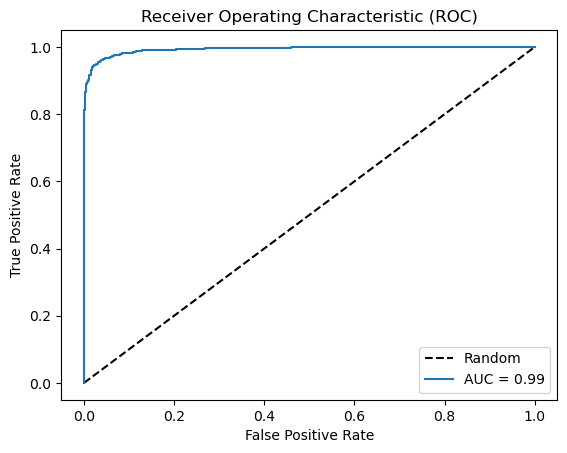

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.89      0.96      0.92       844
         1.0       0.96      0.88      0.92       874

    accuracy                           0.92      1718
   macro avg       0.92      0.92      0.92      1718
weighted avg       0.92      0.92      0.92      1718



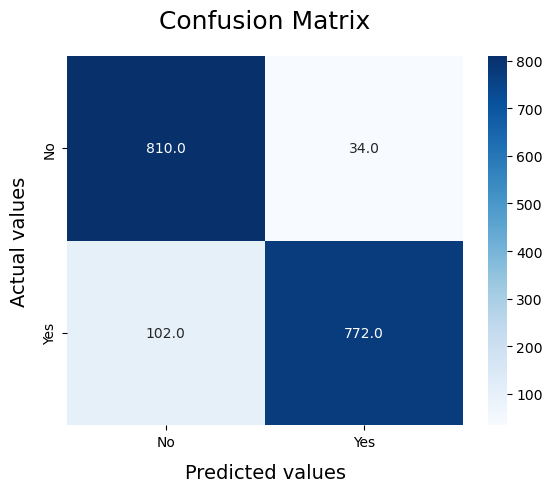

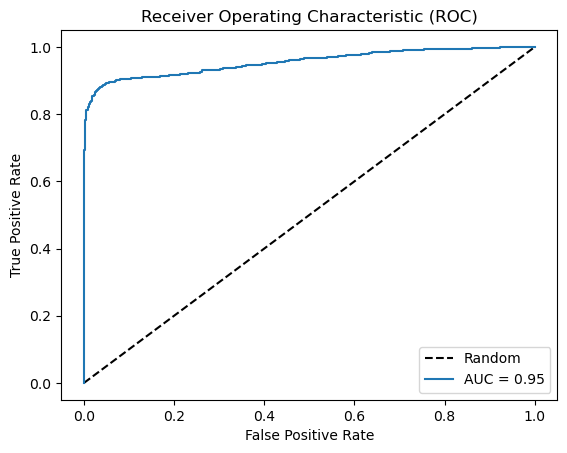

In [159]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    xgb_clf = xgb.XGBClassifier(random_state=42)
    xgb_clf.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_xgb"] = xgb_clf
    model_Evaluate(xgb_clf)
    y_pred=xgb_clf.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"XGBoost",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [160]:
Evaluation_df.sort_values('Accuracy',ascending=False)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
41,XGBoost,df_reduced,98.31,98.31,98.32,98.31
32,Gradient Boosting Classifier,df_reduced_correlation,97.96,97.96,97.97,97.96
31,Gradient Boosting Classifier,df_reduced,97.90,97.90,97.92,97.90
30,Gradient Boosting Classifier,Norm_data,97.85,97.84,97.86,97.85
40,XGBoost,Norm_data,97.67,97.67,97.68,97.67
42,XGBoost,df_reduced_correlation,97.61,97.61,97.62,97.61
22,Random Forest Classifier(HPT done),df_reduced_correlation,96.27,96.27,96.28,96.27
21,Random Forest Classifier(HPT done),df_reduced,96.16,96.18,96.19,96.16
43,XGBoost,pca_DF,96.10,96.10,96.10,96.10
20,Random Forest Classifier(HPT done),Norm_data,96.04,96.07,96.07,96.04


In [161]:
from sklearn.naive_bayes import GaussianNB,BernoulliNB

In [162]:
GNB=GaussianNB()
BNB=BernoulliNB()

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.80      0.79      0.79       844
         1.0       0.80      0.81      0.80       874

    accuracy                           0.80      1718
   macro avg       0.80      0.80      0.80      1718
weighted avg       0.80      0.80      0.80      1718



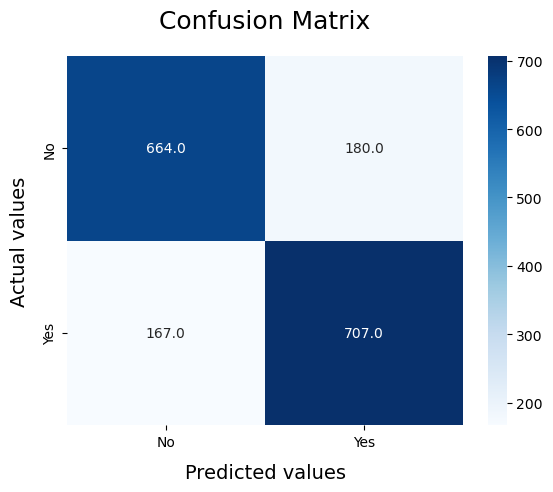

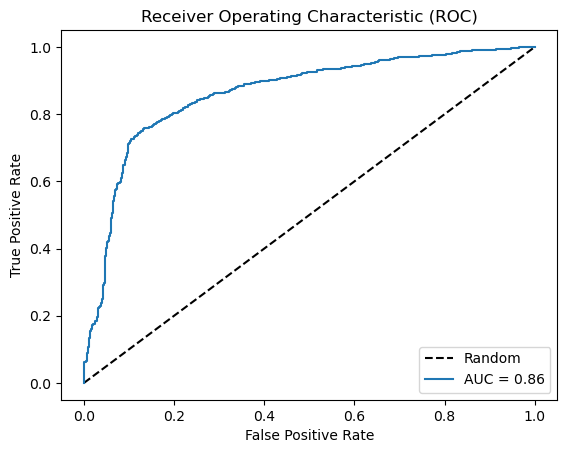

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.81      0.80      0.80       844
         1.0       0.81      0.81      0.81       874

    accuracy                           0.81      1718
   macro avg       0.81      0.81      0.81      1718
weighted avg       0.81      0.81      0.81      1718



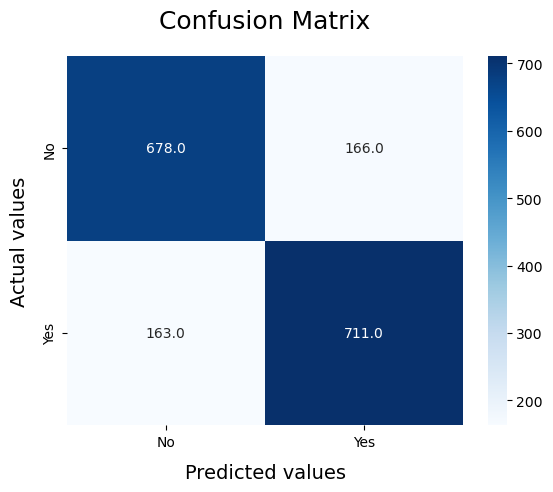

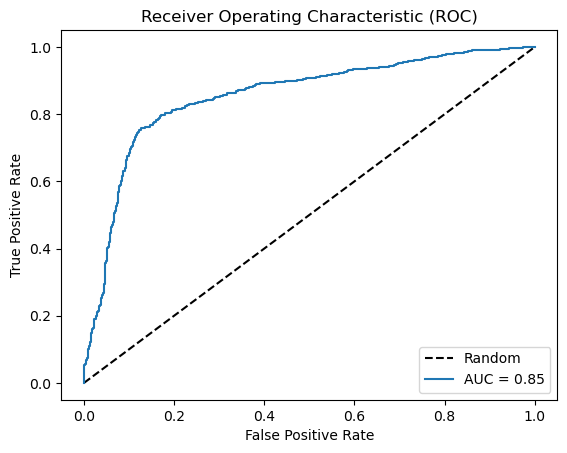

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.81      0.81      0.81       844
         1.0       0.82      0.82      0.82       874

    accuracy                           0.82      1718
   macro avg       0.82      0.82      0.82      1718
weighted avg       0.82      0.82      0.82      1718



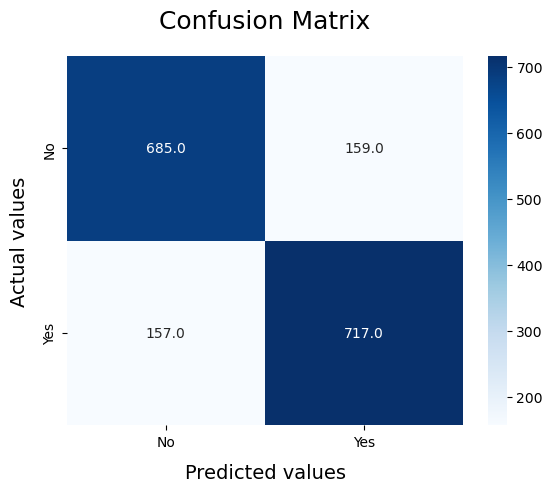

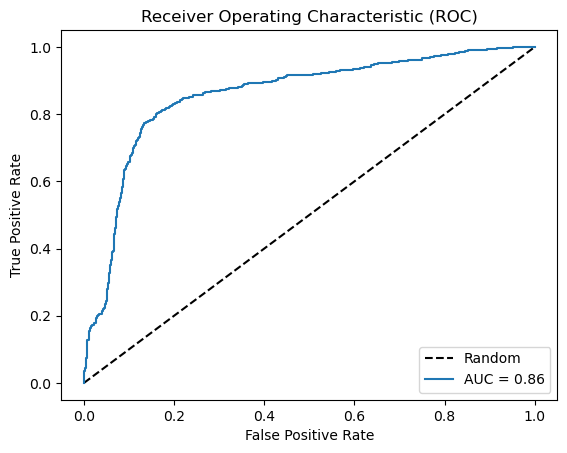

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.80      0.85      0.82       844
         1.0       0.84      0.79      0.82       874

    accuracy                           0.82      1718
   macro avg       0.82      0.82      0.82      1718
weighted avg       0.82      0.82      0.82      1718



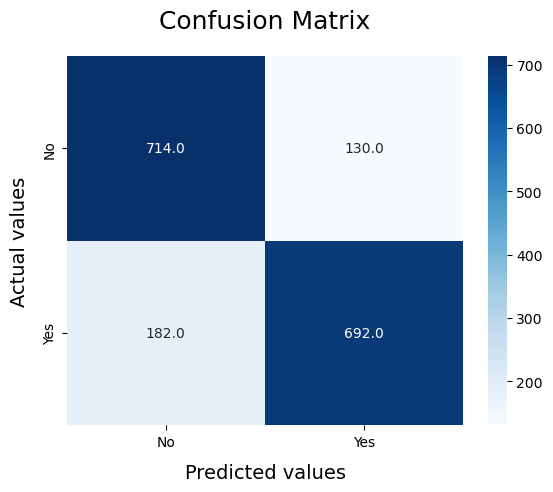

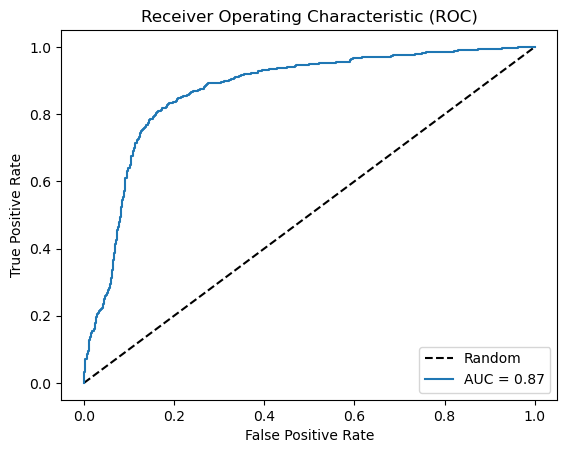

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.65      0.86      0.74       844
         1.0       0.80      0.55      0.65       874

    accuracy                           0.70      1718
   macro avg       0.72      0.70      0.69      1718
weighted avg       0.72      0.70      0.69      1718



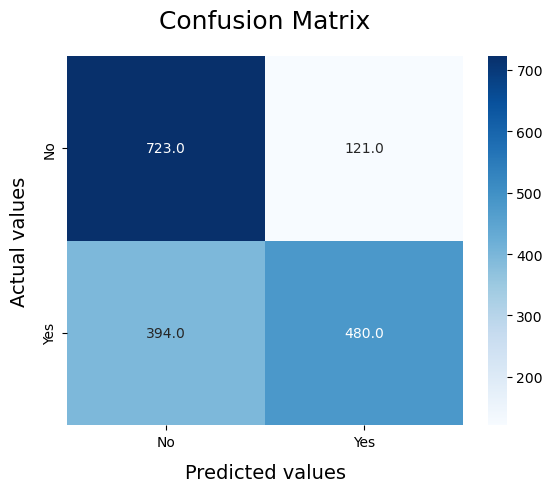

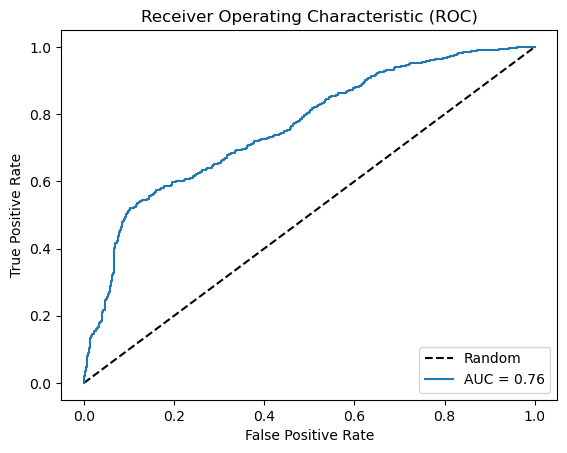

In [163]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    GNB=GaussianNB()
    GNB.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_GNB"] = GNB
    model_Evaluate(GNB)
    y_pred=GNB.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"GaussianNB",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

Performing Training on Norm_data

              precision    recall  f1-score   support

         0.0       0.73      0.45      0.55       844
         1.0       0.61      0.84      0.71       874

    accuracy                           0.65      1718
   macro avg       0.67      0.64      0.63      1718
weighted avg       0.67      0.65      0.63      1718



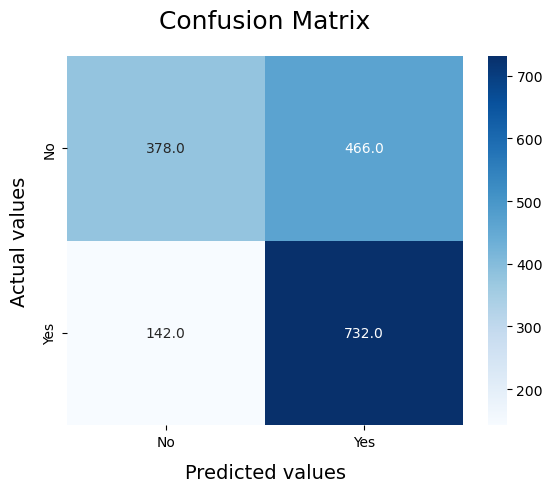

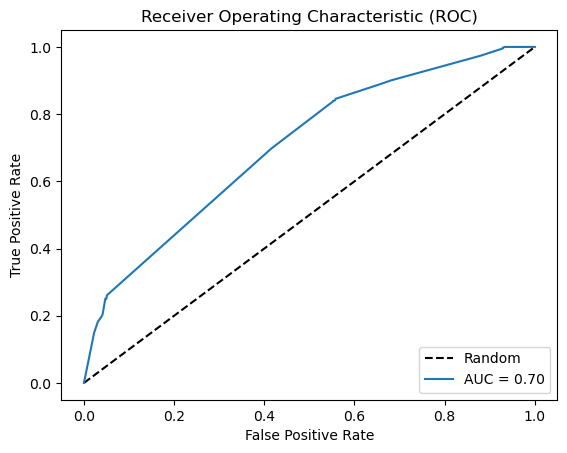

Performing Training on df_reduced

              precision    recall  f1-score   support

         0.0       0.74      0.45      0.56       844
         1.0       0.61      0.85      0.71       874

    accuracy                           0.65      1718
   macro avg       0.68      0.65      0.64      1718
weighted avg       0.68      0.65      0.64      1718



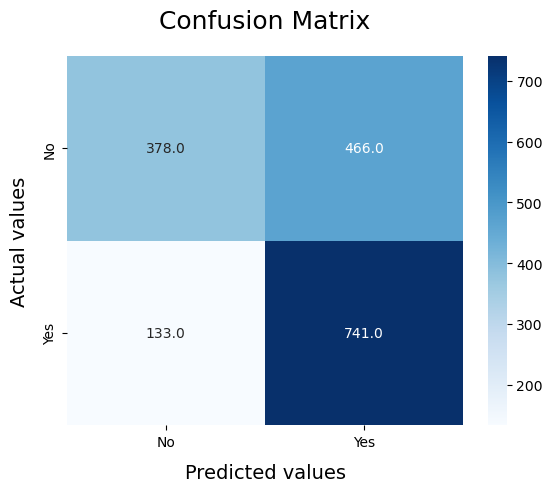

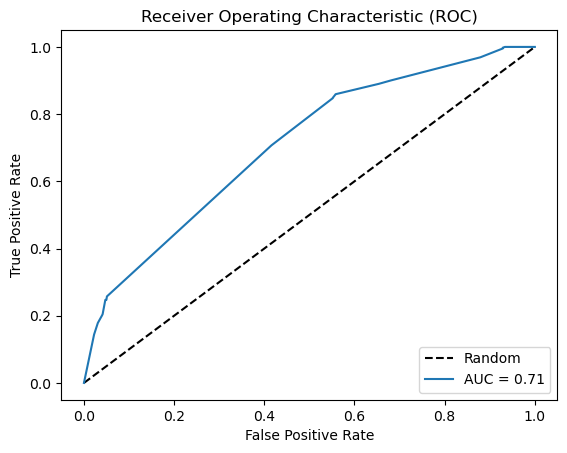

Performing Training on df_reduced_correlation

              precision    recall  f1-score   support

         0.0       0.73      0.45      0.56       844
         1.0       0.61      0.84      0.71       874

    accuracy                           0.65      1718
   macro avg       0.67      0.64      0.63      1718
weighted avg       0.67      0.65      0.63      1718



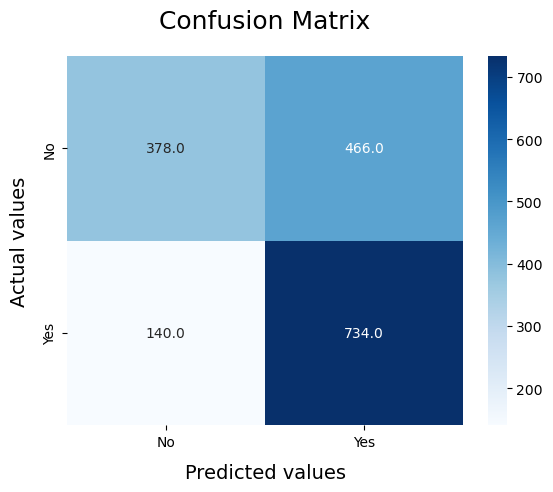

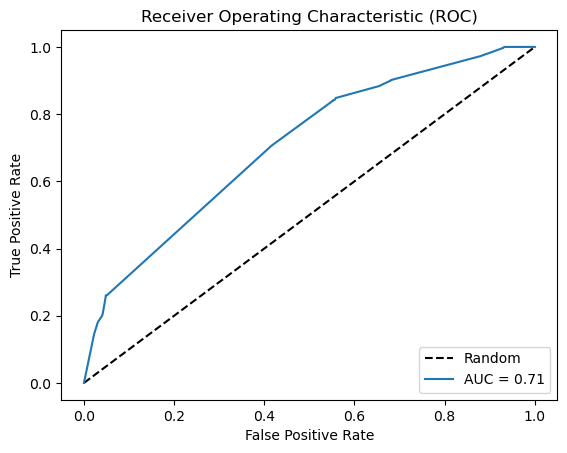

Performing Training on pca_DF

              precision    recall  f1-score   support

         0.0       0.65      0.62      0.63       844
         1.0       0.65      0.68      0.66       874

    accuracy                           0.65      1718
   macro avg       0.65      0.65      0.65      1718
weighted avg       0.65      0.65      0.65      1718



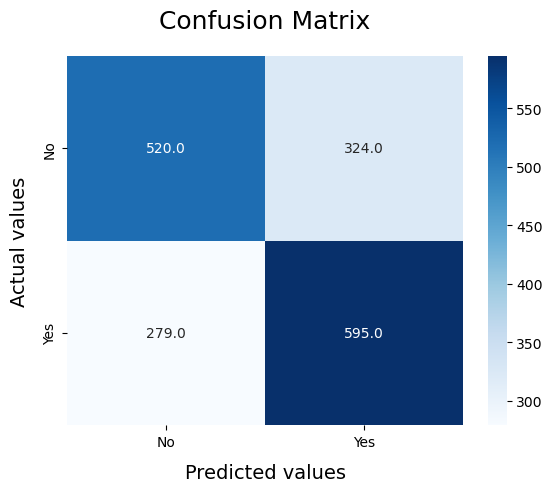

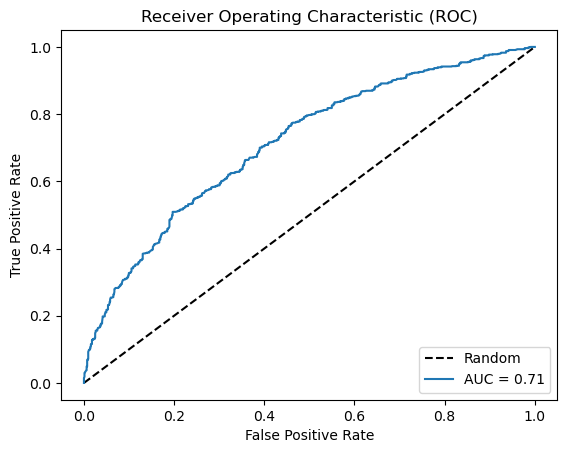

Performing Training on df_VIF

              precision    recall  f1-score   support

         0.0       0.73      0.44      0.55       844
         1.0       0.61      0.84      0.71       874

    accuracy                           0.65      1718
   macro avg       0.67      0.64      0.63      1718
weighted avg       0.67      0.65      0.63      1718



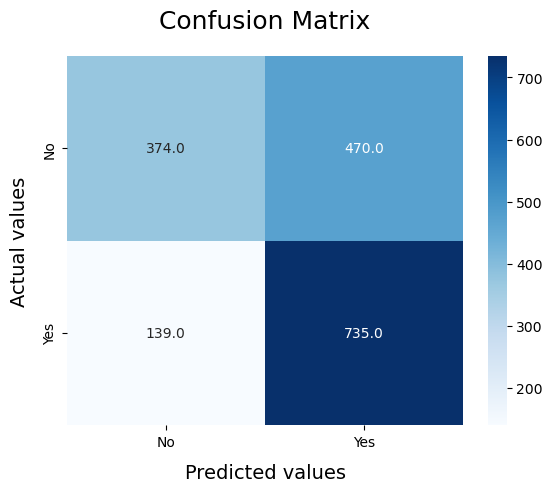

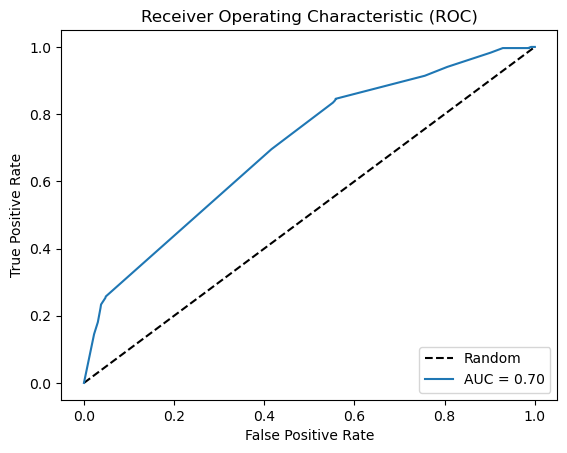

In [164]:
j=0
for i in data_frame_smote:
    print('Performing Training on',data_frame_names[j])
    print()
    X_resampled=i.drop('churn',axis=1)
    Y_resampled=i['churn']
    X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
    GNB=BernoulliNB()
    GNB.fit(X_train,y_train)
    model_list[data_frame_names[j]+"_BNB"] = GNB
    model_Evaluate(GNB)
    y_pred=GNB.predict(X_test)
    results=modelaccuracy(y_test, y_pred,"BernoulliNB",data_frame_names[j])
    result_df=pd.DataFrame([results])
    Evaluation_df=pd.concat([Evaluation_df,result_df],ignore_index=True)
    j=j+1

In [165]:
Evaluation_df.sort_values('Accuracy',ascending=False).reset_index(drop=True)

,Modelname,Data,Accuracy,Precision,Recall,F1-Score
0,XGBoost,df_reduced,98.31,98.31,98.32,98.31
1,Gradient Boosting Classifier,df_reduced_correlation,97.96,97.96,97.97,97.96
2,Gradient Boosting Classifier,df_reduced,97.90,97.90,97.92,97.90
3,Gradient Boosting Classifier,Norm_data,97.85,97.84,97.86,97.85
4,XGBoost,Norm_data,97.67,97.67,97.68,97.67
5,XGBoost,df_reduced_correlation,97.61,97.61,97.62,97.61
6,Random Forest Classifier(HPT done),df_reduced_correlation,96.27,96.27,96.28,96.27
7,Random Forest Classifier(HPT done),df_reduced,96.16,96.18,96.19,96.16
8,XGBoost,pca_DF,96.10,96.10,96.10,96.10
9,Random Forest Classifier(HPT done),Norm_data,96.04,96.07,96.07,96.04


In [166]:
top_models=Evaluation_df.sort_values('Accuracy',ascending=False).head(10)

In [167]:
top_models.reset_index(drop=True,inplace=True)

In [168]:
top_models['labels']=top_models['Modelname']+","+top_models['Data']

In [169]:
top_models

,Modelname,Data,Accuracy,Precision,Recall,F1-Score,labels
0,XGBoost,df_reduced,98.31,98.31,98.32,98.31,"XGBoost,df_reduced"
1,Gradient Boosting Classifier,df_reduced_correlation,97.96,97.96,97.97,97.96,"Gradient Boosting Classifier,df_reduced_correlation"
2,Gradient Boosting Classifier,df_reduced,97.90,97.90,97.92,97.90,"Gradient Boosting Classifier,df_reduced"
3,Gradient Boosting Classifier,Norm_data,97.85,97.84,97.86,97.85,"Gradient Boosting Classifier,Norm_data"
4,XGBoost,Norm_data,97.67,97.67,97.68,97.67,"XGBoost,Norm_data"
5,XGBoost,df_reduced_correlation,97.61,97.61,97.62,97.61,"XGBoost,df_reduced_correlation"
6,Random Forest Classifier(HPT done),df_reduced_correlation,96.27,96.27,96.28,96.27,"Random Forest Classifier(HPT done),df_reduced_correlation"
7,Random Forest Classifier(HPT done),df_reduced,96.16,96.18,96.19,96.16,"Random Forest Classifier(HPT done),df_reduced"
8,XGBoost,pca_DF,96.10,96.10,96.10,96.10,"XGBoost,pca_DF"
9,Random Forest Classifier(HPT done),Norm_data,96.04,96.07,96.07,96.04,"Random Forest Classifier(HPT done),Norm_data"


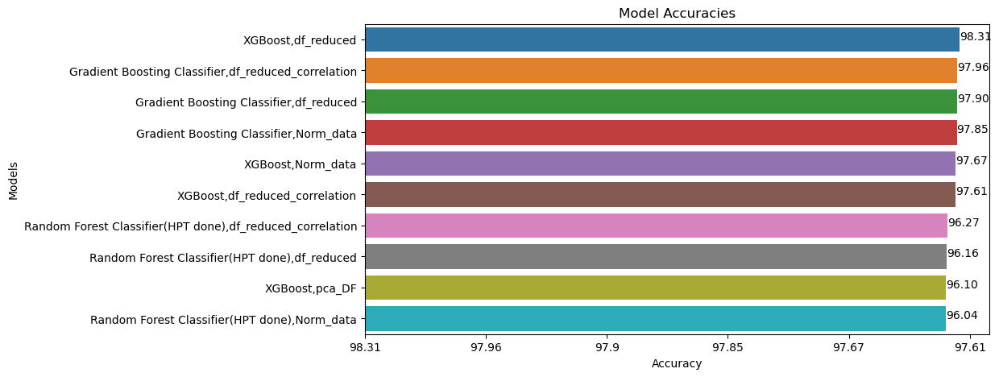

In [170]:
model_names = top_models.labels.values
accuracies =top_models.Accuracy.values
plt.figure(figsize=(10, 5))
# Create the bar plot using seaborn
ax = sns.barplot(y=model_names, x=accuracies,orient='h')
# Set x-axis tick label rotation
ax.set_xticklabels(accuracies)
# Add values inside the bars
for i, v in enumerate(accuracies):
    ax.text(v, i, f"{v:.2f}")
# Add labels and title
plt.ylabel('Models')
plt.xlabel('Accuracy')
plt.title('Model Accuracies')
# Display the plot
plt.show()

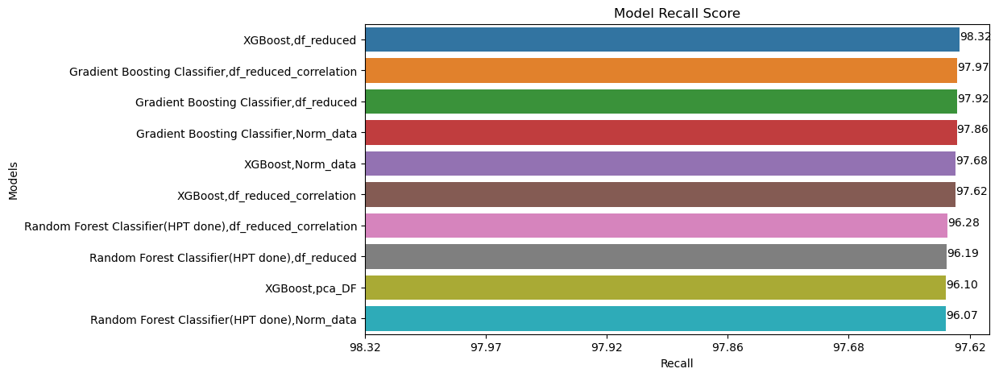

In [171]:
model_names = top_models.labels.values
recall_data =top_models.Recall.values

plt.figure(figsize=(10, 5))
# Create the bar plot using seaborn
ax = sns.barplot(y=model_names, x=recall_data,orient='h')
# Set x-axis tick label rotation
ax.set_xticklabels(recall_data)
# Add values inside the bars
for i, v in enumerate(recall_data):
    ax.text(v, i, f"{v:.2f}")
# Add labels and title
plt.ylabel('Models')
plt.xlabel('Recall')
plt.title('Model Recall Score')
# Display the plot
plt.show()

In [172]:
len(model_list)

55

In [173]:
from sklearn.model_selection import cross_val_score

In [174]:
scoring_metric = ['accuracy','precision_macro','recall_macro','f1_macro','roc_auc']

In [179]:
# Perform cross-validation and evaluate each model
model_scores = []
Cross_validation_df=pd.DataFrame(columns=['Modelname','Data','accuracy','precision_macro','recall_macro','f1_macro','roc_auc'])
ratio=[0.2,0.3,0.33]

In [180]:
Cross_validation_df

,Modelname,Data,accuracy,precision_macro,recall_macro,f1_macro,roc_auc


In [181]:
for i in model_list.keys():
    df_name=i.replace("_"+i.split("_")[-1],"")
    model_name=i.split("_")[-1]
    df_selected=data_frame_smote[data_frame_names.index(df_name)]
    X=df_selected.drop('churn',axis=1)
    Y=df_selected['churn']
    results={"Modelname":model_name,'Data':df_name}
    model_selected=model_list[i]
    for j in scoring_metric:
        break
        #scores = cross_val_score(model_selected, X, Y, cv=5, scoring=j)
        #results[j]=np.round(scores.mean()*100,2)
    #result_df=pd.DataFrame([results])
    #Cross_validation_df=pd.concat([Cross_validation_df,result_df],ignore_index=True)

In [186]:
#Cross_validation_df.to_csv("Cross_validation_df.csv",index=False)
Cross_validation_df=pd.read_csv("Cross_validation_df.csv")
Cross_validation_df

FileNotFoundError: [Errno 2] No such file or directory: 'Cross_validation_df.csv'

In [187]:
Cross_validation_df.sort_values("accuracy",ascending=False).head()

,Modelname,Data,accuracy,precision_macro,recall_macro,f1_macro,roc_auc


In [188]:
final_model=xgb_clf

In [189]:
X=Norm_data.drop('churn',axis=1)
Y=Norm_data['churn']

In [190]:
X_resampled,Y_resampled=perform_smote(Norm_data)

Class distribution before oversampling:
0.0    4293
1.0     707
Name: churn, dtype: int64
Class distribution after oversampling:
0.0    4293
1.0    4293
Name: churn, dtype: int64


In [191]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)
final_model.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98       844
         1.0       0.98      0.97      0.98       874

    accuracy                           0.98      1718
   macro avg       0.98      0.98      0.98      1718
weighted avg       0.98      0.98      0.98      1718



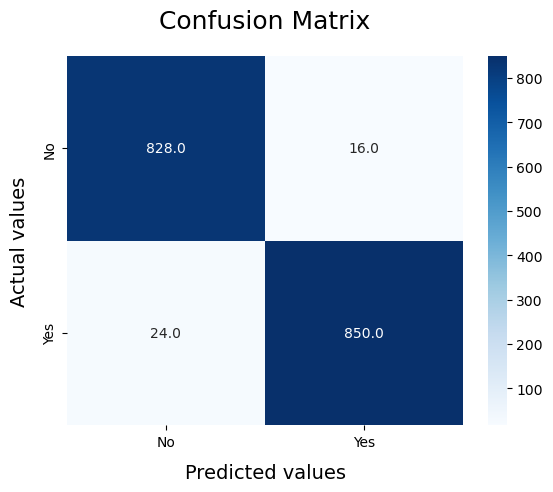

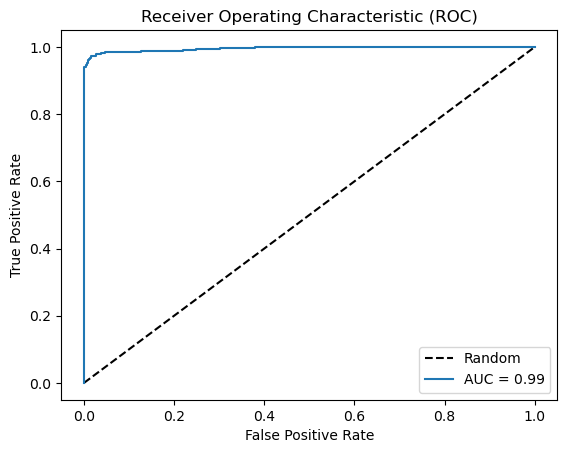

In [192]:
model_Evaluate(final_model)

In [193]:
# Save model using pickle
with open("final_model.pkl", "wb") as file:
    pickle.dump(final_model, file)

In [194]:
# Save model using pickle
with open("final_model.pkl", "rb") as file:
    final_model=pickle.load(file)

In [195]:
X=Norm_data.drop('churn',axis=1)

In [196]:
y_pred=final_model.predict(X)

In [197]:
y_test=Norm_data['churn']

In [198]:
modelaccuracy(y_test, y_pred, "GBM", "Orginal Data Set")

{'Accuracy': 99.28,
 'Precision': 98.63,
 'Recall': 98.4,
 'F1-Score': 98.51,
 'Modelname': 'GBM',
 'Data': 'Orginal Data Set'}

In [199]:
confusion_matrix(y_test,y_pred)

array([[4277,   16],
       [  20,  687]], dtype=int64)

In [200]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      4293
         1.0       0.98      0.97      0.97       707

    accuracy                           0.99      5000
   macro avg       0.99      0.98      0.99      5000
weighted avg       0.99      0.99      0.99      5000



              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      4293
         1.0       0.98      0.97      0.97       707

    accuracy                           0.99      5000
   macro avg       0.99      0.98      0.99      5000
weighted avg       0.99      0.99      0.99      5000



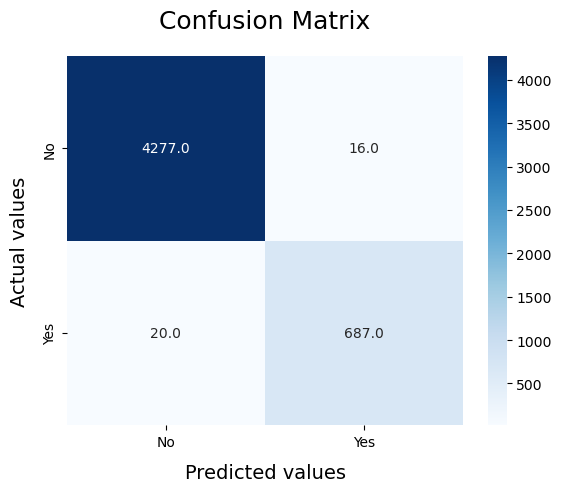

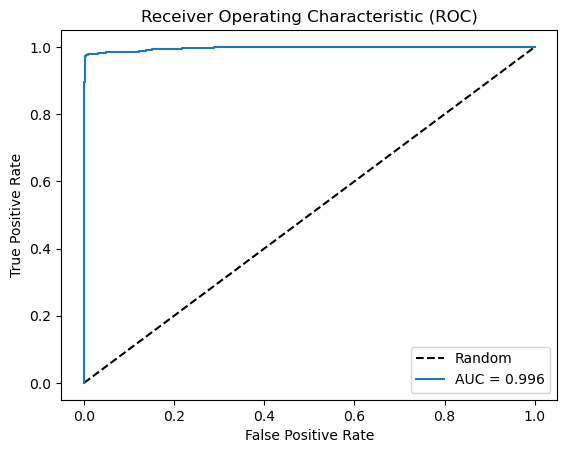

In [201]:
cf_matrix = confusion_matrix(y_test, y_pred)
categories = ['No', 'Yes']
sns.heatmap(cf_matrix, annot=True,cmap = 'Blues',fmt = '.1f',
xticklabels = categories, yticklabels = categories)
plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
plt.ylabel("Actual values" , fontdict = {'size':14}, labelpad = 10)
plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)
print(classification_report(y_test,y_pred))
try:
    y_pred_a = final_model.predict_proba(X)
    fpr, tpr, _ =roc_curve(y_test, y_pred_a[:,1])
except AttributeError as e:
    y_pred_a = model.decision_function(X_test)
    fpr, tpr, _ =roc_curve(y_test, y_pred_a)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.plot(fpr, tpr,label='AUC = {:.3f}'.format(roc_auc))
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

In [202]:
tsne = TSNE(n_components=2, random_state=42)

In [203]:
reduced_data = tsne.fit_transform(Norm_data)

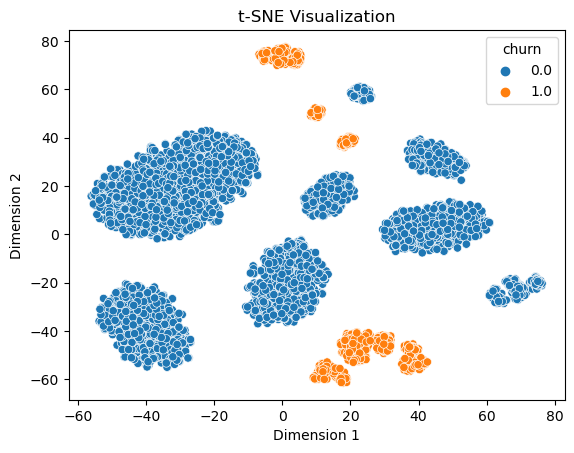

In [204]:
sns.scatterplot(reduced_data[:, 0], reduced_data[:, 1],hue=Norm_data.churn)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('t-SNE Visualization')
plt.show()

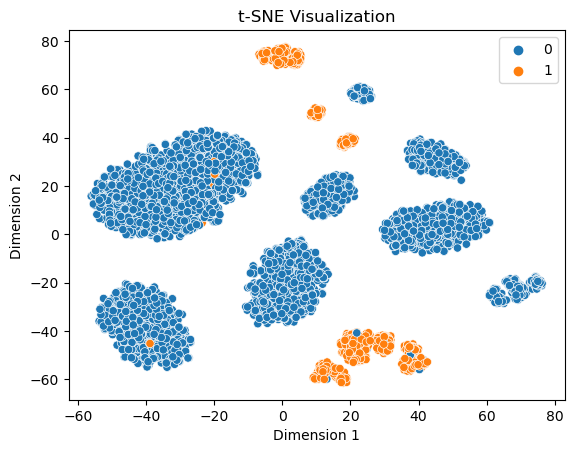

In [205]:
sns.scatterplot(reduced_data[:, 0], reduced_data[:, 1],hue=y_pred)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('t-SNE Visualization')
plt.show()

In [206]:
Norm_data['Model Prediction']=y_pred
prediction_list=[]
for i,j in Norm_data.iterrows():
    if(j['churn']==j['Model Prediction']):
        if(j['churn']==0):
            prediction_list.append("no")
        else:
            prediction_list.append("yes")
    elif(j['churn']==0 and j['Model Prediction']==1):
        prediction_list.append("False Negative")
    else:
        prediction_list.append("False Positive")
Norm_data['Prediction']=prediction_list

In [207]:
Norm_data.Prediction.value_counts()

no                4277
yes                687
False Positive      20
False Negative      16
Name: Prediction, dtype: int64

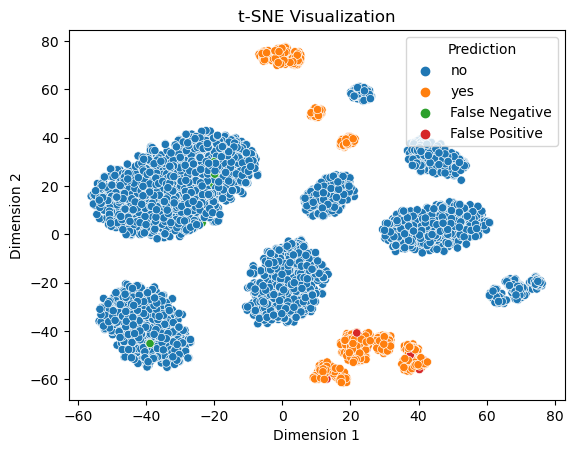

In [208]:
sns.scatterplot(reduced_data[:, 0], reduced_data[:, 1],hue=Norm_data['Prediction'])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('t-SNE Visualization')
plt.show()

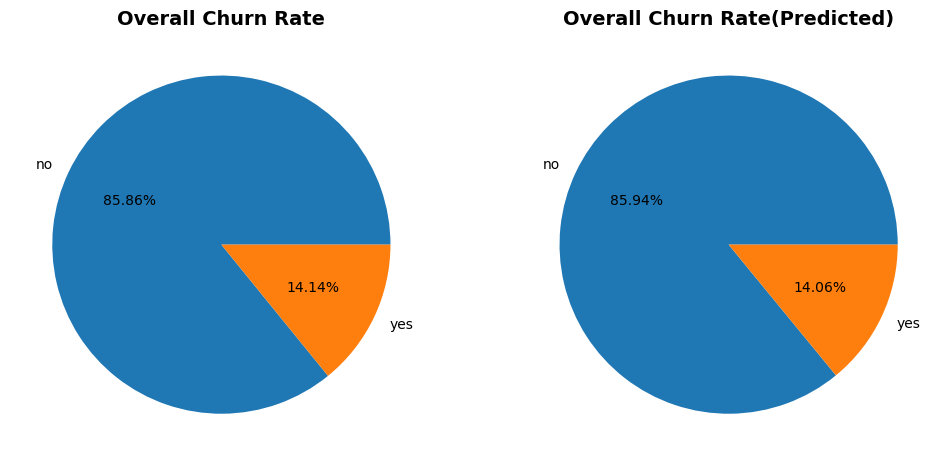

In [209]:
plt.figure(figsize=(12,10))
feature='churn'
data_plot=[]
plt.subplot(1,2,1)
for i in range(data[feature].nunique()):
    data_plot.append(data[feature].value_counts()[i])
labels=data[feature].value_counts().index
ax=plt.pie(x=data_plot,labels=labels,autopct='%1.2f%%')
plt.title("Overall Churn Rate", fontsize=14, fontweight='bold')
plt.subplot(1,2,2)
feature='Model Prediction'
data_plot=[]
for i in range(Norm_data[feature].nunique()):
    data_plot.append(Norm_data[feature].value_counts()[i])
labels=Norm_data[feature].value_counts().index
ax=plt.pie(x=data_plot,labels=['no','yes'],autopct='%1.2f%%')
plt.title("Overall Churn Rate(Predicted)", fontsize=14, fontweight='bold')
plt.show()

In [210]:
Norm_data.drop(['Prediction',"Model Prediction"],axis=1,inplace=True)

In [211]:
scoring_metric = ['accuracy','precision_macro','recall_macro','f1_macro','roc_auc']

In [212]:
model_scores = []
Cross_validation_df=pd.DataFrame(columns=['Modelname','Data','accuracy','precision_macro','recall_macro','f1_macro','roc_auc'])
Cross_validation_df

,Modelname,Data,accuracy,precision_macro,recall_macro,f1_macro,roc_auc


In [213]:
for i in model_list.keys():
    df_name=i.replace("_"+i.split("_")[-1],"")
    model_name=i.split("_")[-1]
    df_selected=data_frame_selection[data_frame_names.index(df_name)]
    X=df_selected.drop('churn',axis=1)
    Y=df_selected['churn']
    results={"Modelname":model_name,'Data':df_name}
    model_selected=model_list[i]
    for j in scoring_metric:
        break
        #cores = cross_val_score(model_selected, X, Y, cv=5, scoring=j)
        #esults[j]=np.round(scores.mean()*100,2)
    #esult_df=pd.DataFrame([results])
    #ross_validation_df=pd.concat([Cross_validation_df,result_df],ignore_index=True)

In [214]:
#Cross_validation_df.to_csv("Cross_validation_withoutSMOTE.csv",index=False)

In [215]:
Cross_validation_df.sort_values('accuracy',ascending=False).head(10)

,Modelname,Data,accuracy,precision_macro,recall_macro,f1_macro,roc_auc


In [216]:
from sklearn.model_selection import learning_curve

In [217]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled,Y_resampled,test_size=0.2,random_state=42)

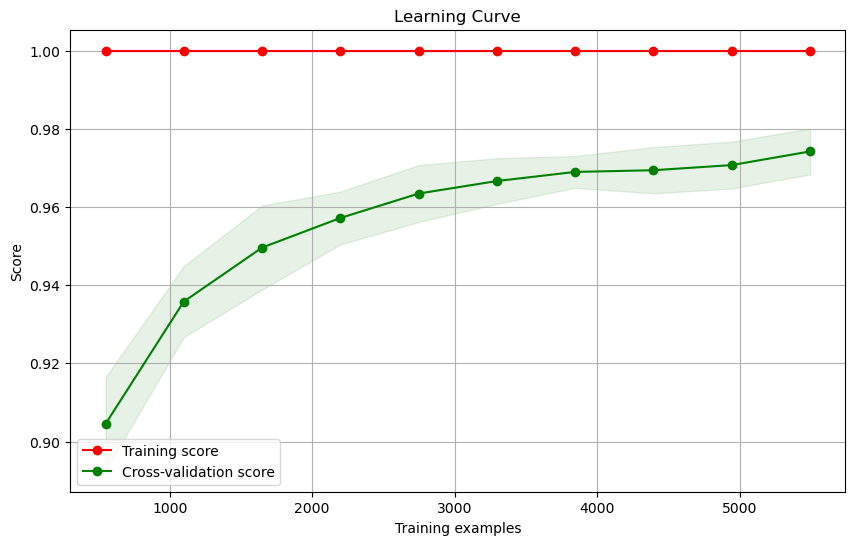

In [218]:
# Generate the learning curve data
train_sizes, train_scores, test_scores = learning_curve(
    xgb_clf, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)
# Calculate the mean and standard deviation of training scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
# Calculate the mean and standard deviation of test scores
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)
# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.title("Learning Curve")
plt.xlabel("Training examples")
plt.ylabel("Score")

# Plot the mean training scores
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")

# Plot the mean + standard deviation of training scores
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")

# Plot the mean test scores
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

# Plot the mean + standard deviation of test scores
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")

# Add legend and grid
plt.legend(loc="best")
plt.grid(True)

# Show the plot
plt.show()

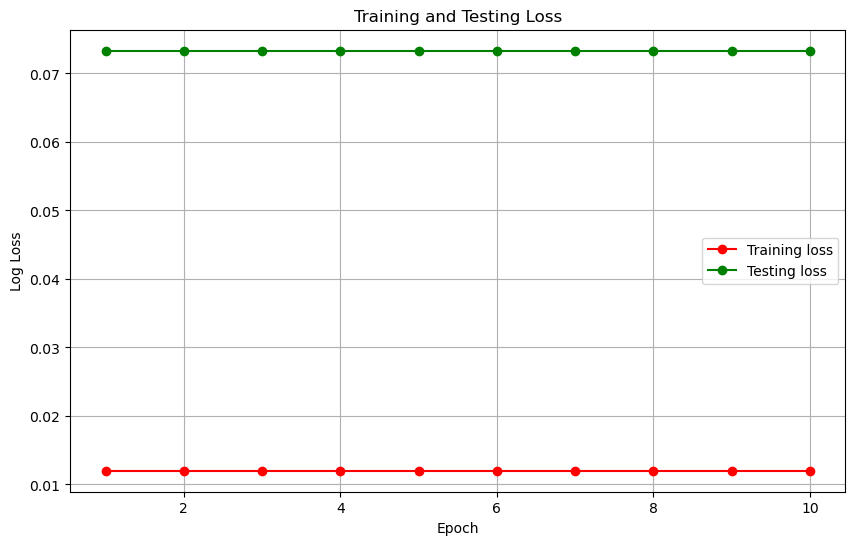

In [219]:
from sklearn.metrics import log_loss

# Lists to store training and testing loss
train_loss = []
test_loss = []

# Training loop
epochs = 10
for epoch in range(epochs):
    # Fit the classifier on the training data
    xgb_clf.fit(X_train, y_train)
    
    # Predict probabilities for training and testing data
    train_probs = xgb_clf.predict_proba(X_train)
    test_probs = xgb_clf.predict_proba(X_test)
    
    # Calculate log loss for training and testing data
    train_loss.append(log_loss(y_train, train_probs))
    test_loss.append(log_loss(y_test, test_probs))

# Plot the training and testing loss
plt.figure(figsize=(10, 6))
plt.title("Training and Testing Loss")
plt.xlabel("Epoch")
plt.ylabel("Log Loss")

# Plot the training loss
plt.plot(range(1, epochs + 1), train_loss, 'o-', color="r", label="Training loss")

# Plot the testing loss
plt.plot(range(1, epochs + 1), test_loss, 'o-', color="g", label="Testing loss")

# Add legend and grid
plt.legend(loc="best")
plt.grid(True)

# Show the plot
plt.show()


In [220]:
#The function below builds the model and returns cross validation scores, train score and learning curve data
def learn_curve(X,y):
    cv = StratifiedKFold(n_splits=5,random_state=11,shuffle=True) # Creating a StratifiedKFold object with 5 folds
    cv_scores = cross_val_score(xgb_clf,X,y,scoring="accuracy",cv=cv) # Storing the CV scores (accuracy) of each fold
    xgb_clf.fit(X,y) # Fitting the model
    train_score = xgb_clf.score(X,y) # Scoring the model on train set
    #Building the learning curve
    train_size,train_scores,test_scores = learning_curve(estimator=xgb_clf,X=X,y=y,cv=cv,scoring="accuracy",random_state=11)
    train_scores = 1-np.mean(train_scores,axis=1)#converting the accuracy score to misclassification rate
    test_scores = 1-np.mean(test_scores,axis=1)#converting the accuracy score to misclassification rate
    lc = pd.DataFrame({"Training_size":train_size,"Training_loss":train_scores,"Validation_loss":test_scores}).melt(id_vars="Training_size")
    return {"cv_scores":cv_scores,
           "train_score":train_score,
           "learning_curve":lc}

Cross Validation Accuracies:
-------------------------
[0.9708963911525029, 0.9726266744321491, 0.9749563191613279, 0.9819452533488643, 0.9732090856144437]

Mean Cross Validation Accuracy:
-------------------------
0.9747267447418576

Standard Deviation of Cross Validation Accuracy:
-------------------------
0.0038352252626339604

Training Accuracy:
---------------
0.9993011879804332




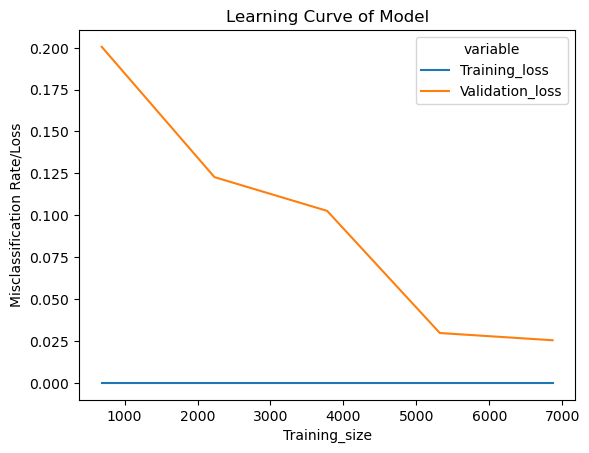

In [221]:
from sklearn.model_selection import StratifiedKFold
lc = learn_curve(X_resampled,Y_resampled)
print(f'Cross Validation Accuracies:\n{"-"*25}\n{list(lc["cv_scores"])}\n\n\
Mean Cross Validation Accuracy:\n{"-"*25}\n{np.mean(lc["cv_scores"])}\n\n\
Standard Deviation of Cross Validation Accuracy:\n{"-"*25}\n{np.std(lc["cv_scores"])}\n\n\
Training Accuracy:\n{"-"*15}\n{lc["train_score"]}\n\n')
sns.lineplot(data=lc["learning_curve"],x="Training_size",y="value",hue="variable")
plt.title("Learning Curve of Model")
plt.ylabel("Misclassification Rate/Loss")
plt.show()

In [222]:
X=Norm_data.drop('churn',axis=1)
Y=Norm_data['churn']

Cross Validation Accuracies:
-------------------------
[0.96, 0.961, 0.957, 0.966, 0.962]

Mean Cross Validation Accuracy:
-------------------------
0.9611999999999998

Standard Deviation of Cross Validation Accuracy:
-------------------------
0.0029257477676655616

Training Accuracy:
---------------
1.0




Text(0, 0.5, 'Misclassification Rate/Loss')

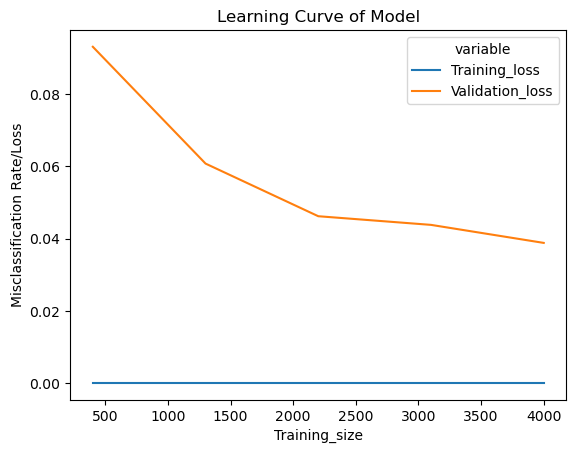

In [223]:
from sklearn.model_selection import StratifiedKFold
lc = learn_curve(X,Y)
print(f'Cross Validation Accuracies:\n{"-"*25}\n{list(lc["cv_scores"])}\n\n\
Mean Cross Validation Accuracy:\n{"-"*25}\n{np.mean(lc["cv_scores"])}\n\n\
Standard Deviation of Cross Validation Accuracy:\n{"-"*25}\n{np.std(lc["cv_scores"])}\n\n\
Training Accuracy:\n{"-"*15}\n{lc["train_score"]}\n\n')
sns.lineplot(data=lc["learning_curve"],x="Training_size",y="value",hue="variable")
plt.title("Learning Curve of Model")
plt.ylabel("Misclassification Rate/Loss")

In [224]:
train_df=pd.read_csv('Churn - Copy.csv')
train_df.drop('Unnamed: 0',axis=1,inplace=True)

FileNotFoundError: [Errno 2] No such file or directory: 'Churn - Copy.csv'

In [225]:
train_df.info()

NameError: name 'train_df' is not defined

In [226]:
train_df['day.charge']=pd.to_numeric(train_df['day.charge'], errors='coerce')
train_df['eve.mins']=pd.to_numeric(train_df['eve.mins'], errors='coerce')

NameError: name 'train_df' is not defined

In [228]:
train_df['day.charge'].fillna(train_df['day.charge'].mean(), inplace=True)
train_df['eve.mins'].fillna(train_df['eve.mins'].mean(), inplace=True)

NameError: name 'train_df' is not defined

In [ ]:
train_df = train_df.replace(label_categorical)

In [ ]:
train_df

In [ ]:
normalised_df=scaler.fit_transform(train_df)

In [ ]:
normalised_df=pd.DataFrame(normalised_df,columns=train_df.columns)

In [ ]:
normalised_df

In [ ]:
X_resampled,Y_resampled=perform_smote(normalised_df)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.33, random_state=42)

In [ ]:
xgb_clf.fit(X_train,y_train)

In [ ]:
model_Evaluate(xgb_clf)